# 1. Necessary Imports

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from skmultiflow.data import HyperplaneGenerator

import scipy.stats as stats
from scipy.stats import norm

import random
from numpy.random import seed
from numpy.random import randn
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import anderson

import tensorflow
import tensorflow.keras.backend as K
import tensorflow.keras.layers as layers

import warnings
warnings.filterwarnings('ignore')


In [3]:
true_mean_c0 = random.uniform(0.1,0.6)
true_mean_c1 = random.uniform(2,7)
true_std_c0 = random.uniform(0.05,0.45)
true_std_c1 = random.uniform(1.5,2.5)

# 2. Data Generation

In [4]:
def generate_data(mean_min,mean_max,smin,smax,nftrs,nsamples):    
    columns = []
    for i in range(0,nftrs):
        q = 'x'+str(i)
        columns.append(q)
    data = pd.DataFrame(columns=columns)

    for i in range(0,10):
        q = 'x'+str(i)
        data[q] = np.random.normal(loc=random.uniform(mean_min,mean_max), scale=random.uniform(smin,smax),size=nsamples)
    
    return data  


#probabilities = norm(sample_mean, sample_std).pdf(values) 

# Negative Data

In [5]:
data_neg = generate_data(0.1,0.6,0.05,0.45,10,30000)

# 3. Data Preparation / Train Test Split

In [6]:
 def prepare_data(data):
        
    train=data[0:int(len(data)*0.70)]  
    #validation_set=data[int((0.80*len(data))):int(len(data)*0.90)] 
    test=data[int((0.70*len(data))):int((0.90*len(data)))] 
    normal_stream=data[int((0.90*len(data))):len(data)] 
   
    return train, test, normal_stream

In [7]:
train_neg, test_neg, norm_stream_neg = prepare_data(data_neg)

In [8]:
norm_stream_neg

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
27000,0.426469,0.778264,-0.506504,0.443454,-0.980375,0.129893,0.448901,0.405978,0.118560,0.368938
27001,0.453844,0.767421,0.925566,0.351066,-0.322833,0.248054,0.549539,0.560724,0.209069,0.323268
27002,0.620955,0.654768,0.316472,0.442566,0.252320,0.113596,0.114641,0.088030,0.182710,0.114913
27003,0.405624,0.650998,-0.402317,0.360928,1.021033,0.656161,0.974991,0.068690,0.413587,0.271093
27004,0.594367,0.652614,0.513032,0.245085,0.014381,0.109475,0.556198,0.515721,0.296426,0.329835
...,...,...,...,...,...,...,...,...,...,...
29995,0.582724,0.427332,0.390089,0.149387,0.121092,0.692900,0.259298,0.449737,0.303239,0.223335
29996,0.381395,0.818173,-0.444591,0.341786,0.378627,0.470968,0.644435,0.560560,0.521304,0.390907
29997,0.396615,0.621422,-0.148812,0.166764,0.348420,0.388259,-0.273019,0.433786,0.558118,0.390391
29998,0.532653,0.537135,0.012541,0.451686,0.613386,-0.630178,0.177663,0.655080,0.481580,0.441117


In [9]:
data_pos = generate_data(2,7,1.5,2.5,10,30000)

In [10]:
train_pos, test_pos,norm_stream_pos = prepare_data(data_pos)

In [11]:
train_pos

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,5.812920,5.596840,6.219250,8.081183,6.907932,4.317185,0.364187,2.134049,6.468103,5.455730
1,5.629549,3.835730,6.100474,4.804795,7.754624,3.933925,0.059076,1.993509,8.451689,1.090193
2,6.692768,7.198405,6.650743,1.774467,6.247528,6.357185,2.144512,3.031193,2.569775,2.563848
3,6.235477,4.627418,4.584698,2.256560,4.971773,7.481597,1.486109,4.025997,6.315941,3.663857
4,8.292710,4.084768,6.796126,2.630490,6.043299,6.826542,2.893475,5.767412,5.498280,6.146048
...,...,...,...,...,...,...,...,...,...,...
20995,5.433682,4.428219,3.945189,7.098804,9.055174,6.633042,1.409017,3.727573,3.910251,7.696821
20996,7.555213,3.108256,6.039882,6.496521,6.232001,4.914664,2.454373,6.542936,4.637332,6.079875
20997,7.758386,2.293540,9.204172,4.460028,6.663765,8.121968,1.130857,1.888392,-0.804896,7.438458
20998,6.552411,2.525740,7.037355,5.688869,3.169191,2.666125,2.770364,4.493647,8.826207,6.952746


# 4. Training Autoencoder on Normal Dataset

In [12]:
def autoencoder (train,epochs,val_set):
    
    # set bottleneck 1/3 of the input layer size
    encoding_dim = int(np.floor(train.shape[-1]/3))
    
    # input layer size= # of attributes in the dataset after one-hot encoding
    input_layer = tensorflow.keras.Input(shape=train.shape[1:]) # Input Layer
    
    encoded = layers.Dense(encoding_dim, activation='sigmoid')(input_layer) # Code Layer
    decoded = layers.Dense(train.shape[1], activation='sigmoid')(encoded) # Output Laye
       
    
    autoencoder = tensorflow.keras.Model(input_layer, decoded)
    # above model maps an input to its reconstruction 
    
    encoder = tensorflow.keras.Model(input_layer, encoded)
    # above model maps input to its encoded representation 
    
   
    encoded_input = tensorflow.keras.Input(shape=(encoding_dim,))# Encoded Input
    decoder_layer = autoencoder.layers[-1]# Retrieve last layer of autoencoder model defined above
    decoder = tensorflow.keras.Model(encoded_input, decoder_layer(encoded_input))# Decoder Model
          
    autoencoder.compile(optimizer='adam', loss='mse') # Train autoencoder 
    history=autoencoder.fit(train,train, 
                epochs=epochs,
                batch_size=32,
                shuffle=True,
                validation_data=(val_set, val_set)).history
    return  autoencoder , history

In [13]:
def train_encoders(X_Positive,X_Negative, epochs):
    
    X_Positive_train=X_Positive[0:int(len(X_Positive)*0.90)]
    X_Positive_test=X_Positive[int((0.90*len(X_Positive))):len(X_Positive)-1]
    
    X_Negative_train=X_Negative[0:int(len(X_Negative)*0.90)]
    X_Negative_test=X_Negative[int((0.90*len(X_Negative))):len(X_Negative)-1]

    print("Training Autoencoder on Positive Examples ")
    encoder_pos_class, history_positive_class=autoencoder(X_Positive_train,epochs,X_Positive_test)
    print("Training Autoencoder on Negative Examples ")
    encoder_neg_class,history_negative_class=autoencoder(X_Negative_train,epochs,X_Negative_test)
    
    return encoder_pos_class, history_positive_class ,encoder_neg_class,history_negative_class

encoder_pos_class, history_positive_class ,encoder_neg_class,history_negative_class=train_encoders(train_pos,train_neg,100)

In [15]:
#Plot the model loss(train/test) for give number of epochs
def plot_loss(history):
    plt.plot(history['loss'], linewidth=2, label='Train')
    plt.plot(history['val_loss'], linewidth=2, label='Validation')
    plt.legend(loc='upper right')
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    #plt.ylim(ymin=0.70,ymax=1)
    plt.show()

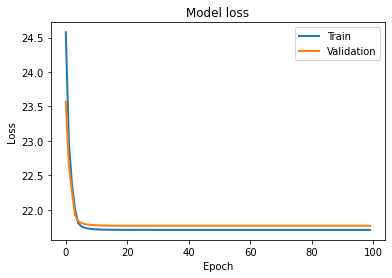

In [16]:
plot_loss(history_positive_class)

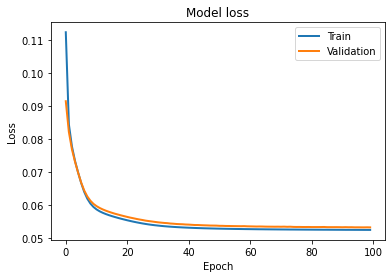

In [17]:
plot_loss(history_negative_class)

In [18]:
def mse_predictions(test, encoder):
    #test=data[int((0.66*len(data))):len(data)-1]
    #pos_test, neg_test=encode(test)
    #Y_test=test['class']
    #X_test=test.drop(['class'],axis=1)
    test=np.array(test)
    predictions=[]
    for i in range(0, test.shape[0]):
        ROW = np.array([test[i]])
        pred= encoder.predict(ROW) 
        mse = np.mean(np.power(test[i] - pred, 2))
        predictions.append(mse)
        #print(test[i] ,pred,mse)
    return predictions

In [19]:
def plot_results(predictions):
    df=pd.DataFrame(predictions,columns=['MSE'])
    #df['class']=pd.Series(Y_test)
    df['MSE']=df['MSE'].round(2)
    #df_positive_class=df[df['class']==1]
    #df_negative_class=df[df['class']==0]
   
    mean=np.round(np.mean( df['MSE']),3)
    max=np.round(np.max( df['MSE']),3)
    min=np.round(np.min( df['MSE']),3)
    var=np.round(np.var( df['MSE']),3)
    med=np.round(np.median(df['MSE']),3)
    
    
    f, axes = plt.subplots(1, 2,figsize=(16,4))
    f.suptitle('Boxplots and Normal Distribution plot for MSE Distribution')
    #axes[0, 0].set_title('MSE of Positive Class')
    sns.boxplot(x=df['MSE'], data=df, ax=axes[0])
    #axes[0, 1].set_title('MSE of Negative Class')    
    #sns.boxplot(x=df_negative_class['MSE'], data=df_negative_class  , ax=axes[1])
    sns.distplot(x=df['MSE'],  ax=axes[1])
    print('mean={},median={} ,max={},min={},variance={}'.format(mean,med,max,min,var))
    
    fig, ax = plt.subplots(figsize=(16,5))
    ax.set_title('MSE plot ')
    plt.plot(df['MSE'],label="MSE")
    #plt.plot(df_positive_class['MSE'],label="MSE of Positive Class")
    plt.legend()
    plt.show()  
    #return df

# 5. Making Predictions on Negative Test  Data by Negative AE

In [20]:
predictions_neg=mse_predictions(test_neg,encoder_neg_class)

mean=0.053,median=0.05 ,max=0.34,min=0.0,variance=0.001


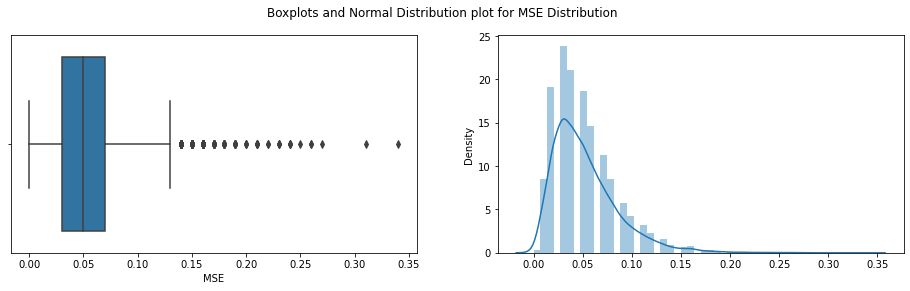

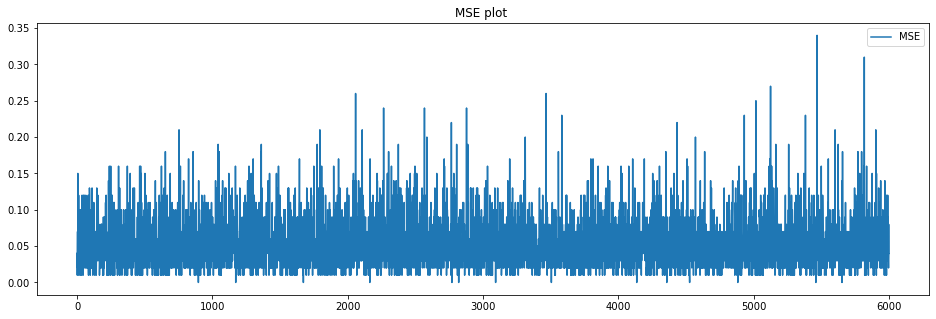

In [21]:
plot_results(predictions_neg)

In [22]:
def make_batches(test_data):
    data=np.array(test_data)
    batch_size=32
    batches={}
    count=0
    for index in range(0,data.shape[0],batch_size):
        batches[count]=data[index:min(index+batch_size,data.shape[0]),:]
        count+=1
    return batches,batch_size
    #print(batch.shape)

In [23]:
batches_neg,batch_size=make_batches(test_neg)

In [24]:
# Anderson-Darling Test
def Anderson_Darling(data):
    result = anderson(data)
    print('Statistic: %.3f' % result.statistic)
    p = 0
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < result.critical_values[i]:
            print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
        else:
            print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

In [25]:
# D'Agostino and Pearson's Test
def D_Agostino(data):
    stat, p = normaltest(data)
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

In [26]:
# Shapiro-Wilk Test
def Shapiro_Wilk(data):
    stat, p = shapiro(data)
    print('Statistics=%.3f, p=%.10f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

In [27]:
def compute_instance_loss_batch_loss(batch,batch_size,encoder):
    mse_list=[]
    mse_sum=0  
    for i in range(0,batch.shape[0]):
        ROW = np.array([batch[i]])
        pred= encoder.predict(ROW) 
        mse = np.round(np.mean(np.power(batch[i] - pred, 2)),5)
        mse_list.append(mse)
        mse_sum+=mse
    avg_mse=mse_sum/batch_size
    return mse_list,avg_mse   

In [28]:
def check_all_batch_normality(batches,encoder,batch_size):
    batch_avg_mse=[]
    batch_mse_values={}
    for b in batches:
        print("\n ********************")
        print('Batch: {}'.format(b))
        mse_list,average_mse=compute_instance_loss_batch_loss(batches[b],batch_size,encoder)
        plot_results(mse_list)
        
        print("\nShapiro_Wilk Test")
        Shapiro_Wilk(mse_list)
       # print("D_Agostino Test")
       # D_Agostino(mse_list)
        print("\nAnderson_Darling Test")
        Anderson_Darling(mse_list)
        batch_avg_mse.append(average_mse)
        batch_mse_values[b]=mse_list
    return batch_avg_mse,batch_mse_values

# 6. Make Predictions on Negative Test Data from Negative AE in Batches

batch_avg_mse_neg,batch_mse_values_neg=check_all_batch_normality(batches_neg,encoder_neg_class,32)

In [32]:
len(batch_avg_mse_neg)

188

In [33]:
Anderson_Darling(batch_avg_mse_neg)

Statistic: 0.611
15.000: 0.564, data does not look normal (reject H0)
10.000: 0.643, data looks normal (fail to reject H0)
5.000: 0.771, data looks normal (fail to reject H0)
2.500: 0.899, data looks normal (fail to reject H0)
1.000: 1.070, data looks normal (fail to reject H0)


mean=0.052,median=0.05 ,max=0.07,min=0.03,variance=0.0


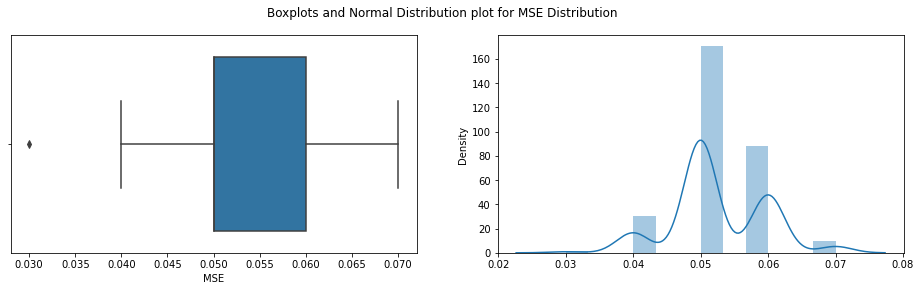

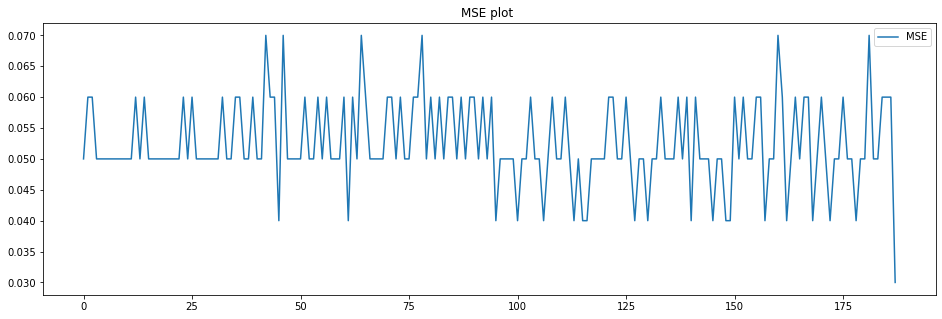

In [31]:
plot_results(batch_avg_mse_neg)

# 7. Compute Instance and Batch Thresholds

In [31]:
def compute_instance_threshold_firstN_batches(batch_avg_mse_values,N):
    zscore_list=[]
    #value_list=[]
    for k in range(0,N):
        value_list=batch_avg_mse_values[k]
         #Z_SCORE
        mean=np.mean(value_list)
        sigma=np.std(value_list)
        thres_zscore=(mean+3*sigma).round(4)
        zscore_list.append(thres_zscore)
        #print (value_list)
        #print(zscore_list)
    return (np.mean(zscore_list).round(4)) , zscore_list     

In [32]:
instance_thresh_neg,zscore_list_neg =compute_instance_threshold_firstN_batches(batch_mse_values_neg,30)

In [33]:
instance_thresh_neg


0.0947

In [34]:
Anderson_Darling(zscore_list_neg)

Statistic: 0.465
15.000: 0.521, data looks normal (fail to reject H0)
10.000: 0.593, data looks normal (fail to reject H0)
5.000: 0.712, data looks normal (fail to reject H0)
2.500: 0.830, data looks normal (fail to reject H0)
1.000: 0.988, data looks normal (fail to reject H0)


In [35]:
## computes loss threshold uisng IQR as well as ZScore from first test batch 
def compute_batch_threshold_testdata(batch_avg_mse):
    #val_loss=history['val_loss']
    ## Quartile Method 
    Q1=np.quantile(batch_avg_mse,0.25)
    Q3=np.quantile(batch_avg_mse,0.75)
    IQR=Q3-Q1
    thres_iqr=(Q3 + 1.5*IQR).round(4)
    #Z_SCORE
    mean=np.mean(batch_avg_mse)
    sigma=np.std(batch_avg_mse)
    thres_zscore=(mean+3*sigma).round(4)
    thresh_max=np.round((np.max(batch_avg_mse)),3)
    return thres_iqr, thres_zscore ,thresh_max

In [36]:
thres_iqr_batch_neg, thres_zscore_batch_neg ,thresh_max_batch_neg=compute_batch_threshold_testdata(batch_avg_mse_neg)

In [37]:
thres_zscore_batch_neg

0.0458

In [38]:
def threshold_exceed_count(batch_mse_values, thr):
    exceed_count={}
    for key in batch_mse_values.keys():
        count=0
        list=batch_mse_values[key]
        for a in range(0,len(list)):
            if list[a]>thr:
                count+=1
        exceed_count[key]=count 
    values = exceed_count.values()
    total = sum(values)
    return exceed_count,total

In [39]:
# Counts the MSE values exceeding threshold in each batch 
exceed_count_neg,total_neg=threshold_exceed_count(batch_mse_values_neg,instance_thresh_neg)

In [40]:
exceed_list_neg=[]
for key in exceed_count_neg.keys():
    exceed_list_neg.append(exceed_count_neg[key])

mean=0.404,median=0.0 ,max=4,min=0,variance=0.486


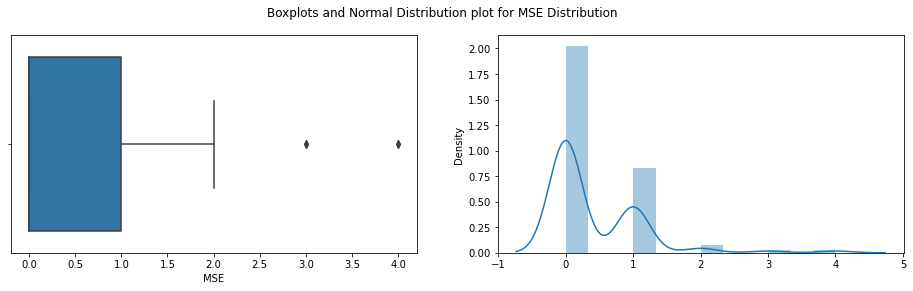

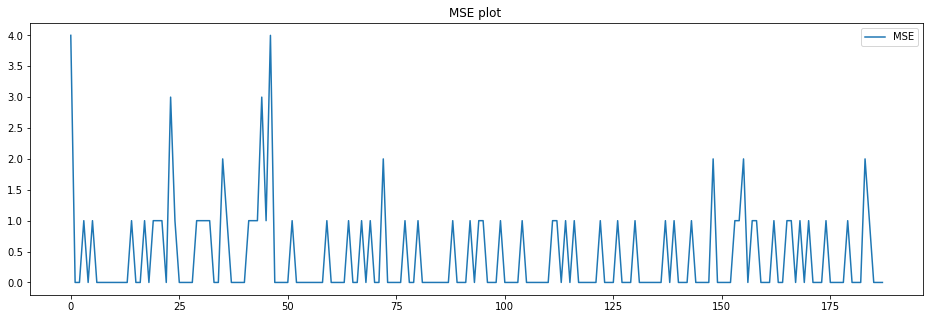

In [41]:
plot_results(exceed_list_neg)

In [42]:
count_thresh_neg=np.max(exceed_list_neg)

In [43]:
count_thresh_neg

4

# 8. Making Predictions on Positive Test Data by  Positive AE

In [44]:
predictions_pos=mse_predictions(test_pos,encoder_pos_class)

mean=17.25,median=16.83 ,max=38.63,min=3.28,variance=24.127


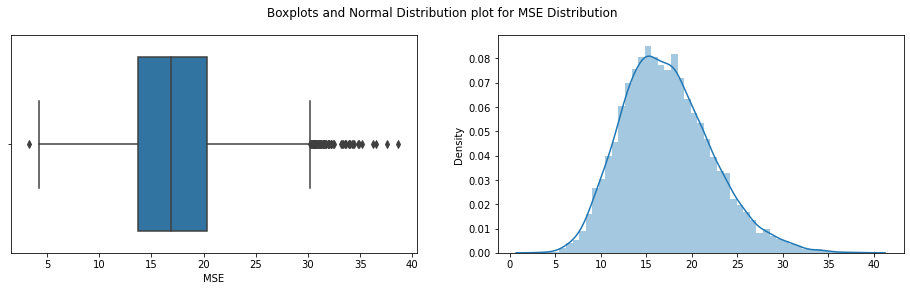

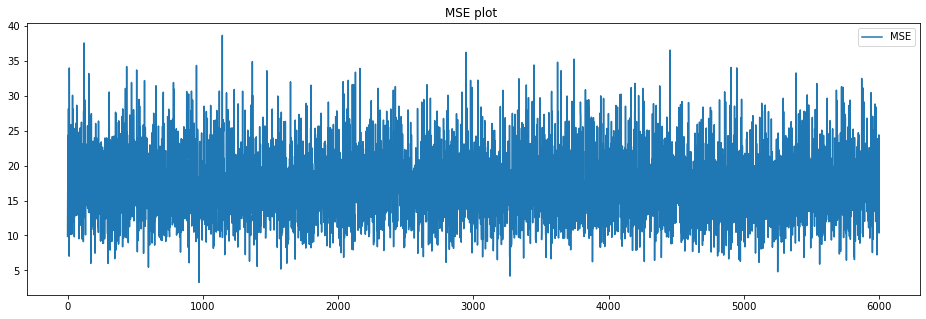

In [45]:
plot_results(predictions_pos)

# 9 Making Predictions on Positive Test Data by Positive Ae in Batches

In [46]:
batches_pos, batch_size=make_batches(test_pos)


 ********************
Batch: 0
mean=17.898,median=17.7 ,max=33.96,min=7.04,variance=37.725


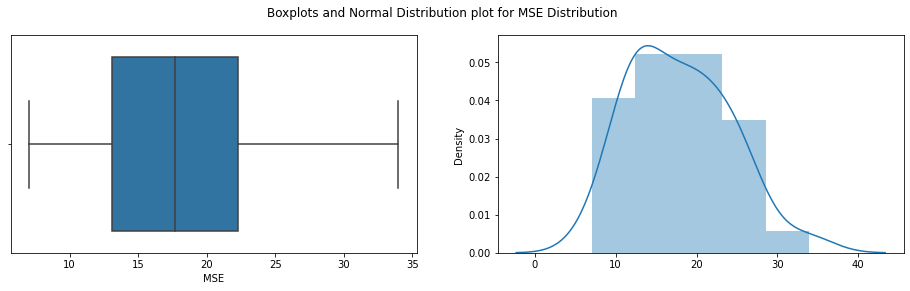

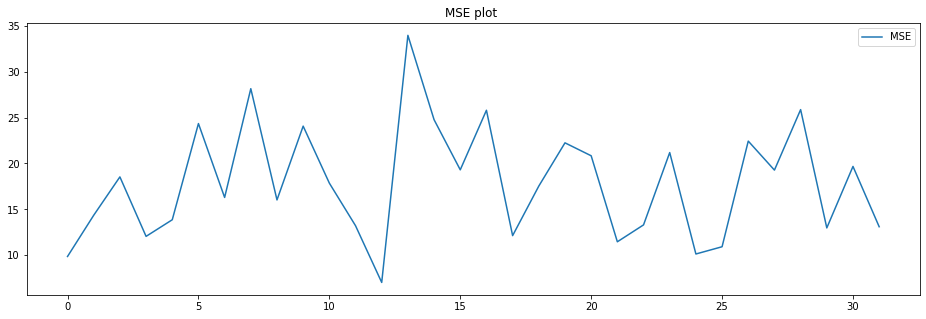


Shapiro_Wilk Test
Statistics=0.968, p=0.4539883435
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.361
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 1
mean=18.256,median=17.345 ,max=30.06,min=9.81,variance=26.555


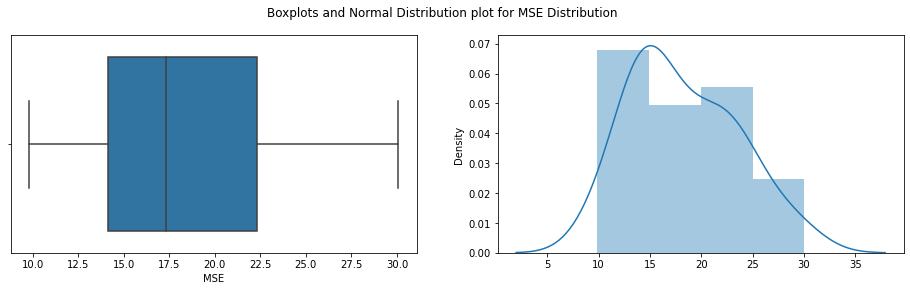

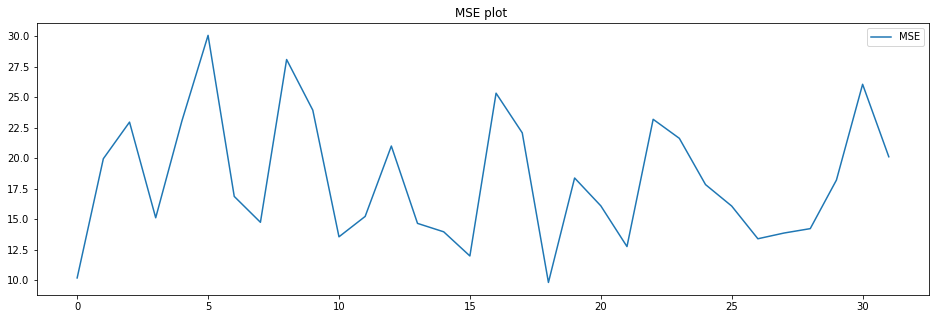


Shapiro_Wilk Test
Statistics=0.961, p=0.3003172278
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.468
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 2
mean=18.168,median=17.875 ,max=28.63,min=9.53,variance=22.312


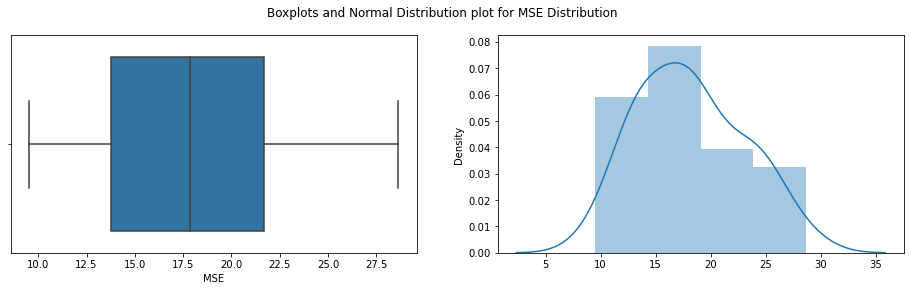

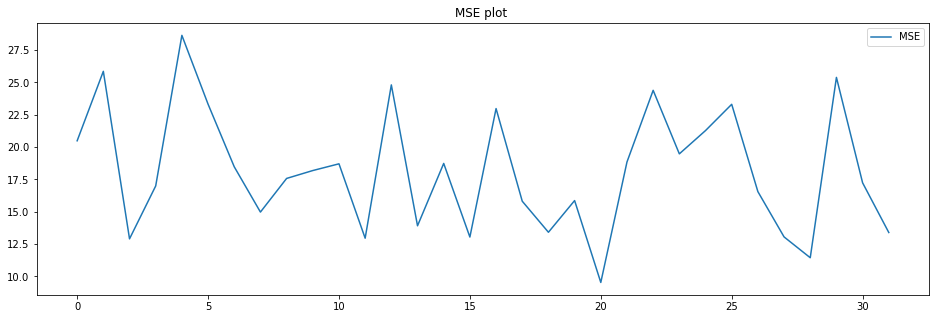


Shapiro_Wilk Test
Statistics=0.967, p=0.4189357460
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.403
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 3
mean=17.944,median=16.885 ,max=37.54,min=9.12,variance=37.727


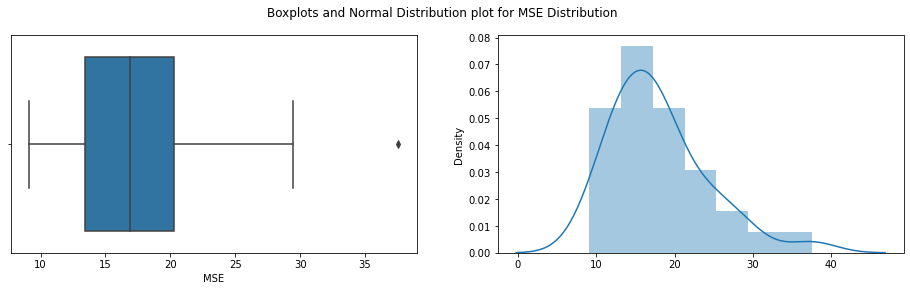

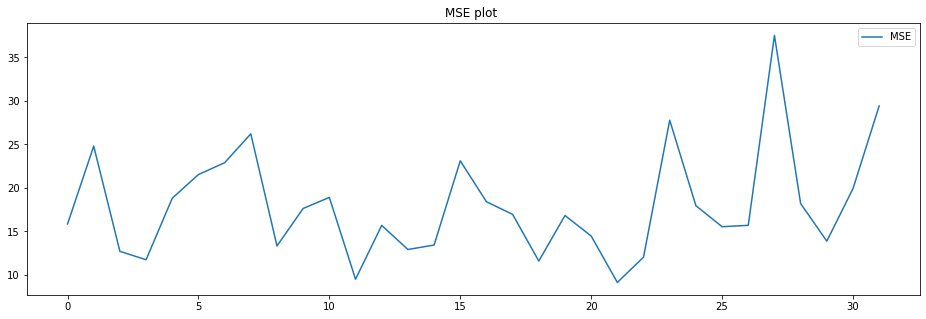


Shapiro_Wilk Test
Statistics=0.918, p=0.0183064509
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.753
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 4
mean=18.141,median=17.33 ,max=33.17,min=10.09,variance=21.72


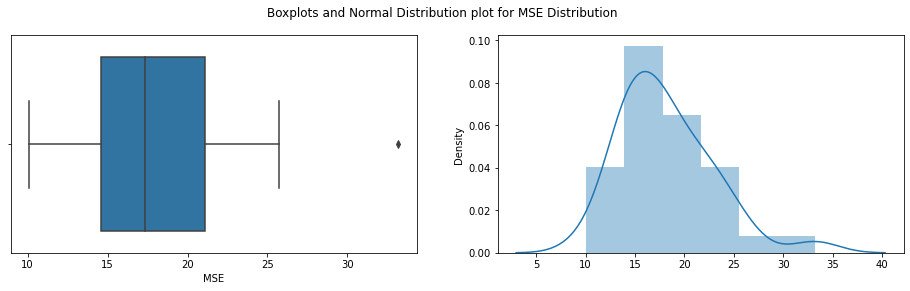

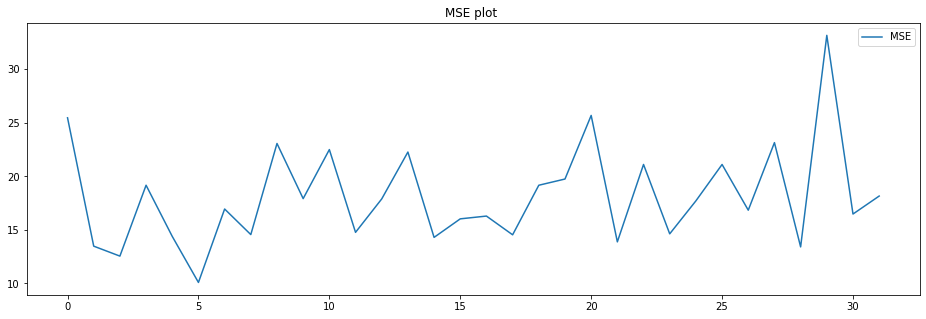


Shapiro_Wilk Test
Statistics=0.930, p=0.0402614251
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.637
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 5
mean=18.322,median=18.795 ,max=27.44,min=6.01,variance=23.142


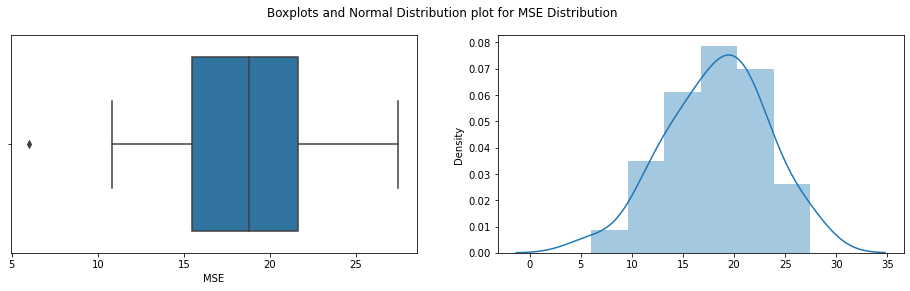

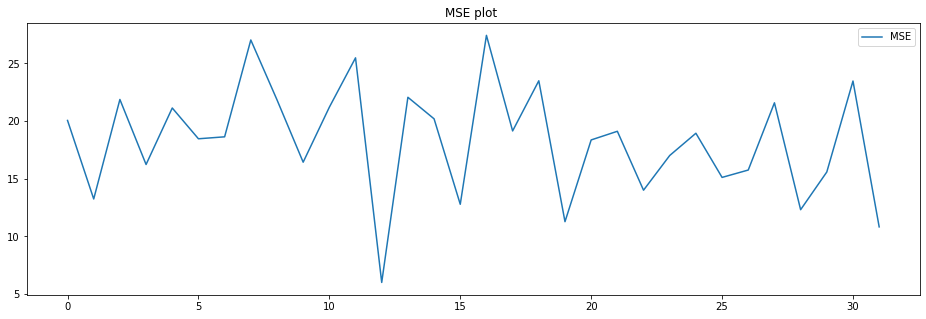


Shapiro_Wilk Test
Statistics=0.985, p=0.9218716025
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.174
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 6
mean=16.52,median=17.395 ,max=26.02,min=7.47,variance=24.387


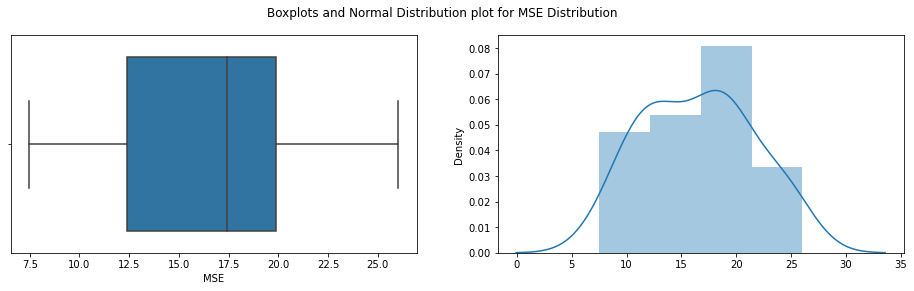

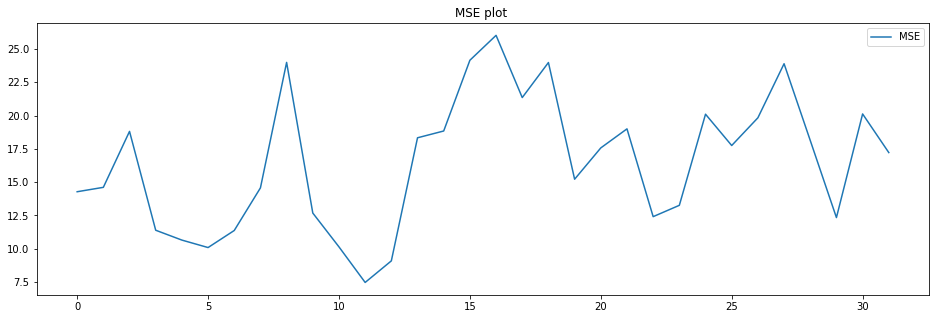


Shapiro_Wilk Test
Statistics=0.965, p=0.3641574681
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.383
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 7
mean=16.427,median=16.51 ,max=26.37,min=9.19,variance=16.842


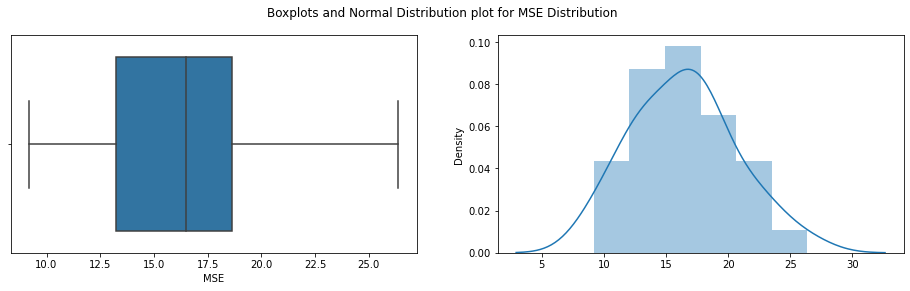

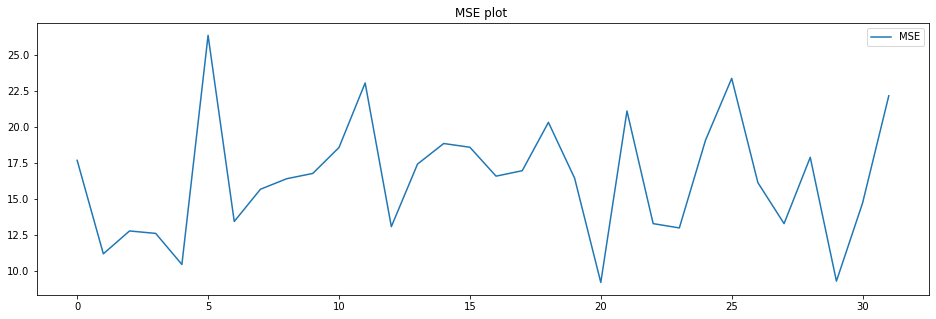


Shapiro_Wilk Test
Statistics=0.978, p=0.7396585345
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.246
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 8
mean=15.863,median=15.55 ,max=23.95,min=8.87,variance=14.582


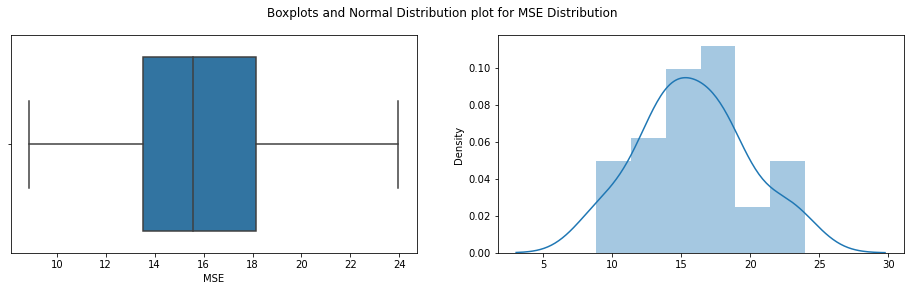

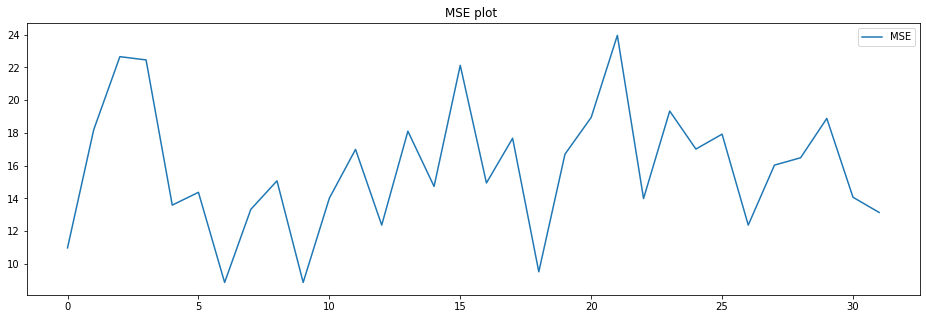


Shapiro_Wilk Test
Statistics=0.974, p=0.6198783517
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.247
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 9
mean=16.497,median=16.7 ,max=30.52,min=6.0,variance=25.9


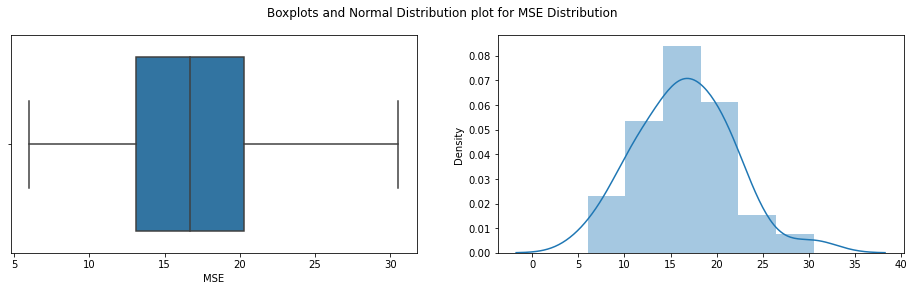

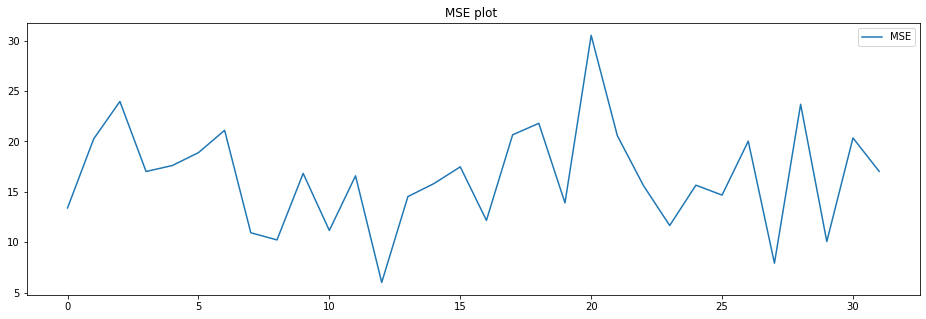


Shapiro_Wilk Test
Statistics=0.983, p=0.8827856779
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.191
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 10
mean=16.889,median=16.925 ,max=24.22,min=6.68,variance=19.727


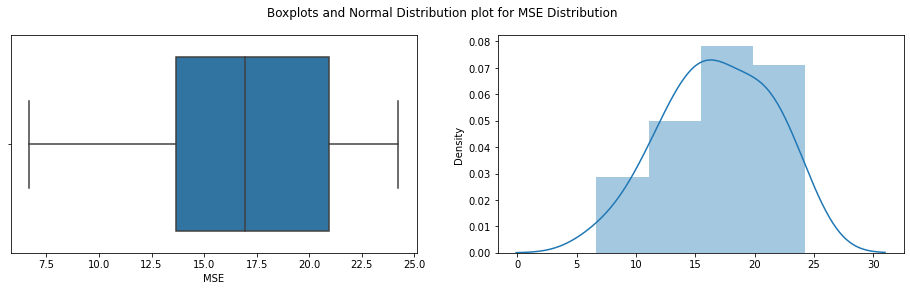

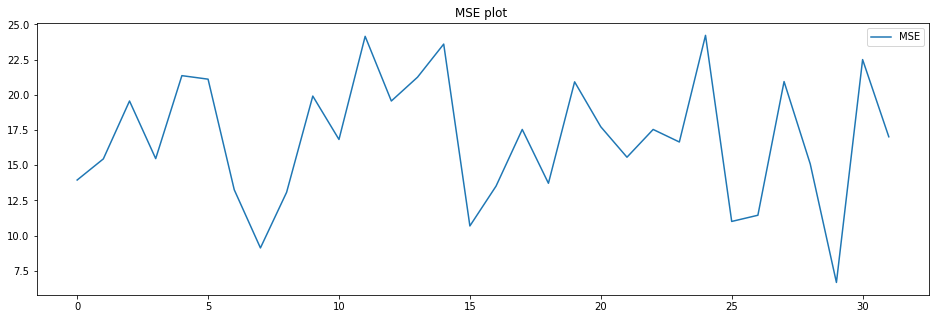


Shapiro_Wilk Test
Statistics=0.976, p=0.6638494134
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.233
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 11
mean=17.068,median=16.66 ,max=27.64,min=7.94,variance=31.982


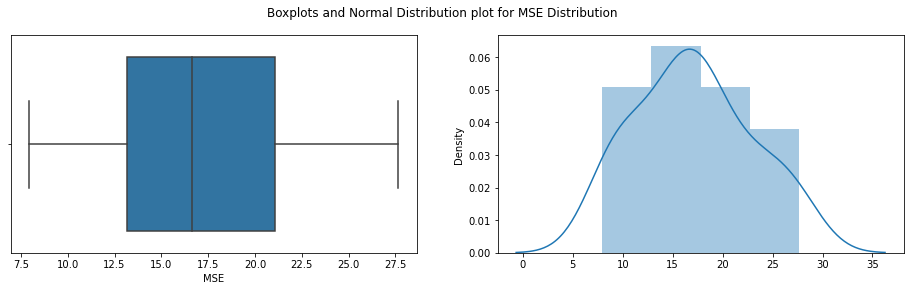

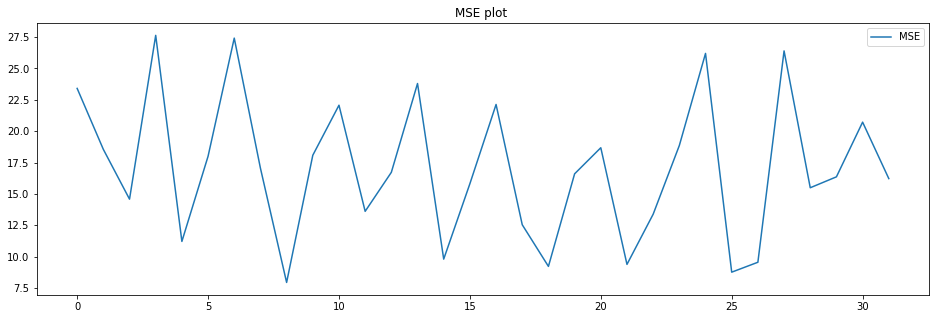


Shapiro_Wilk Test
Statistics=0.956, p=0.2160760164
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.356
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 12
mean=16.726,median=15.285 ,max=28.11,min=8.38,variance=28.624


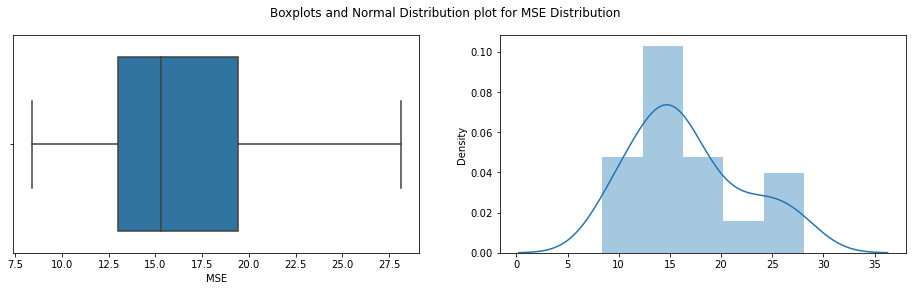

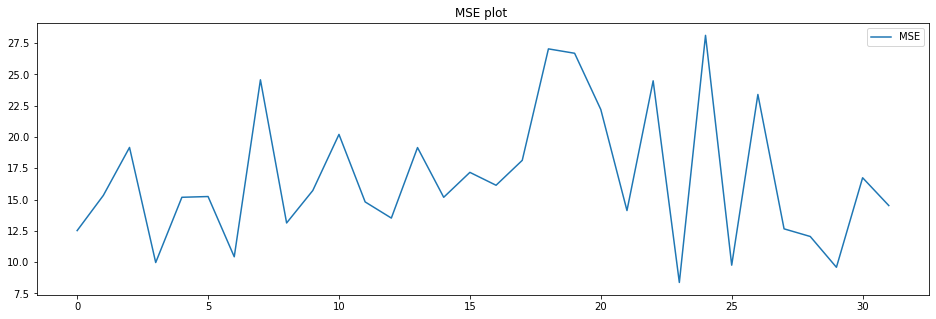


Shapiro_Wilk Test
Statistics=0.940, p=0.0747934729
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.674
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 13
mean=18.187,median=18.19 ,max=34.17,min=9.67,variance=35.997


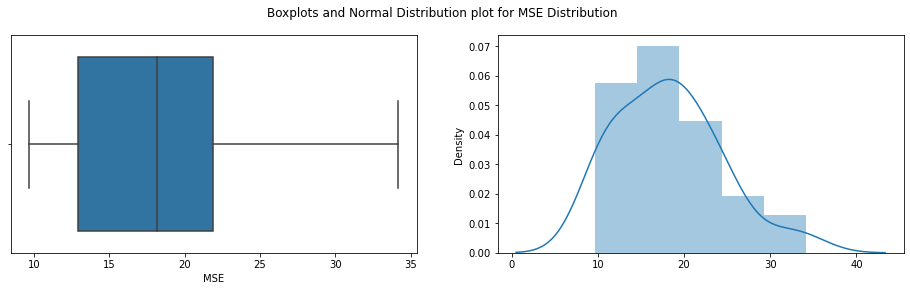

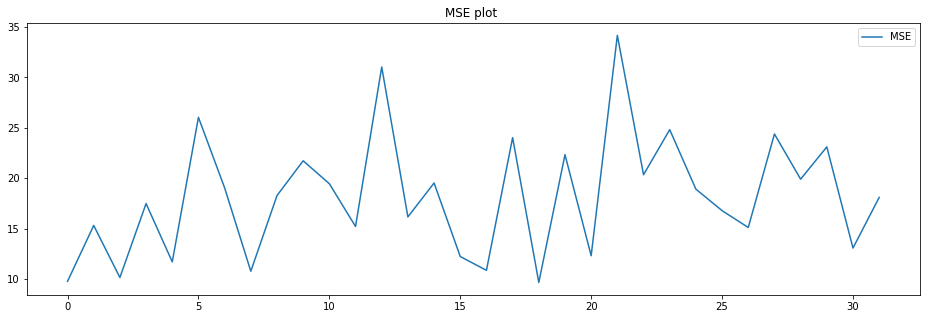


Shapiro_Wilk Test
Statistics=0.953, p=0.1747102141
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.345
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 14
mean=17.918,median=16.78 ,max=31.88,min=8.97,variance=23.249


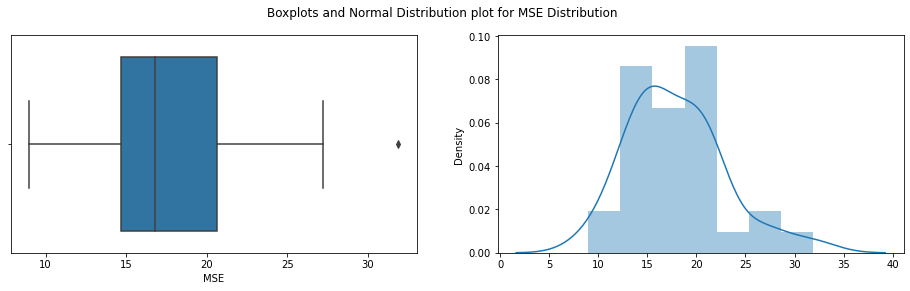

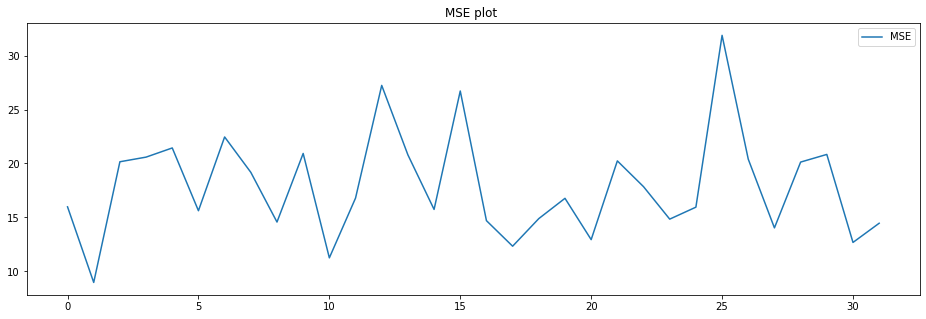


Shapiro_Wilk Test
Statistics=0.946, p=0.1095933765
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.622
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 15
mean=19.556,median=18.32 ,max=33.67,min=12.09,variance=18.9


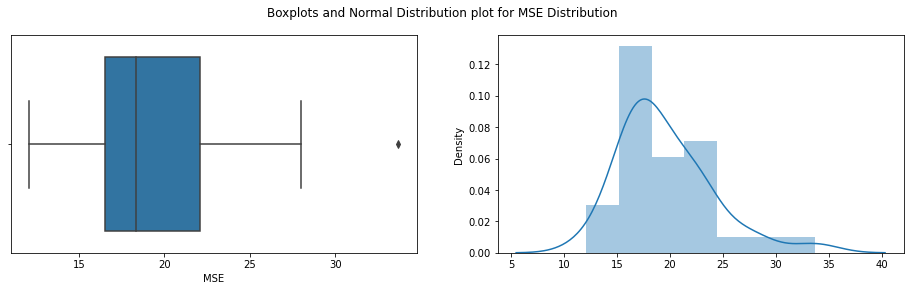

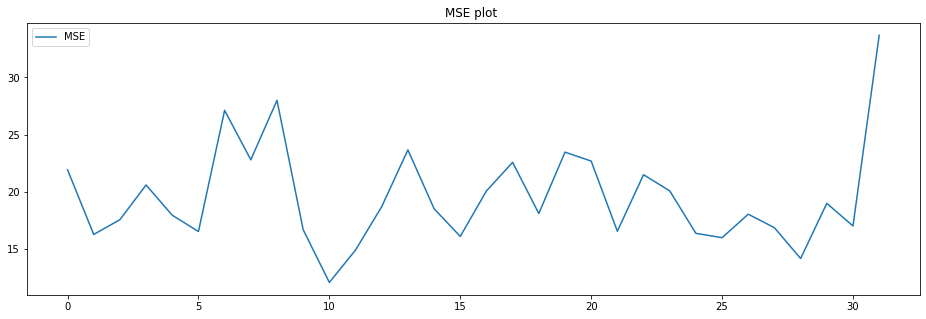


Shapiro_Wilk Test
Statistics=0.912, p=0.0126109580
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.905
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 16
mean=17.575,median=16.68 ,max=29.47,min=7.66,variance=25.064


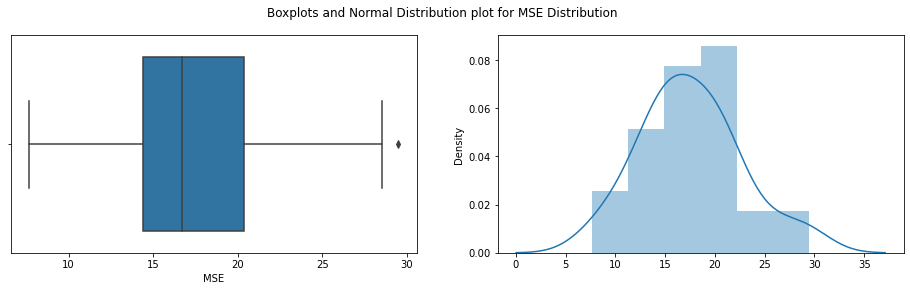

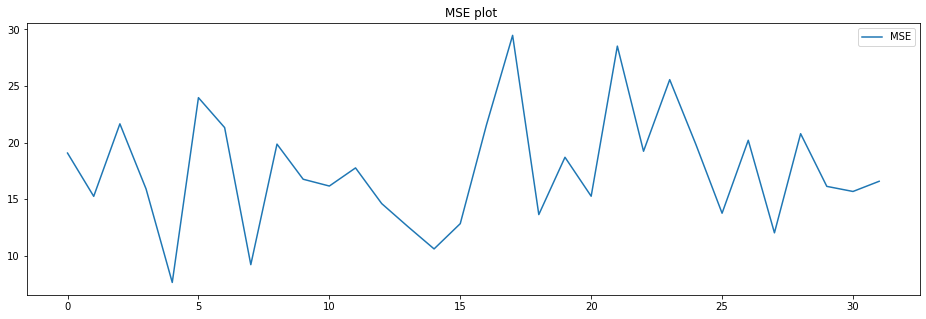


Shapiro_Wilk Test
Statistics=0.979, p=0.7760761380
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.237
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 17
mean=18.127,median=17.44 ,max=32.16,min=7.44,variance=27.317


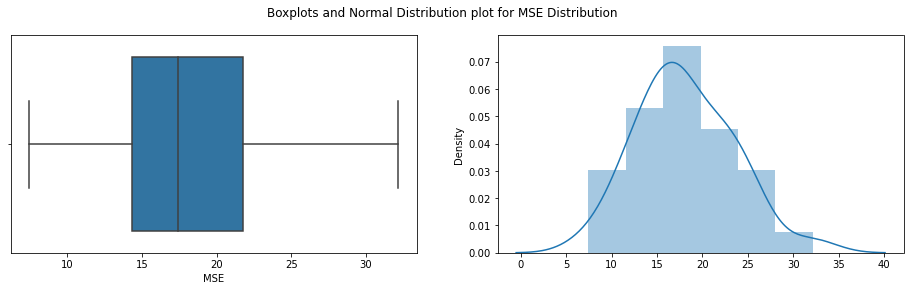

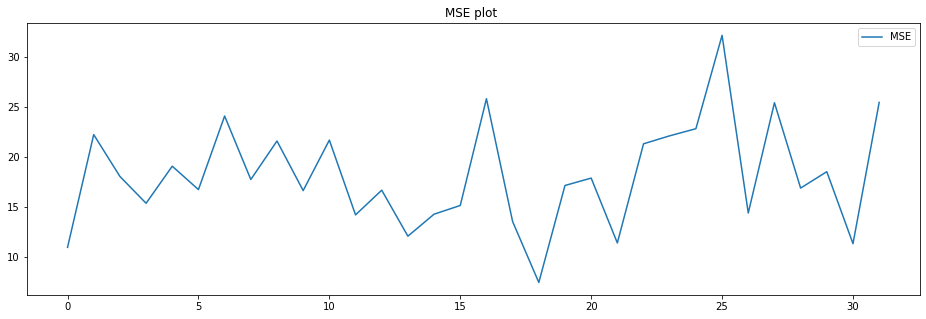


Shapiro_Wilk Test
Statistics=0.979, p=0.7590742707
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.274
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 18
mean=16.543,median=17.06 ,max=24.06,min=5.46,variance=15.951


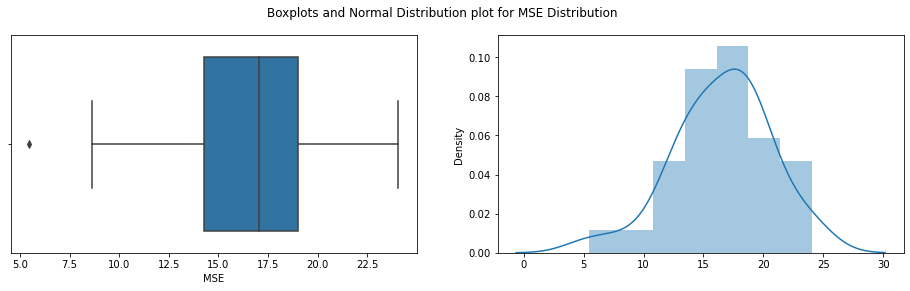

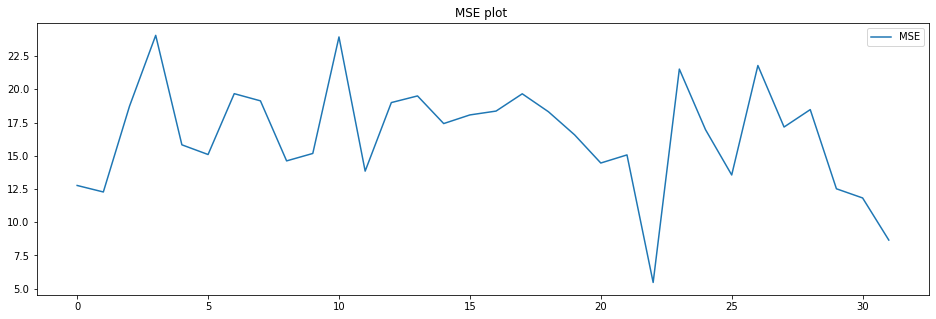


Shapiro_Wilk Test
Statistics=0.972, p=0.5593668818
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.289
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 19
mean=16.769,median=16.13 ,max=27.49,min=8.92,variance=25.754


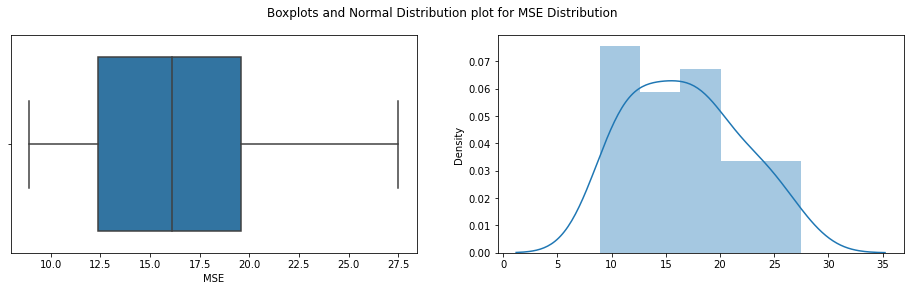

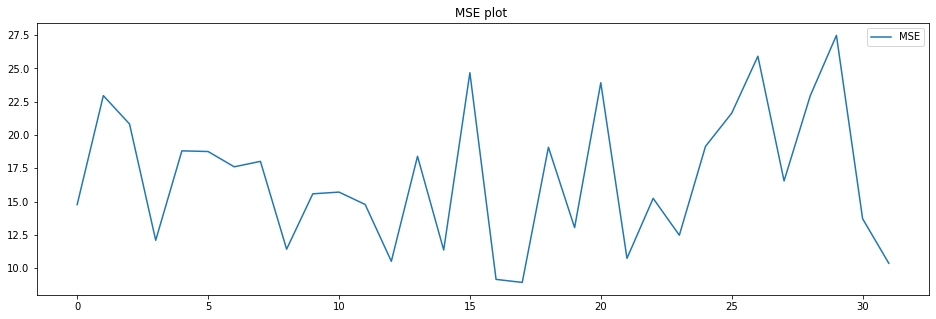


Shapiro_Wilk Test
Statistics=0.963, p=0.3211193383
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.333
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 20
mean=17.615,median=17.57 ,max=31.42,min=8.62,variance=20.961


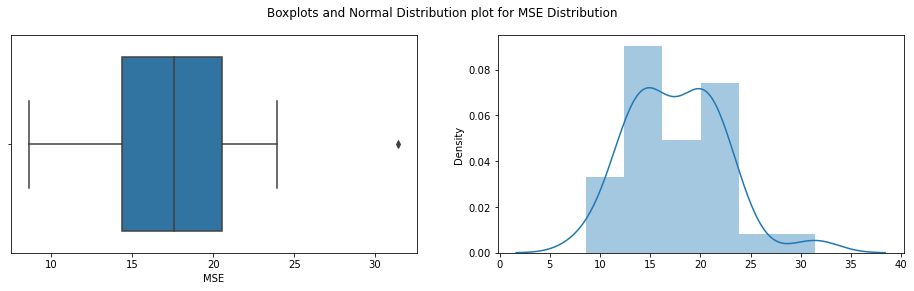

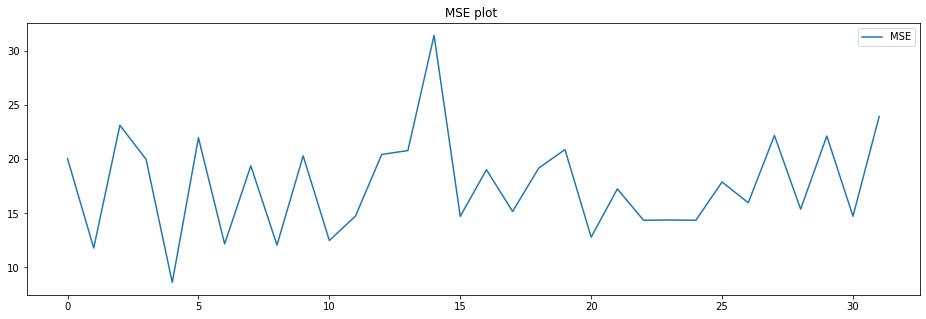


Shapiro_Wilk Test
Statistics=0.954, p=0.1873542517
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.481
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 21
mean=17.459,median=17.37 ,max=25.66,min=9.28,variance=22.235


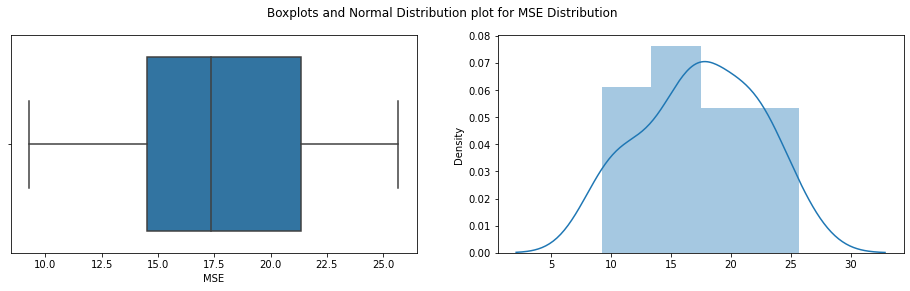

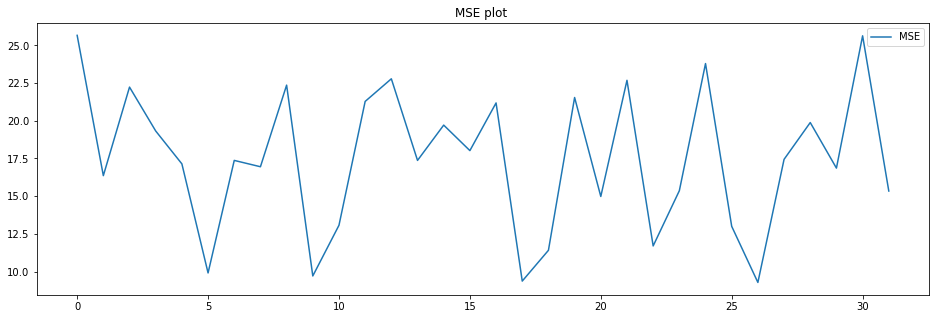


Shapiro_Wilk Test
Statistics=0.959, p=0.2554162145
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.353
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 22
mean=16.977,median=16.545 ,max=30.5,min=9.14,variance=29.333


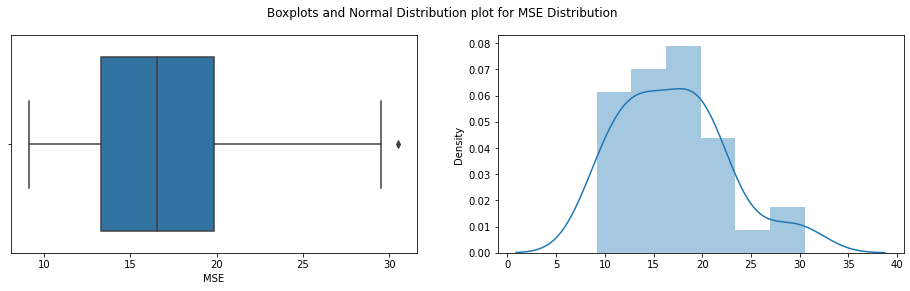

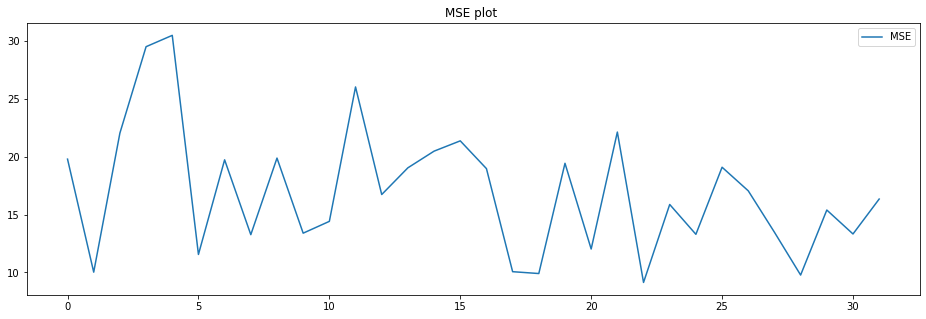


Shapiro_Wilk Test
Statistics=0.941, p=0.0819967166
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.499
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 23
mean=17.733,median=16.825 ,max=28.07,min=9.82,variance=27.67


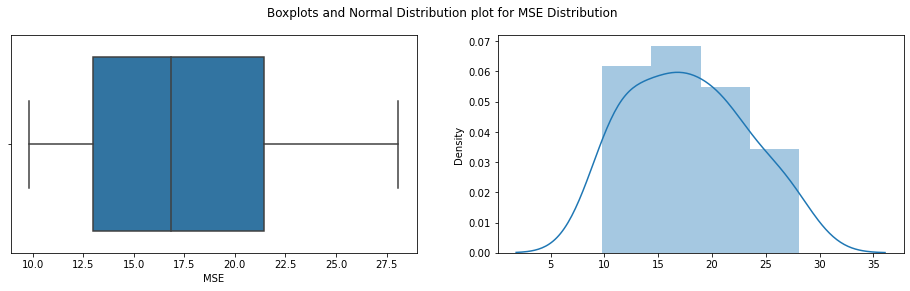

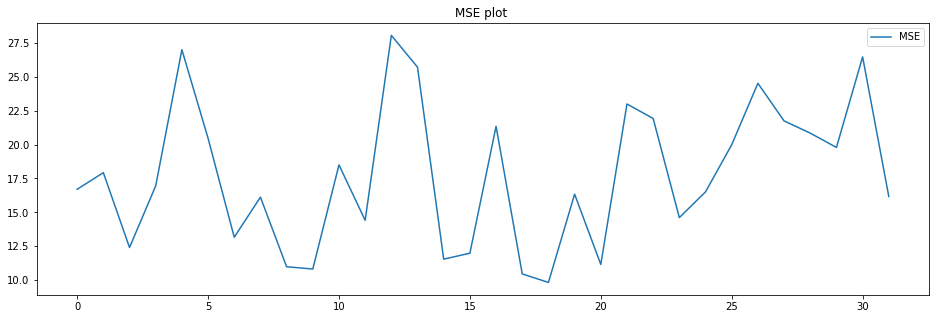


Shapiro_Wilk Test
Statistics=0.953, p=0.1734645218
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.394
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 24
mean=17.957,median=15.54 ,max=31.88,min=11.22,variance=33.851


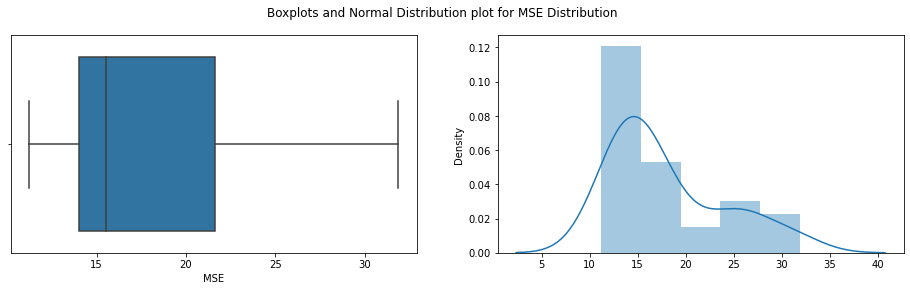

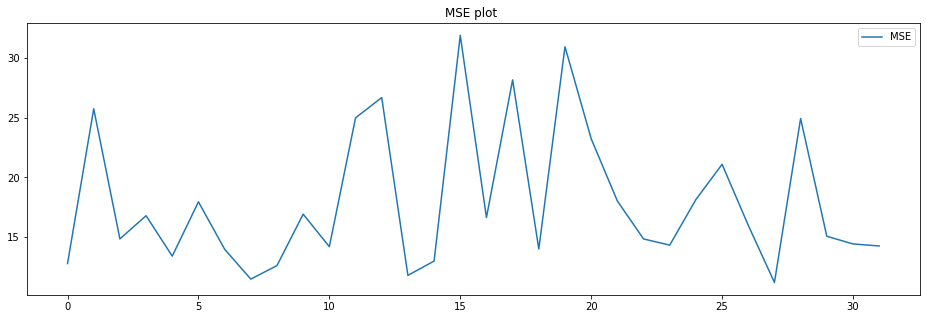


Shapiro_Wilk Test
Statistics=0.860, p=0.0006992167
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.780
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 25
mean=17.521,median=17.205 ,max=25.27,min=9.77,variance=24.04


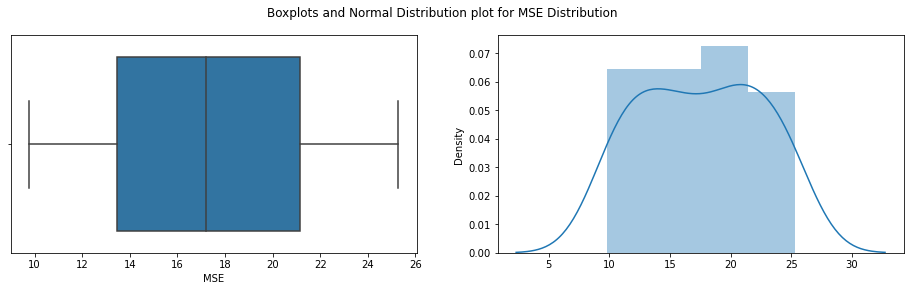

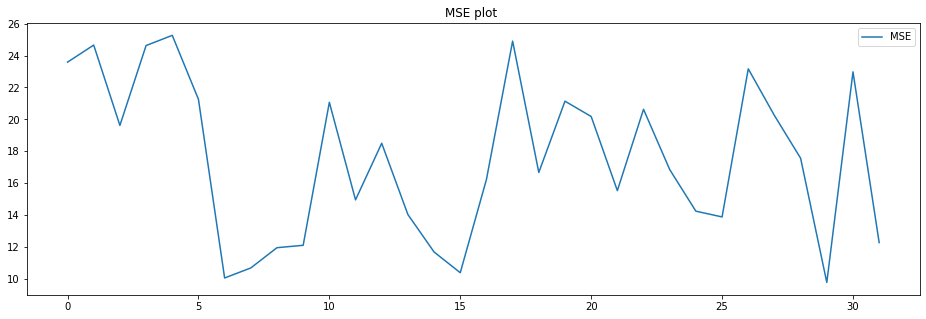


Shapiro_Wilk Test
Statistics=0.938, p=0.0670681894
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.545
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 26
mean=16.851,median=16.095 ,max=25.55,min=7.62,variance=20.074


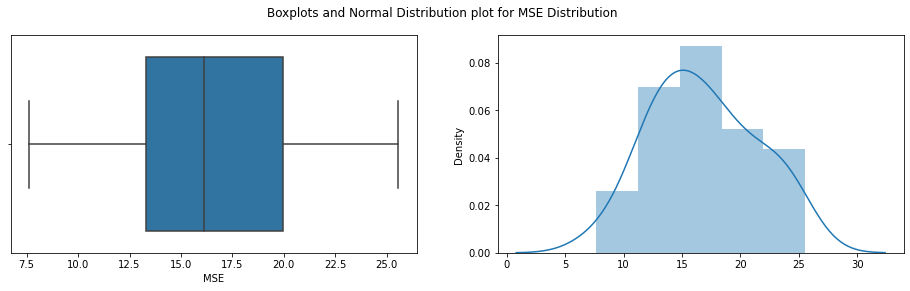

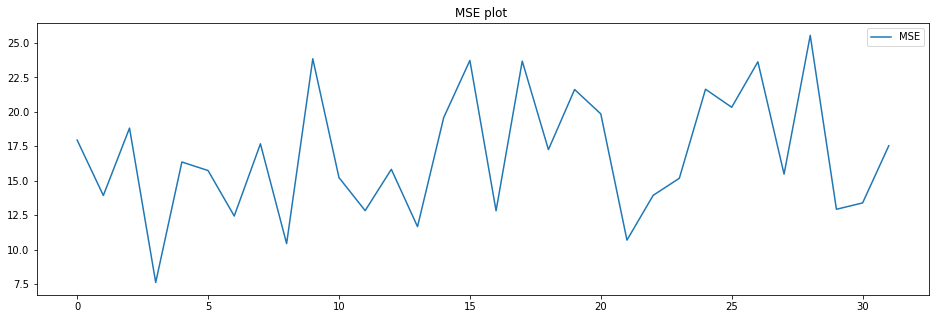


Shapiro_Wilk Test
Statistics=0.972, p=0.5700696707
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.315
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 27
mean=18.223,median=16.975 ,max=30.6,min=8.34,variance=28.885


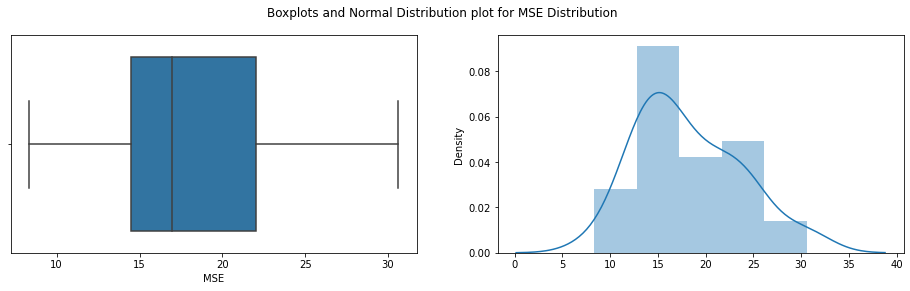

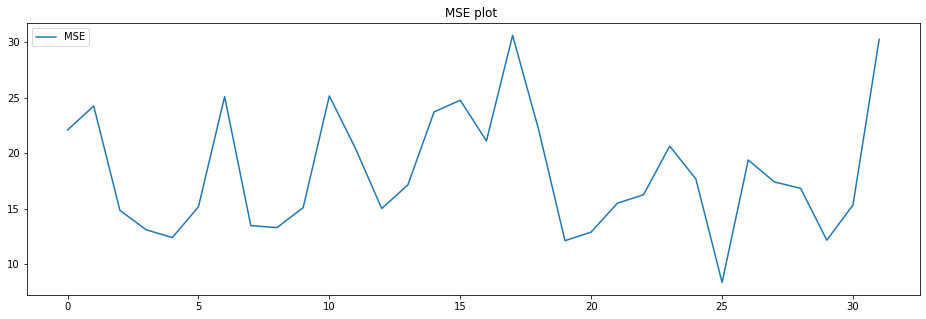


Shapiro_Wilk Test
Statistics=0.949, p=0.1362207234
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.620
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 28
mean=17.634,median=16.42 ,max=30.65,min=6.09,variance=27.997


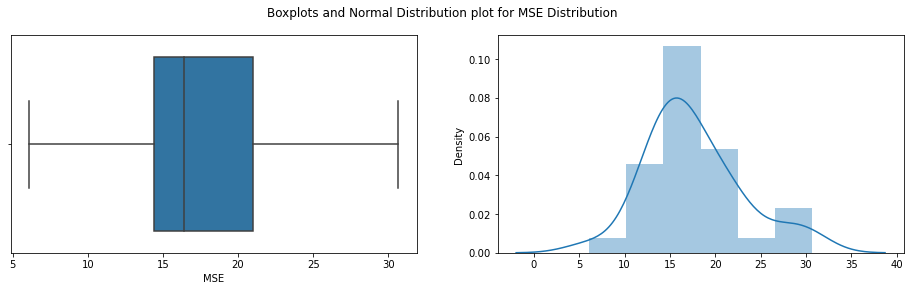

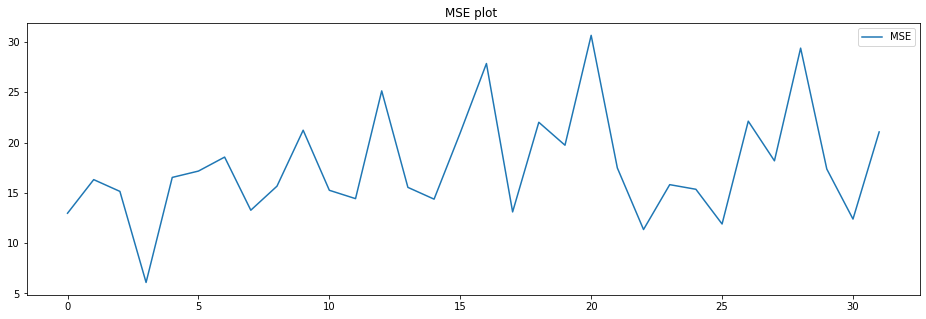


Shapiro_Wilk Test
Statistics=0.946, p=0.1080910861
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.718
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 29
mean=16.6,median=15.97 ,max=34.32,min=9.14,variance=27.02


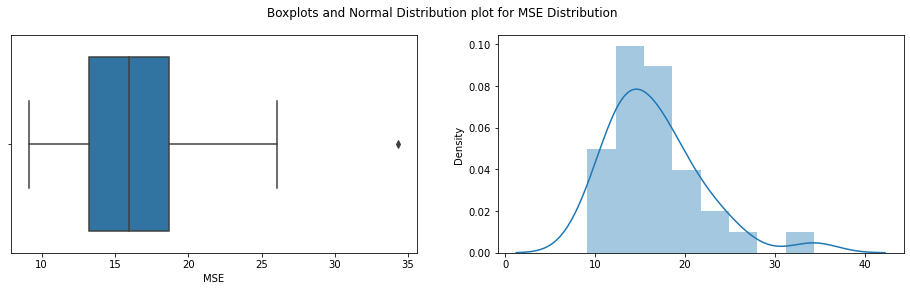

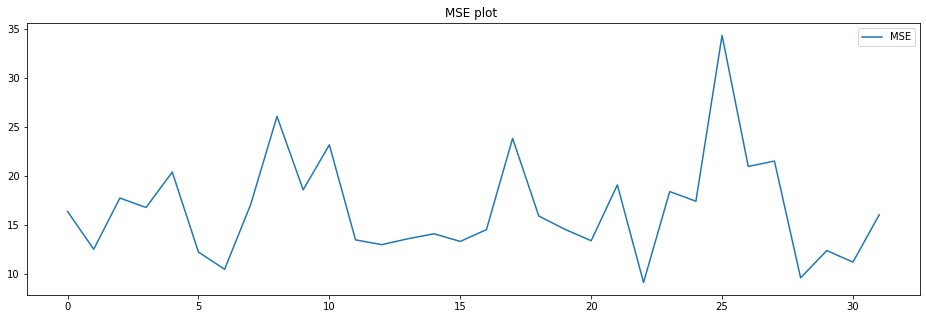


Shapiro_Wilk Test
Statistics=0.911, p=0.0120879803
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.687
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 30
mean=15.949,median=15.39 ,max=25.19,min=3.28,variance=21.647


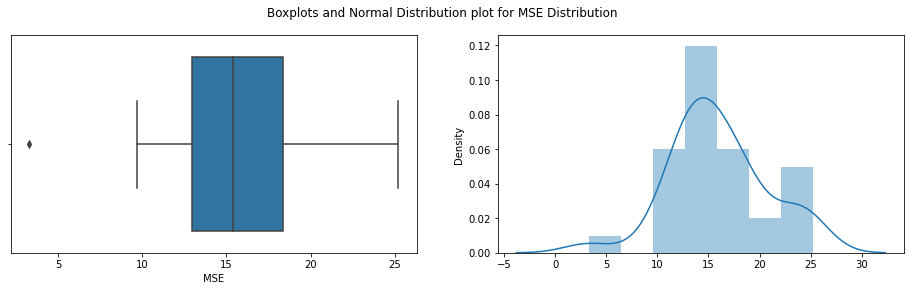

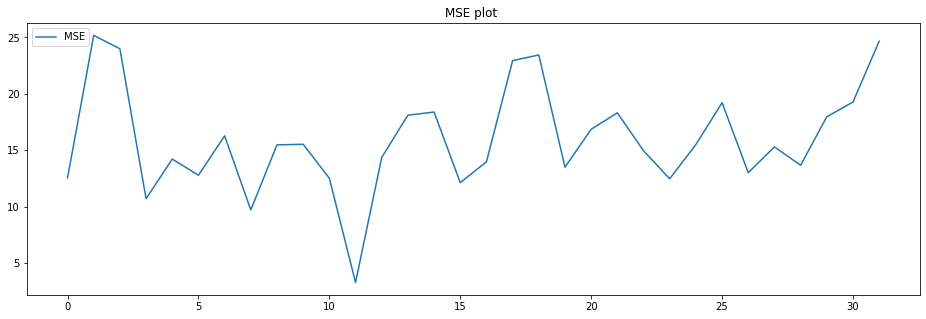


Shapiro_Wilk Test
Statistics=0.949, p=0.1310846359
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.643
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 31
mean=16.705,median=16.595 ,max=28.49,min=9.34,variance=15.7


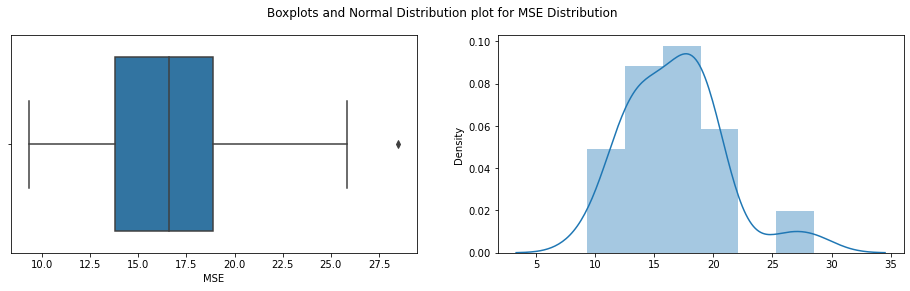

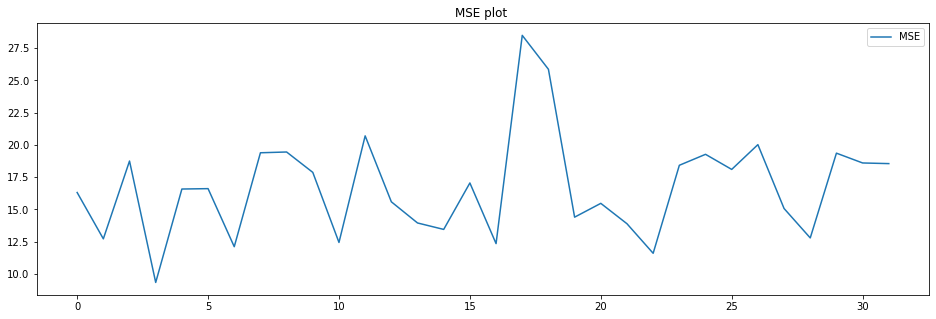


Shapiro_Wilk Test
Statistics=0.939, p=0.0712673143
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.540
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 32
mean=17.13,median=16.96 ,max=27.75,min=9.05,variance=20.561


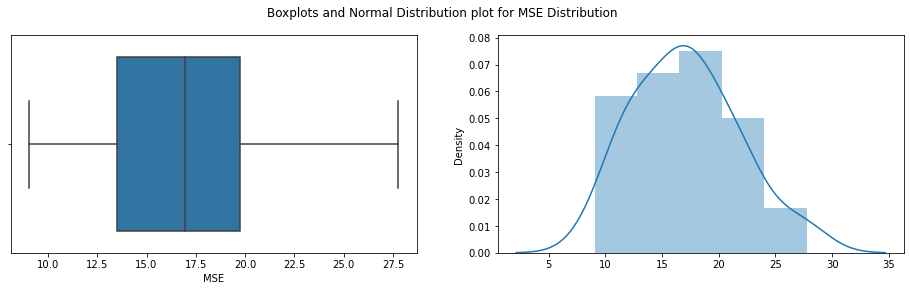

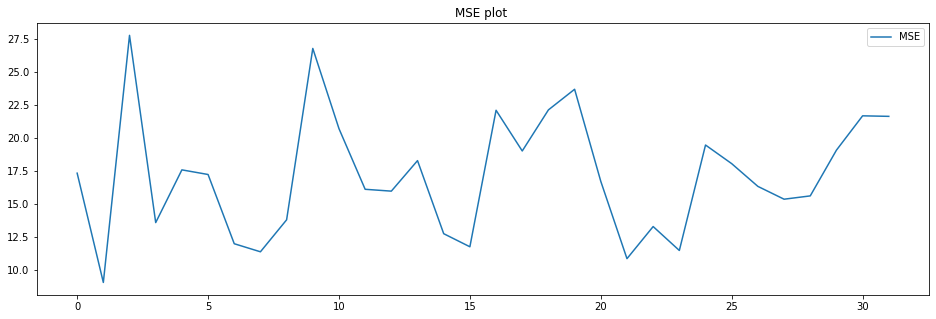


Shapiro_Wilk Test
Statistics=0.973, p=0.6006977558
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.244
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 33
mean=17.019,median=16.36 ,max=28.61,min=8.16,variance=24.458


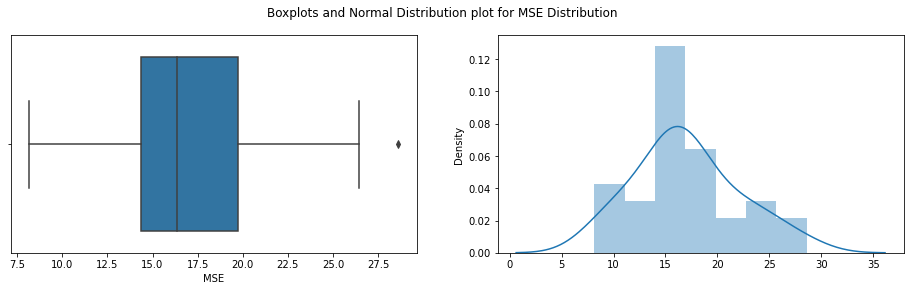

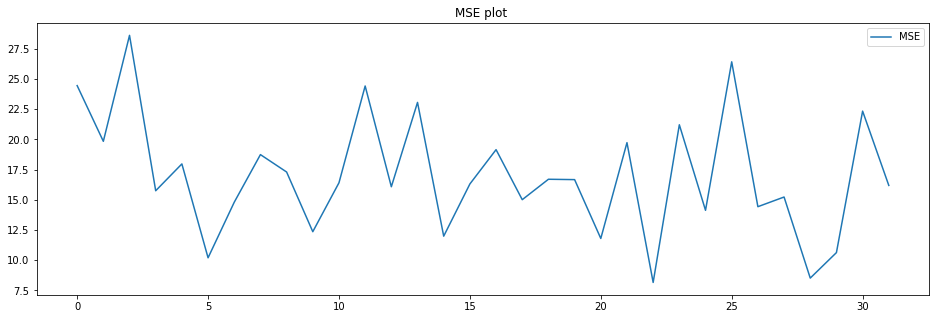


Shapiro_Wilk Test
Statistics=0.976, p=0.6750301123
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.295
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 34
mean=17.698,median=16.595 ,max=27.89,min=10.49,variance=20.281


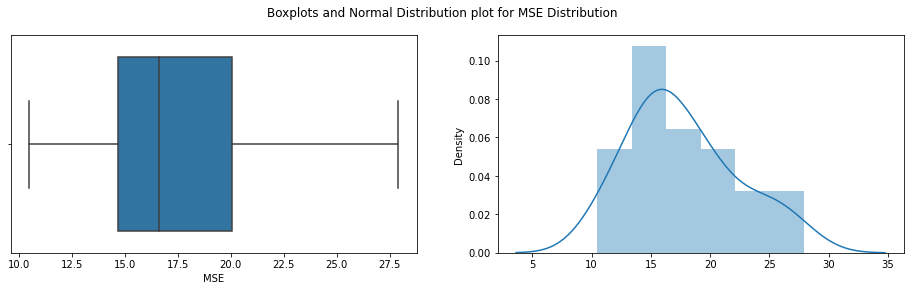

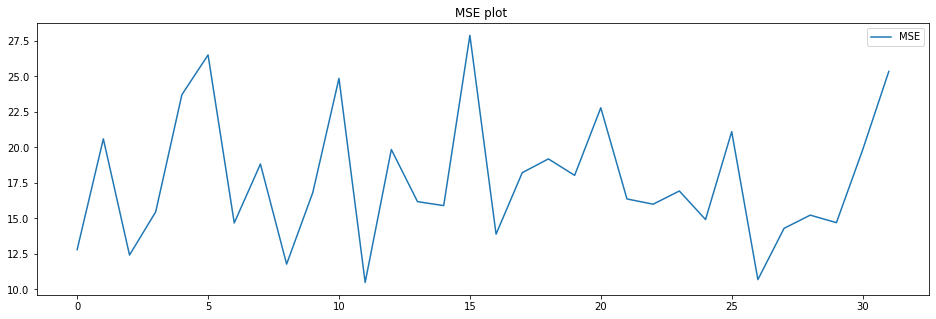


Shapiro_Wilk Test
Statistics=0.957, p=0.2284474820
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.469
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 35
mean=18.735,median=18.68 ,max=38.63,min=9.71,variance=41.679


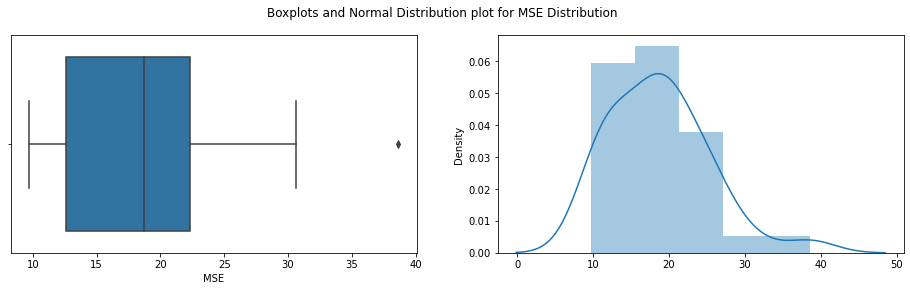

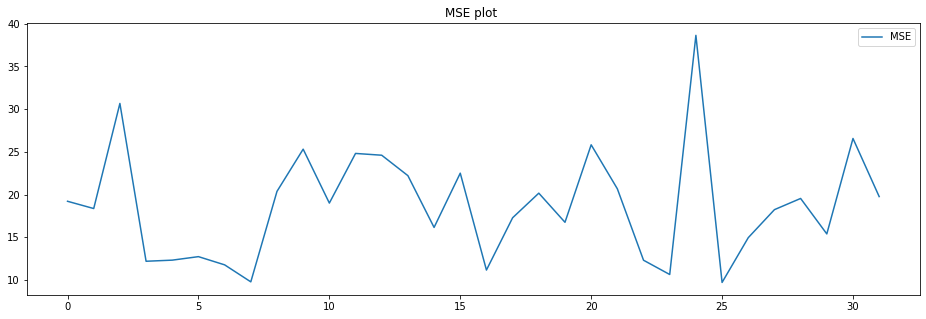


Shapiro_Wilk Test
Statistics=0.938, p=0.0674554184
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.436
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 36
mean=17.338,median=16.92 ,max=30.41,min=7.25,variance=27.884


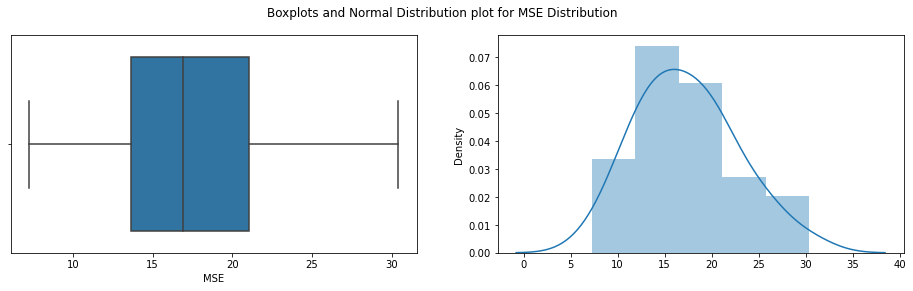

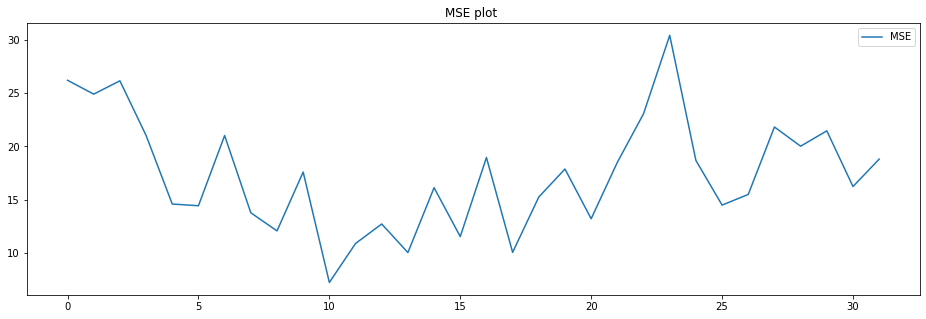


Shapiro_Wilk Test
Statistics=0.983, p=0.8760327697
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.191
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 37
mean=18.028,median=17.62 ,max=28.0,min=9.2,variance=24.641


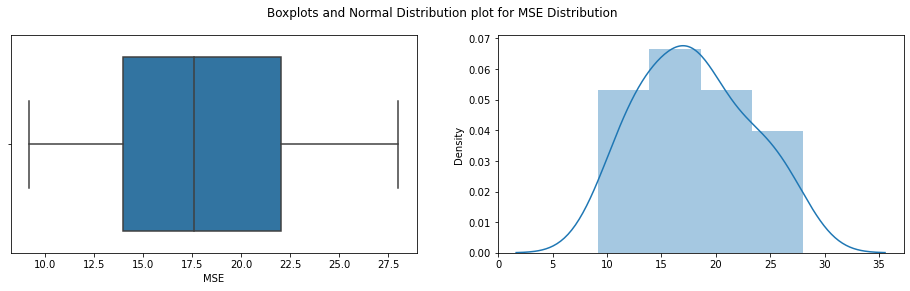

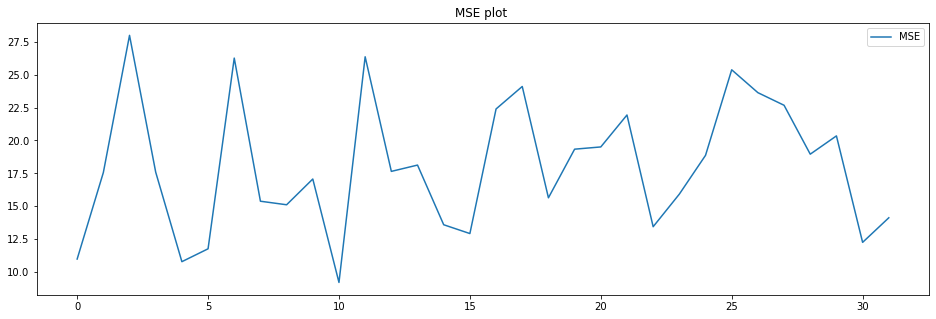


Shapiro_Wilk Test
Statistics=0.973, p=0.5925245285
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.244
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 38
mean=17.117,median=16.785 ,max=30.89,min=9.32,variance=25.115


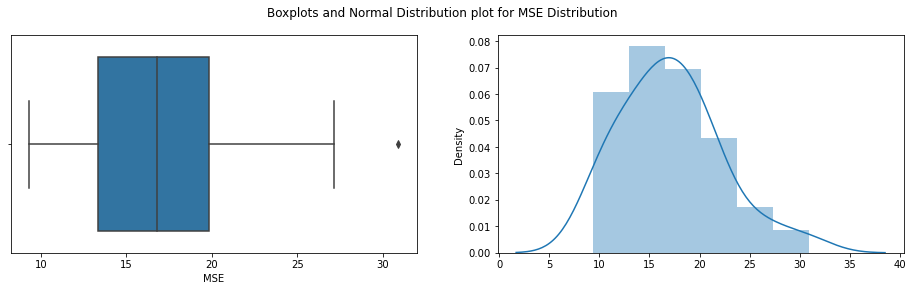

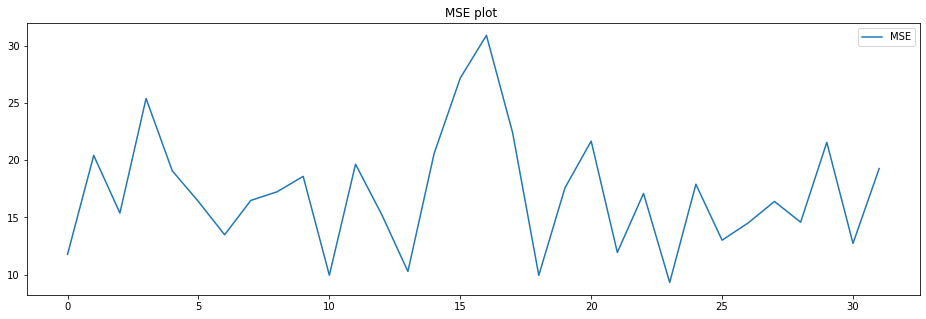


Shapiro_Wilk Test
Statistics=0.962, p=0.3194688857
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.272
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 39
mean=16.633,median=16.13 ,max=28.83,min=8.34,variance=17.624


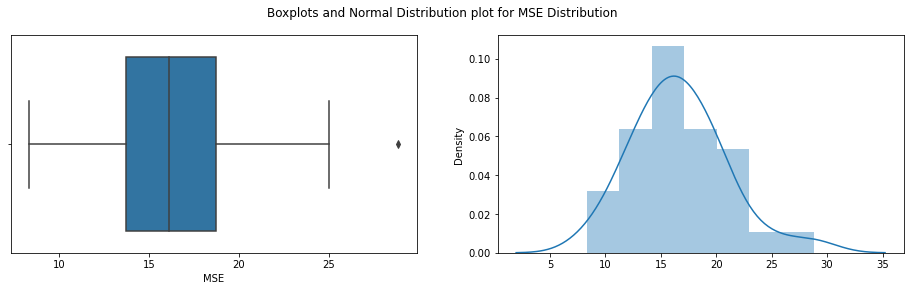

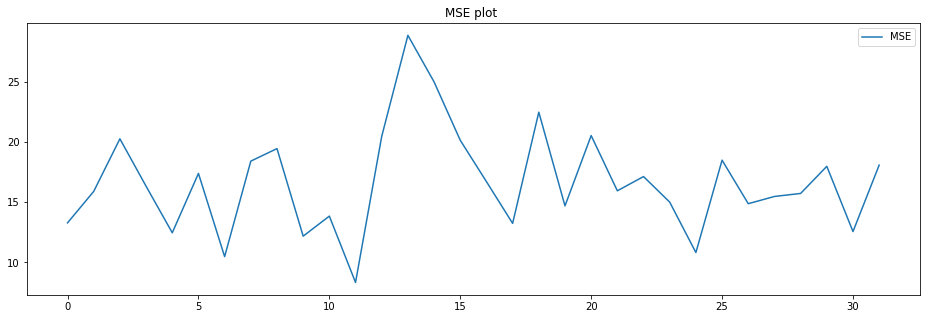


Shapiro_Wilk Test
Statistics=0.972, p=0.5591432452
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.260
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 40
mean=17.371,median=17.015 ,max=30.64,min=11.15,variance=15.44


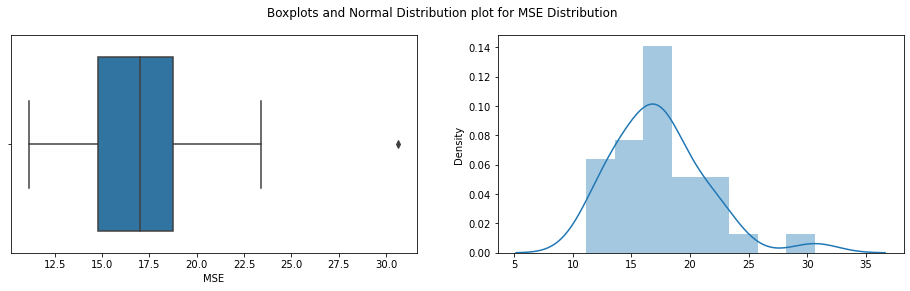

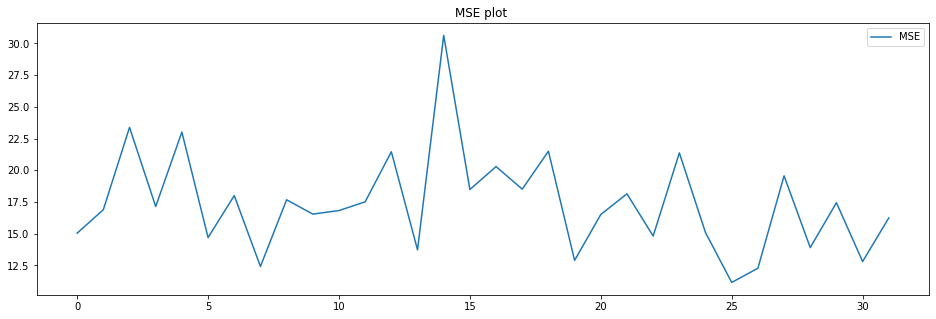


Shapiro_Wilk Test
Statistics=0.928, p=0.0348369516
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.504
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 41
mean=17.345,median=17.385 ,max=27.92,min=7.26,variance=21.161


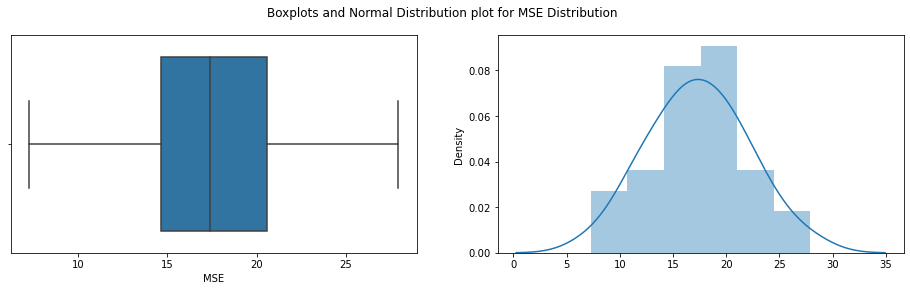

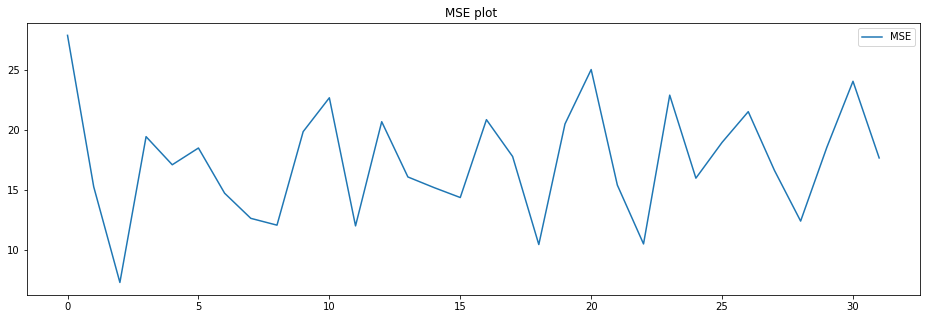


Shapiro_Wilk Test
Statistics=0.995, p=0.9998605847
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.092
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 42
mean=17.879,median=17.56 ,max=34.87,min=6.32,variance=35.845


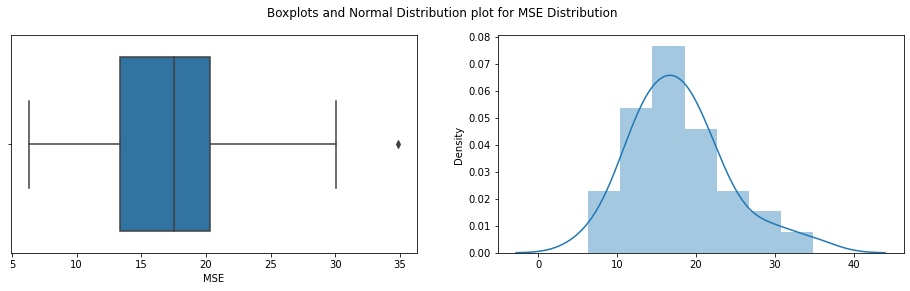

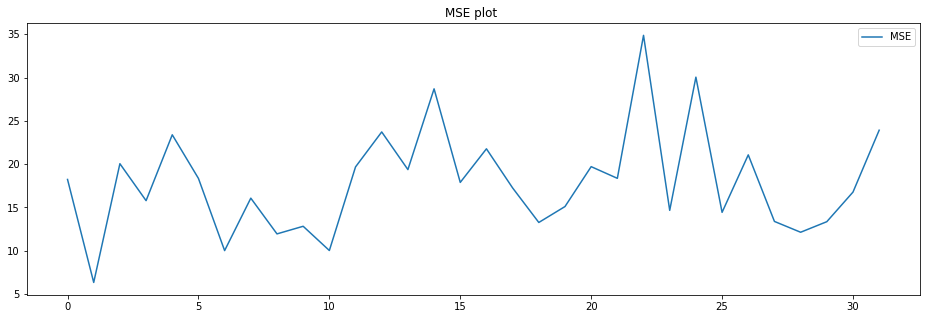


Shapiro_Wilk Test
Statistics=0.959, p=0.2538956404
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.437
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 43
mean=15.656,median=15.69 ,max=24.11,min=5.57,variance=16.695


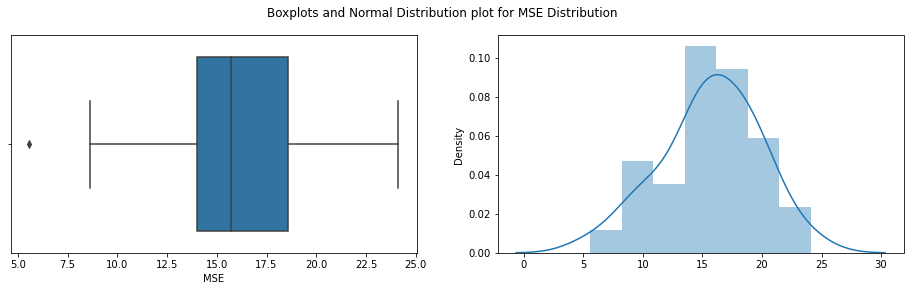

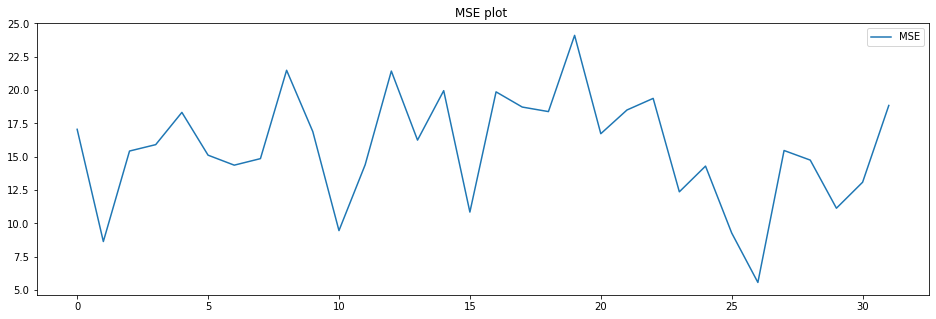


Shapiro_Wilk Test
Statistics=0.981, p=0.8371841908
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.273
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 44
mean=16.873,median=16.795 ,max=25.56,min=10.39,variance=12.982


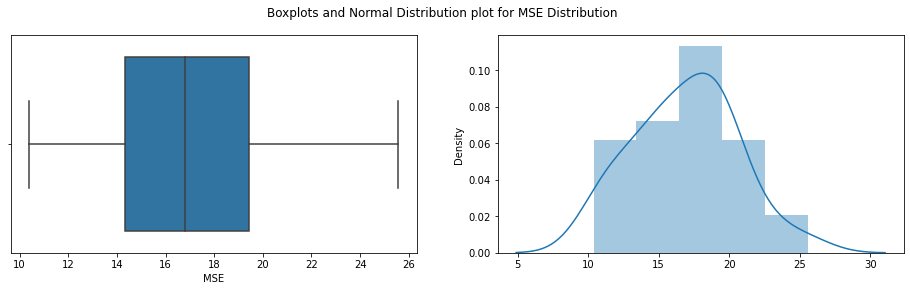

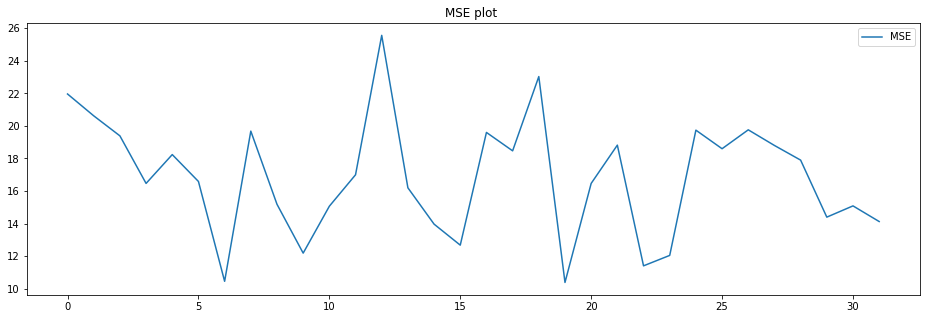


Shapiro_Wilk Test
Statistics=0.978, p=0.7532726526
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.245
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 45
mean=17.484,median=17.0 ,max=26.92,min=9.63,variance=23.684


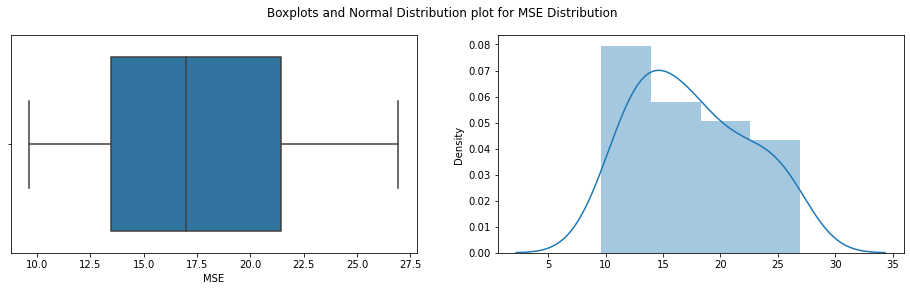

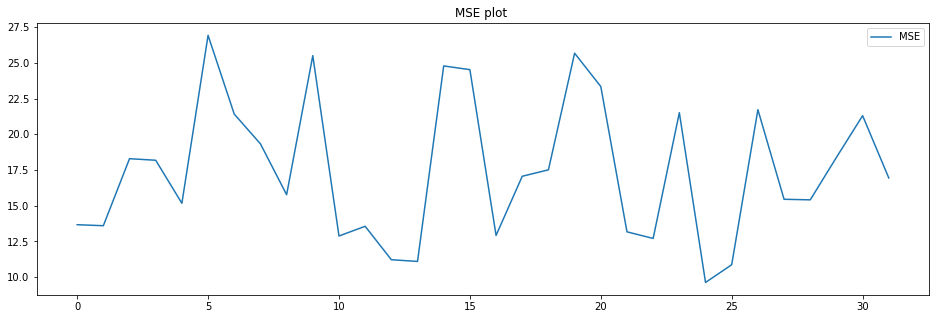


Shapiro_Wilk Test
Statistics=0.949, p=0.1316476017
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.535
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 46
mean=16.697,median=16.105 ,max=33.56,min=10.74,variance=18.831


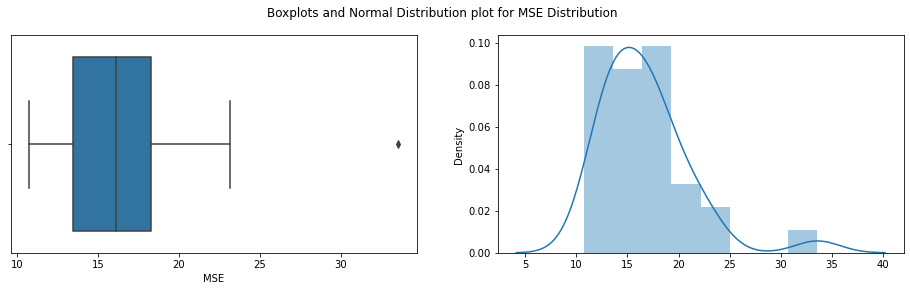

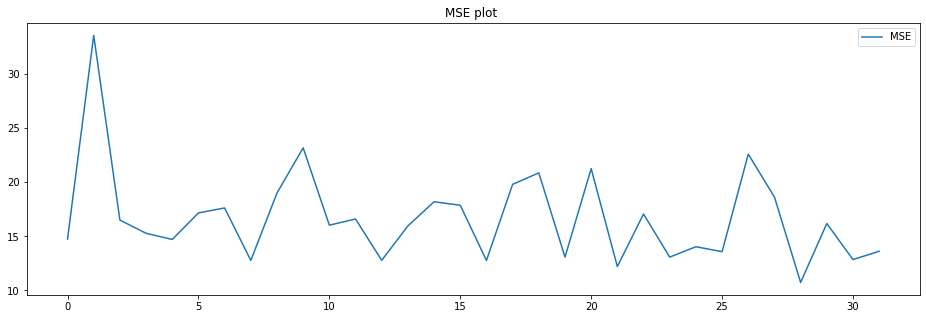


Shapiro_Wilk Test
Statistics=0.849, p=0.0003997608
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.024
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 47
mean=17.716,median=17.04 ,max=28.09,min=10.78,variance=15.287


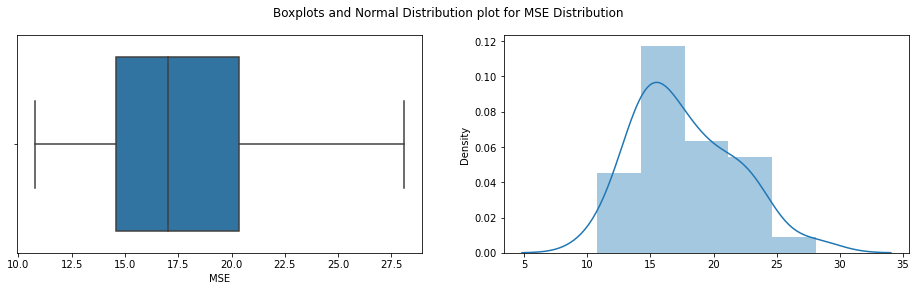

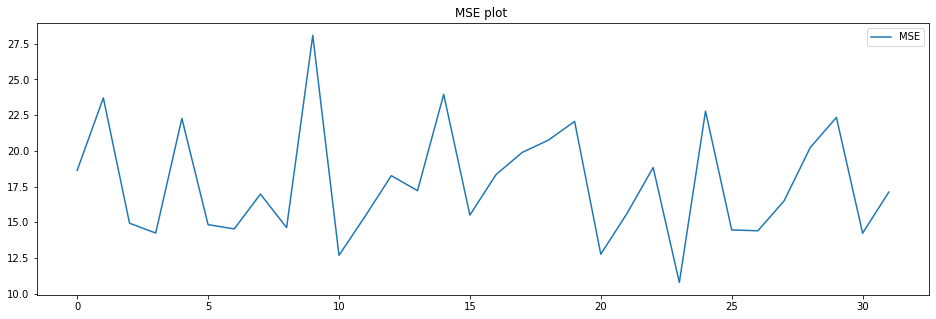


Shapiro_Wilk Test
Statistics=0.953, p=0.1763076037
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.606
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 48
mean=16.688,median=15.68 ,max=29.95,min=8.31,variance=21.161


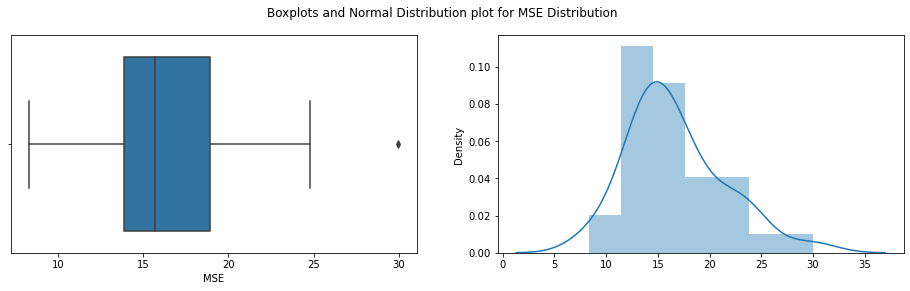

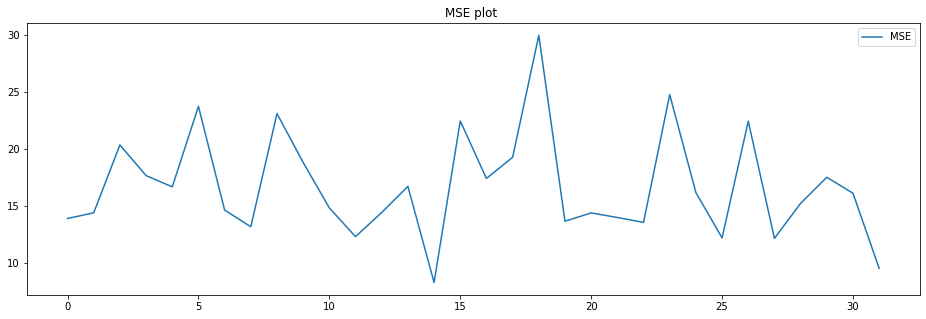


Shapiro_Wilk Test
Statistics=0.944, p=0.0975889340
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.729
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 49
mean=16.586,median=16.245 ,max=27.64,min=5.2,variance=28.623


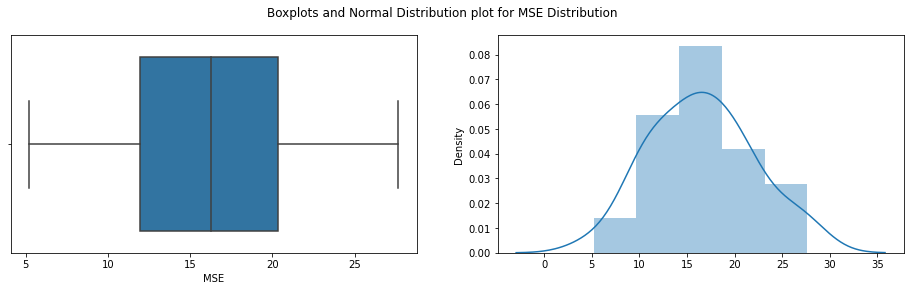

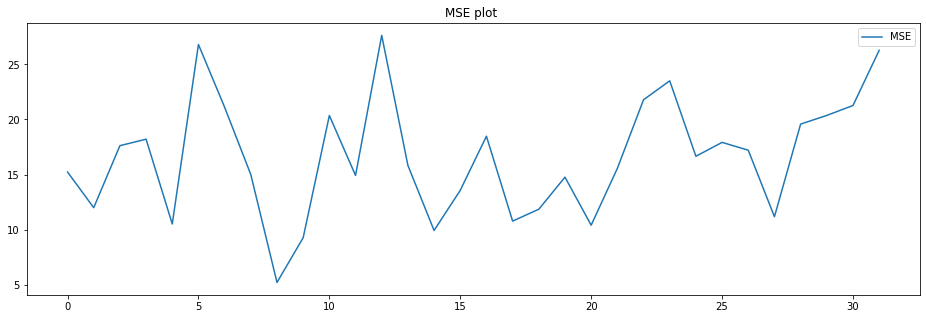


Shapiro_Wilk Test
Statistics=0.980, p=0.7958162427
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.217
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 50
mean=15.552,median=15.01 ,max=26.32,min=6.03,variance=17.98


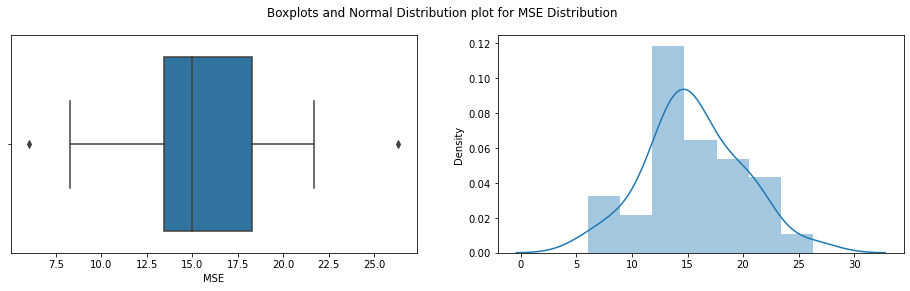

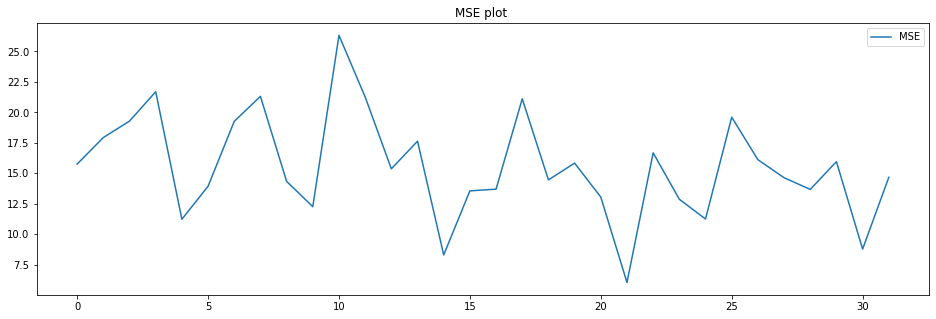


Shapiro_Wilk Test
Statistics=0.981, p=0.8336448073
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.309
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 51
mean=16.635,median=15.74 ,max=31.98,min=9.35,variance=21.857


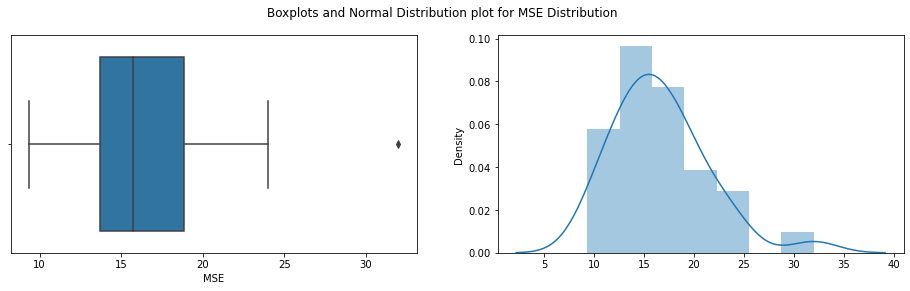

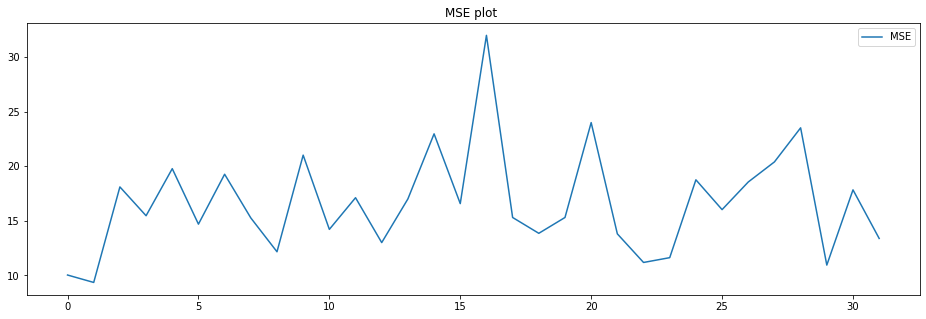


Shapiro_Wilk Test
Statistics=0.938, p=0.0676174238
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.413
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 52
mean=17.138,median=17.115 ,max=26.51,min=6.61,variance=17.823


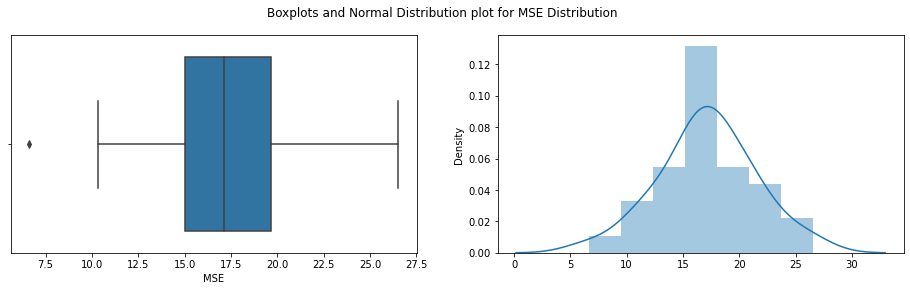

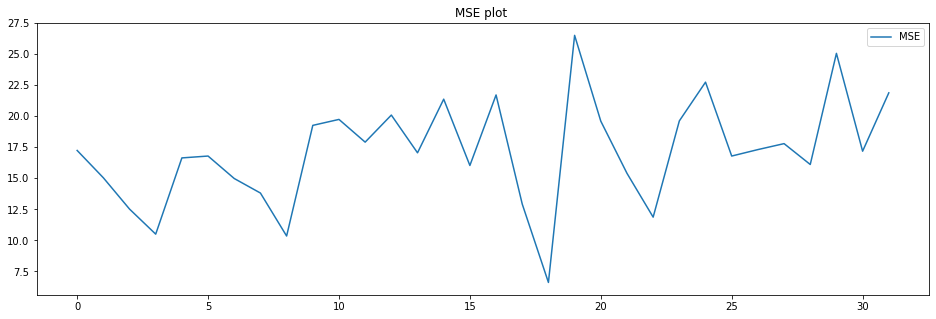


Shapiro_Wilk Test
Statistics=0.987, p=0.9585484266
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.236
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 53
mean=17.263,median=17.38 ,max=27.31,min=9.27,variance=24.55


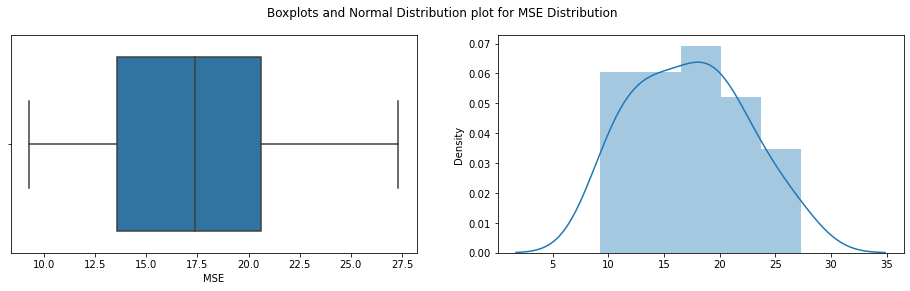

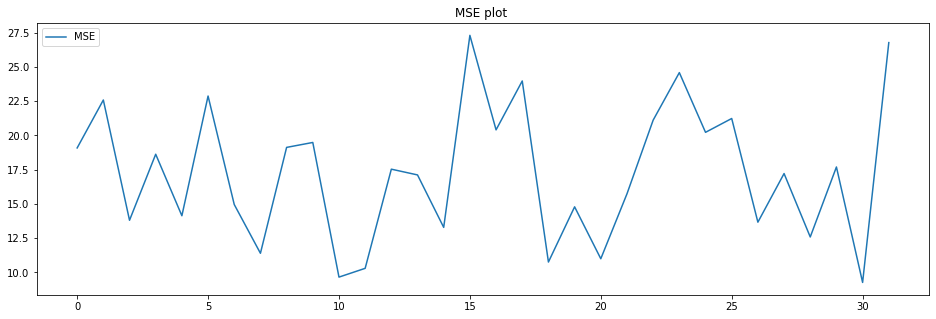


Shapiro_Wilk Test
Statistics=0.970, p=0.4915413260
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.233
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 54
mean=15.999,median=16.73 ,max=23.51,min=8.74,variance=18.091


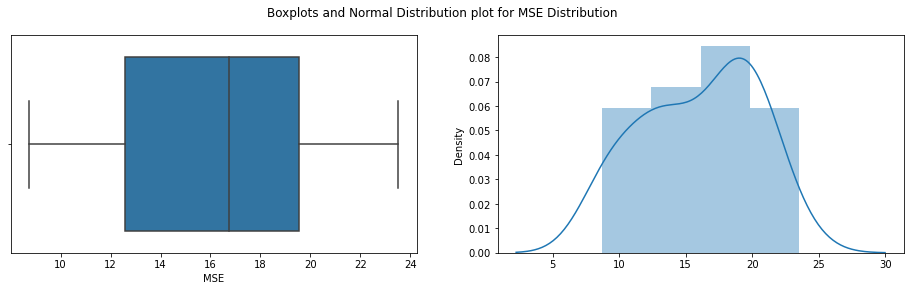

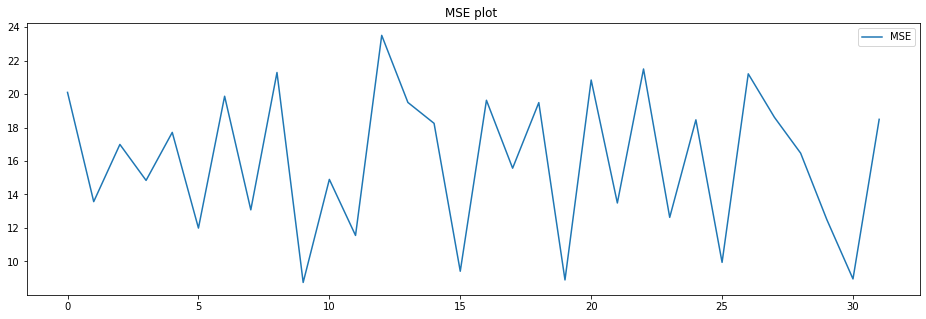


Shapiro_Wilk Test
Statistics=0.943, p=0.0925995037
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.604
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 55
mean=16.842,median=16.475 ,max=28.9,min=8.2,variance=26.677


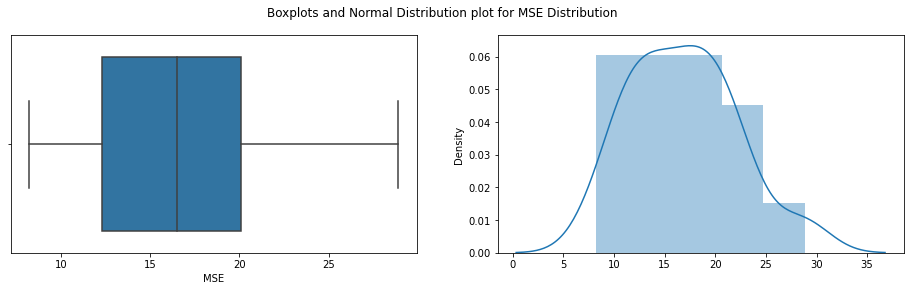

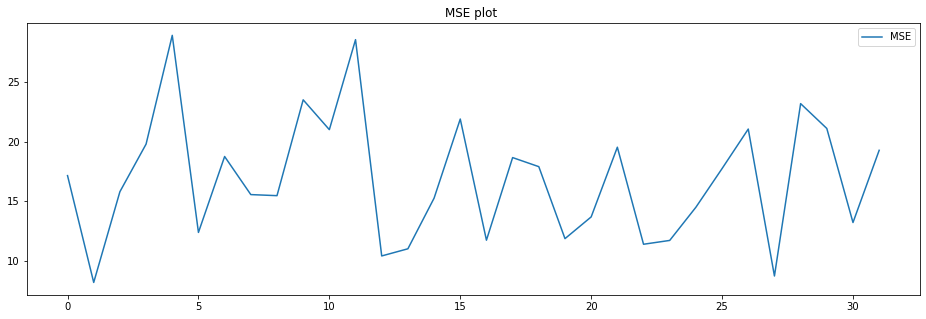


Shapiro_Wilk Test
Statistics=0.966, p=0.3893246055
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.296
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 56
mean=15.876,median=14.995 ,max=31.5,min=8.25,variance=23.919


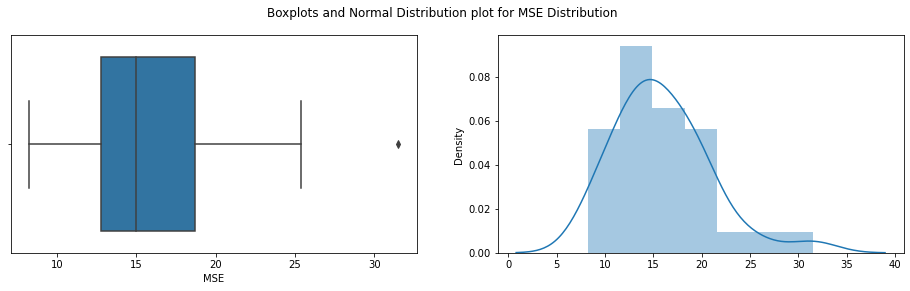

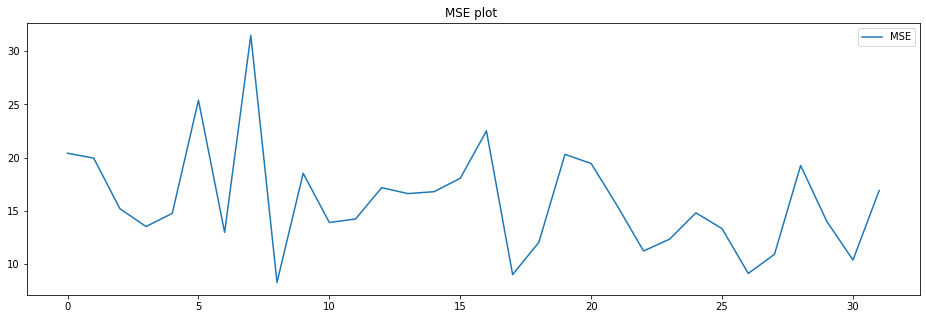


Shapiro_Wilk Test
Statistics=0.942, p=0.0855716020
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.403
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 57
mean=17.914,median=17.45 ,max=25.65,min=9.91,variance=21.08


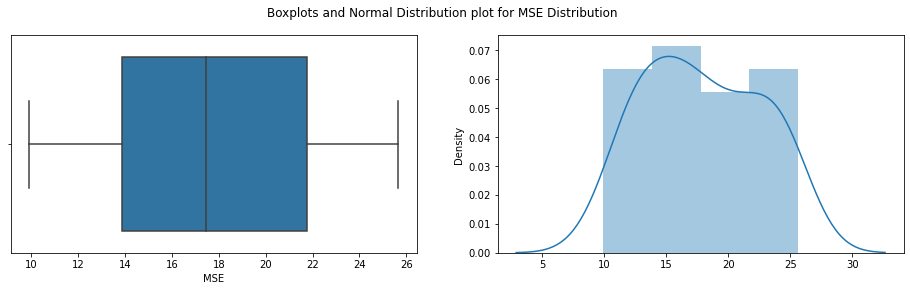

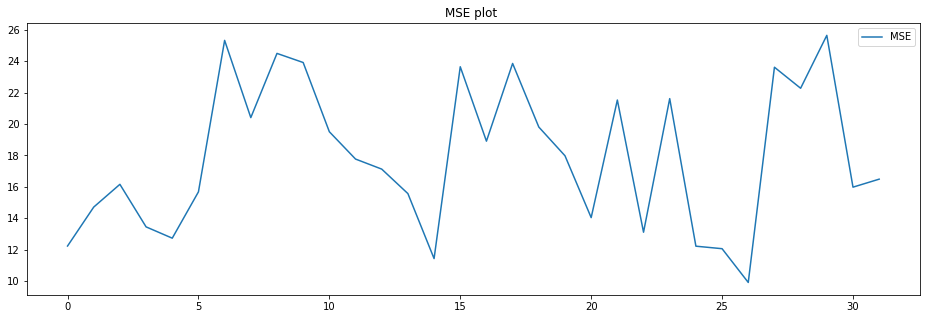


Shapiro_Wilk Test
Statistics=0.948, p=0.1288803071
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.505
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 58
mean=17.517,median=16.48 ,max=27.5,min=10.48,variance=16.013


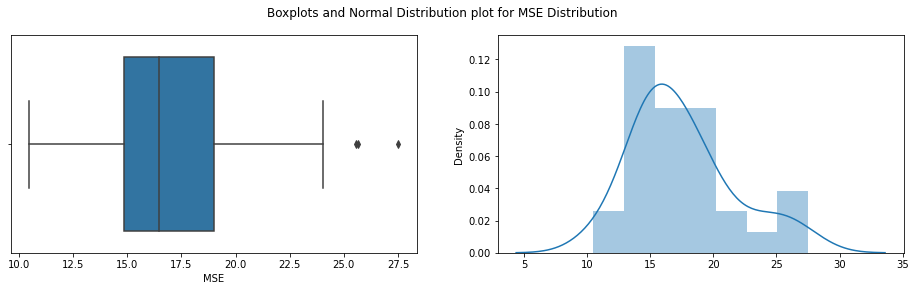

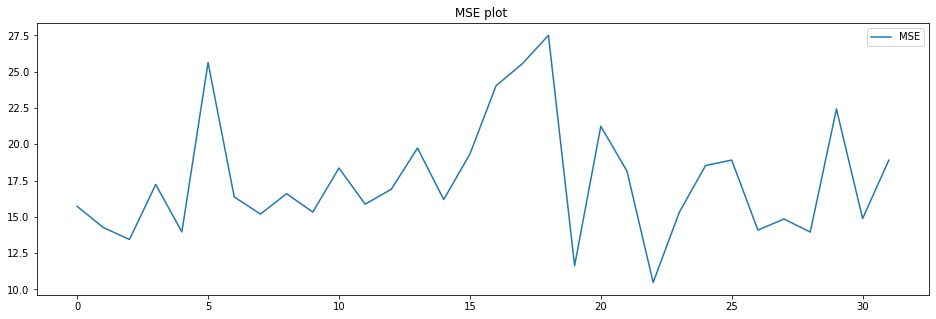


Shapiro_Wilk Test
Statistics=0.934, p=0.0513441525
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.823
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 59
mean=16.405,median=16.065 ,max=23.48,min=8.52,variance=12.552


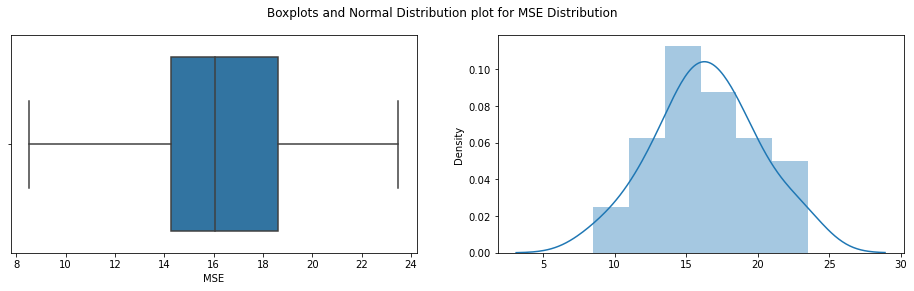

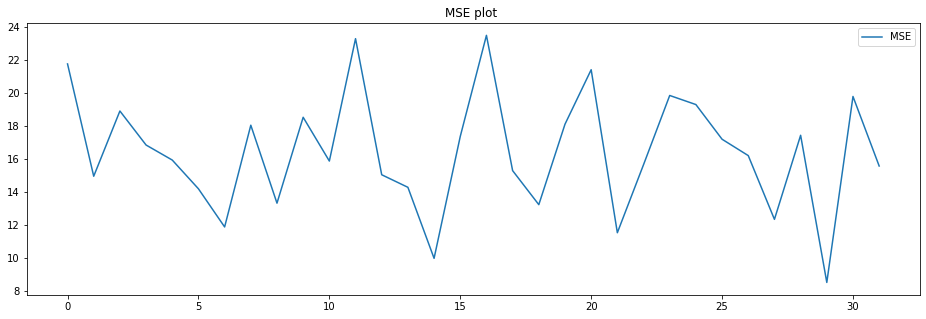


Shapiro_Wilk Test
Statistics=0.990, p=0.9879201055
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.110
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 60
mean=18.195,median=18.445 ,max=29.09,min=8.31,variance=26.521


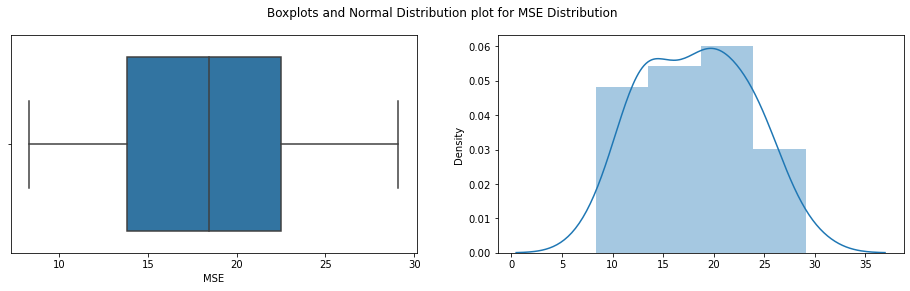

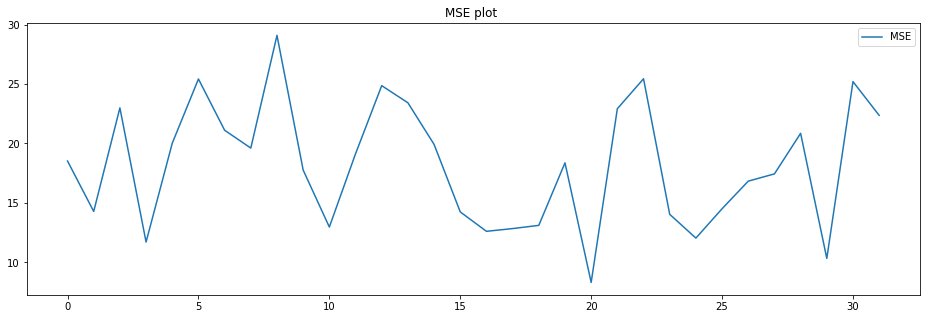


Shapiro_Wilk Test
Statistics=0.972, p=0.5435026884
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.365
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 61
mean=17.196,median=16.5 ,max=27.01,min=8.94,variance=18.762


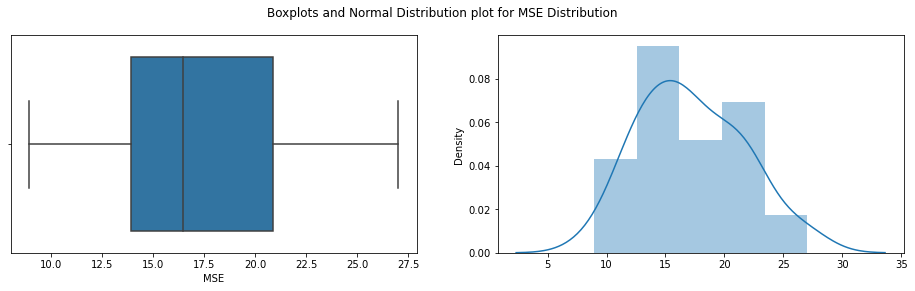

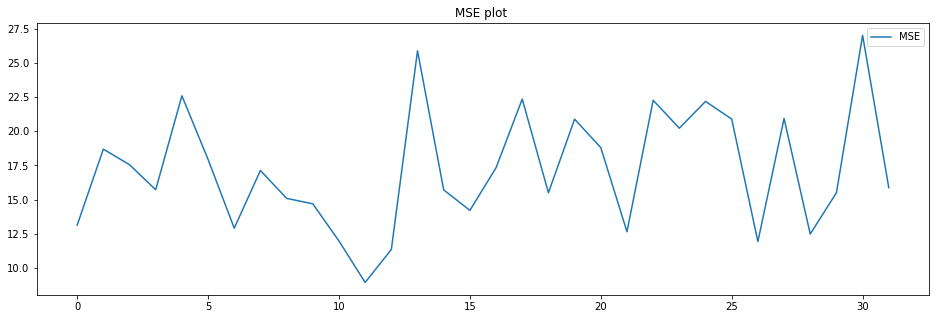


Shapiro_Wilk Test
Statistics=0.973, p=0.5780383945
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.333
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 62
mean=17.418,median=17.5 ,max=27.82,min=8.52,variance=22.78


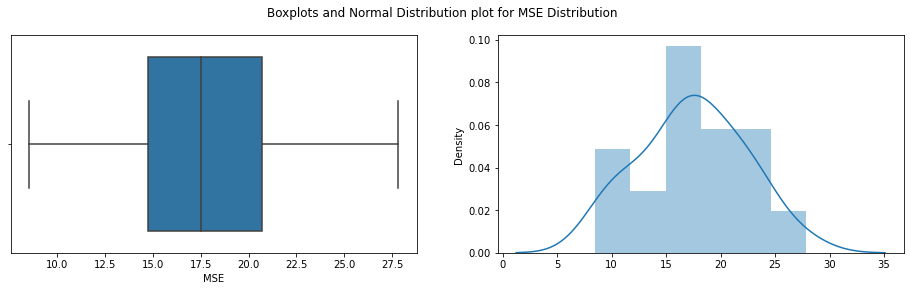

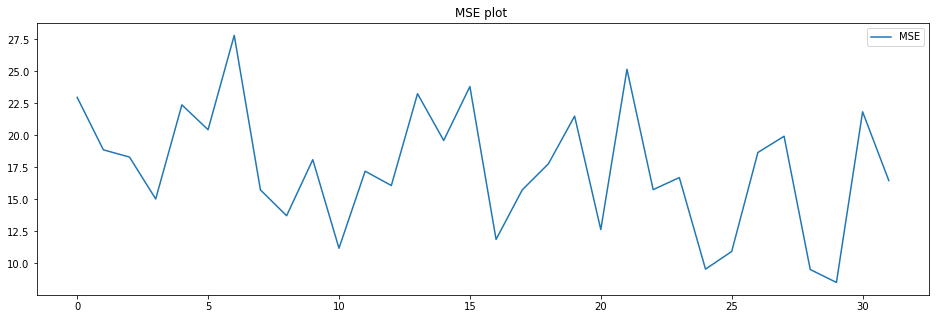


Shapiro_Wilk Test
Statistics=0.983, p=0.8845281005
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.166
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 63
mean=16.599,median=15.52 ,max=32.01,min=6.87,variance=35.46


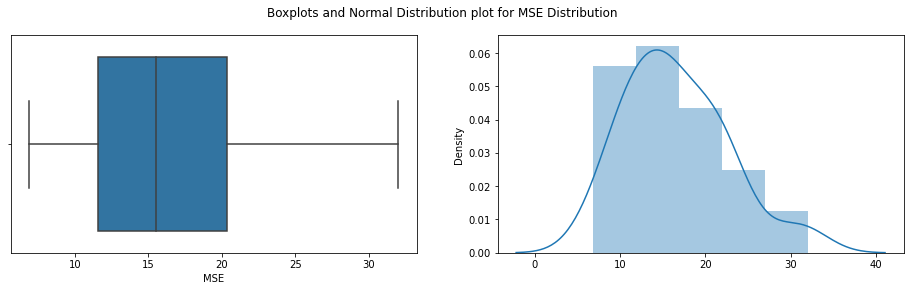

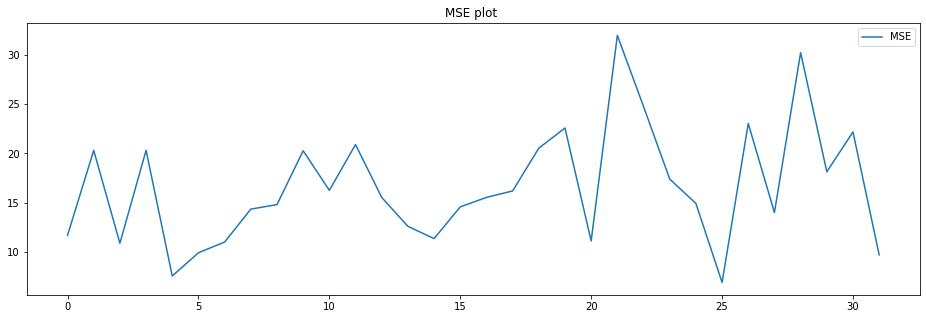


Shapiro_Wilk Test
Statistics=0.956, p=0.2069458663
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.424
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 64
mean=17.722,median=17.045 ,max=32.2,min=9.99,variance=27.67


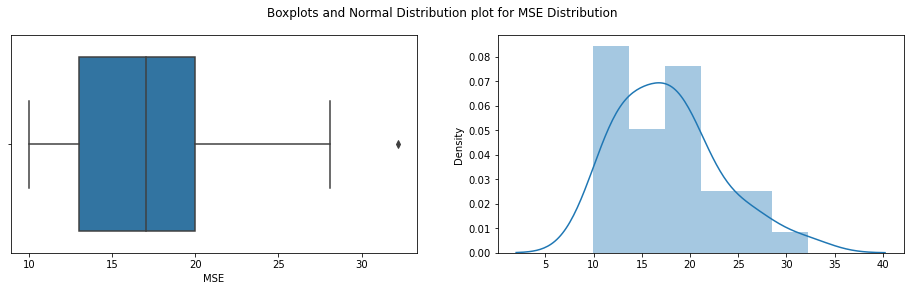

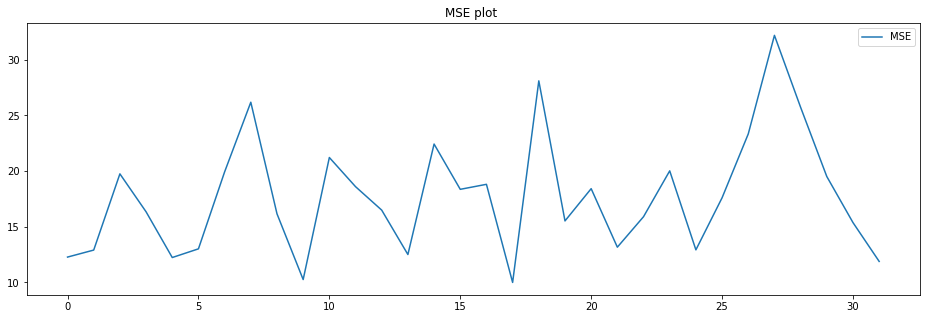


Shapiro_Wilk Test
Statistics=0.943, p=0.0922353119
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.537
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 65
mean=17.732,median=17.775 ,max=31.6,min=8.03,variance=31.632


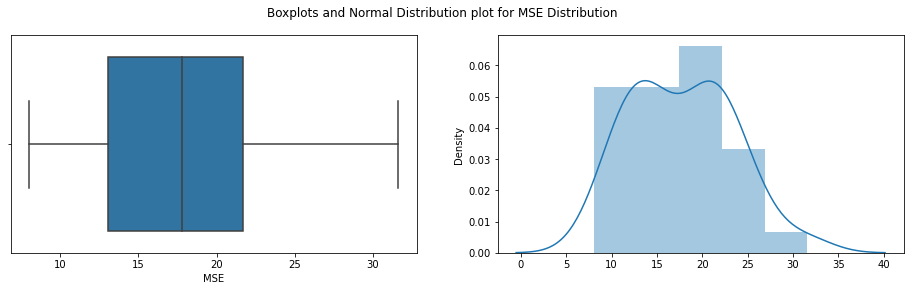

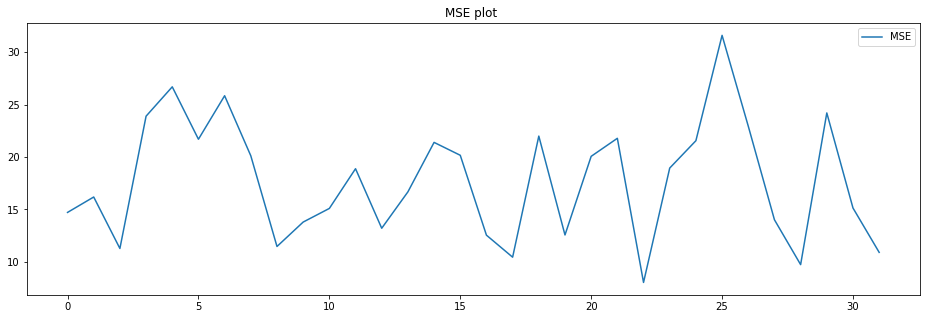


Shapiro_Wilk Test
Statistics=0.968, p=0.4576575458
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.390
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 66
mean=18.788,median=17.975 ,max=33.36,min=7.94,variance=30.552


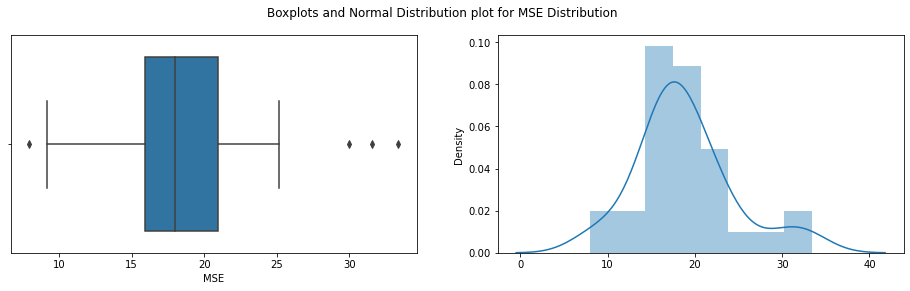

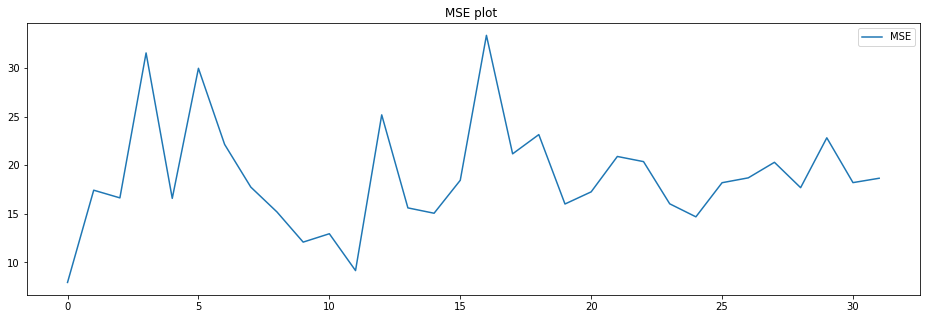


Shapiro_Wilk Test
Statistics=0.934, p=0.0504308306
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.846
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 67
mean=17.946,median=17.805 ,max=33.9,min=10.19,variance=26.033


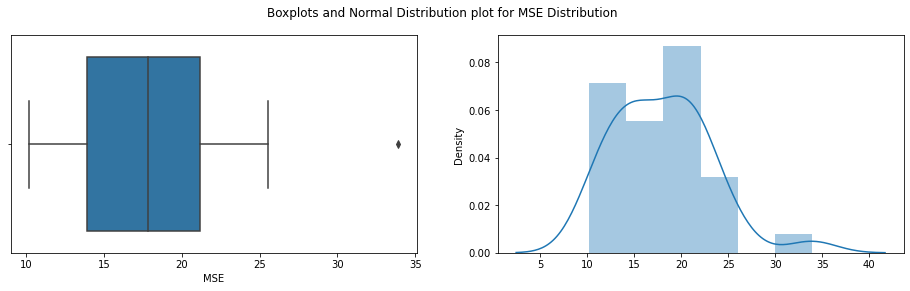

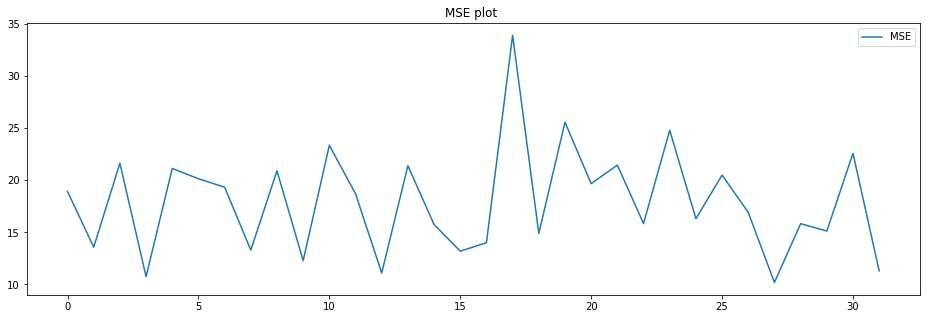


Shapiro_Wilk Test
Statistics=0.945, p=0.1059158444
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.379
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 68
mean=17.912,median=18.055 ,max=24.02,min=10.18,variance=13.208


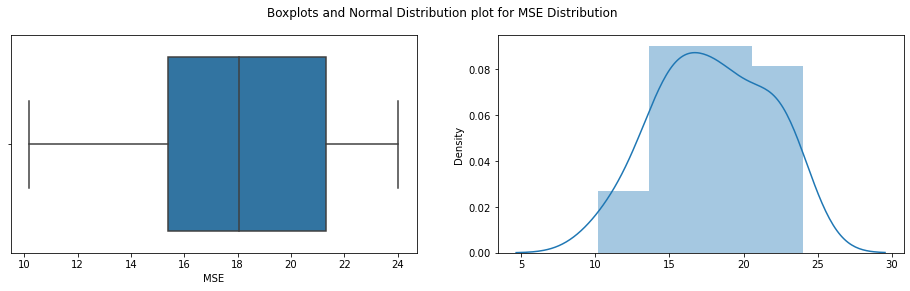

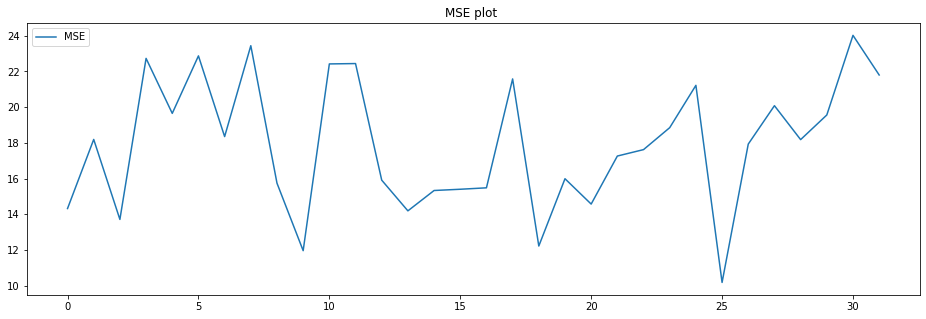


Shapiro_Wilk Test
Statistics=0.968, p=0.4569054246
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.323
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 69
mean=17.752,median=18.1 ,max=26.62,min=9.83,variance=22.924


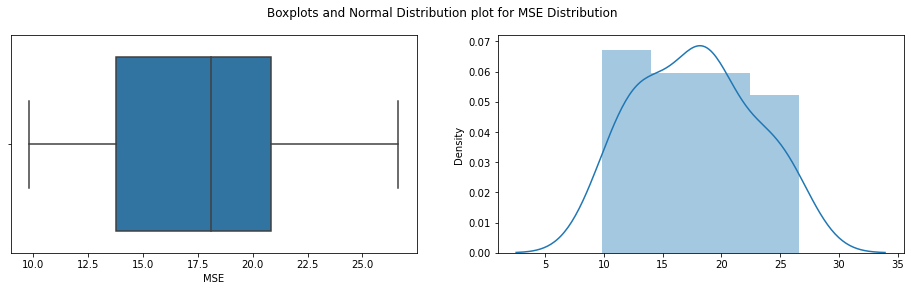

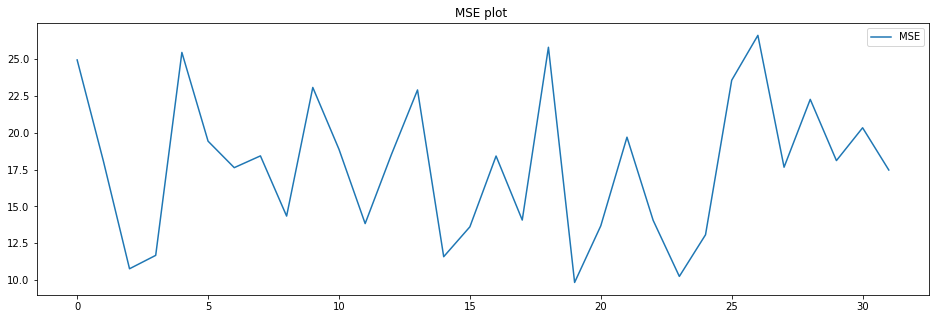


Shapiro_Wilk Test
Statistics=0.954, p=0.1905679405
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.473
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 70
mean=17.256,median=17.565 ,max=29.29,min=8.67,variance=22.523


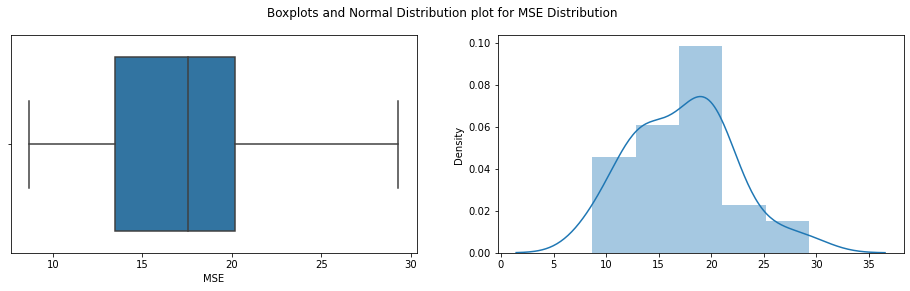

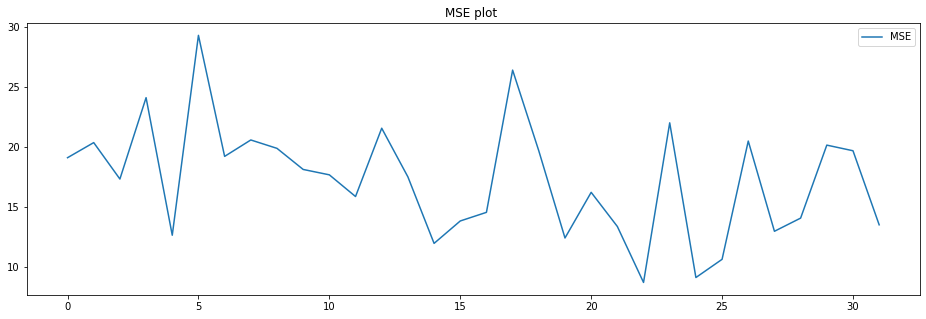


Shapiro_Wilk Test
Statistics=0.974, p=0.6110961437
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.318
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 71
mean=18.133,median=18.37 ,max=31.05,min=8.39,variance=32.217


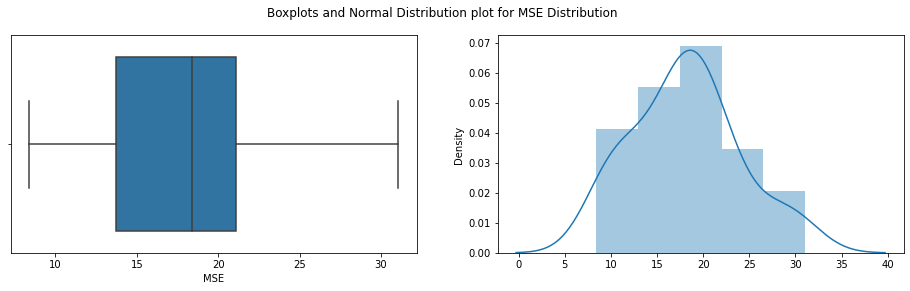

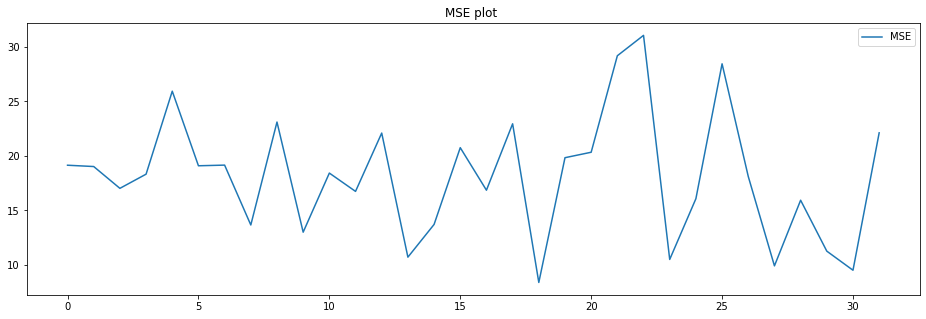


Shapiro_Wilk Test
Statistics=0.967, p=0.4275045395
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.328
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 72
mean=17.38,median=17.41 ,max=27.94,min=10.74,variance=23.486


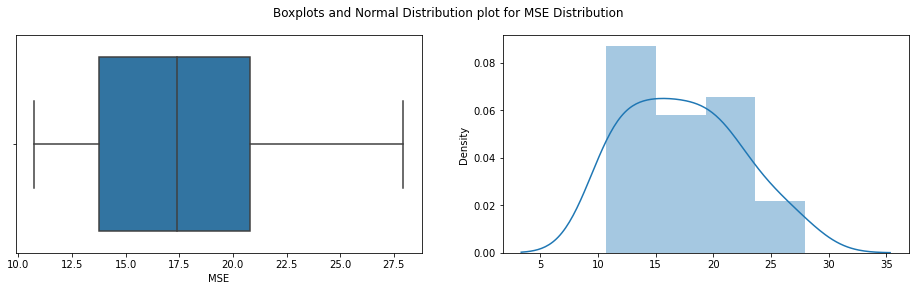

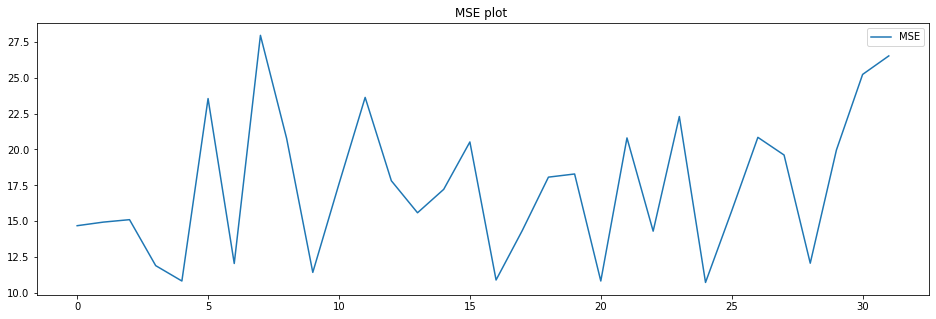


Shapiro_Wilk Test
Statistics=0.949, p=0.1393069476
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.424
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 73
mean=16.693,median=15.975 ,max=27.78,min=7.85,variance=18.128


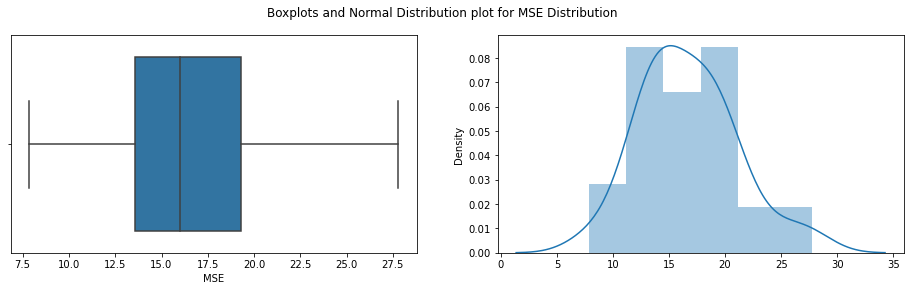

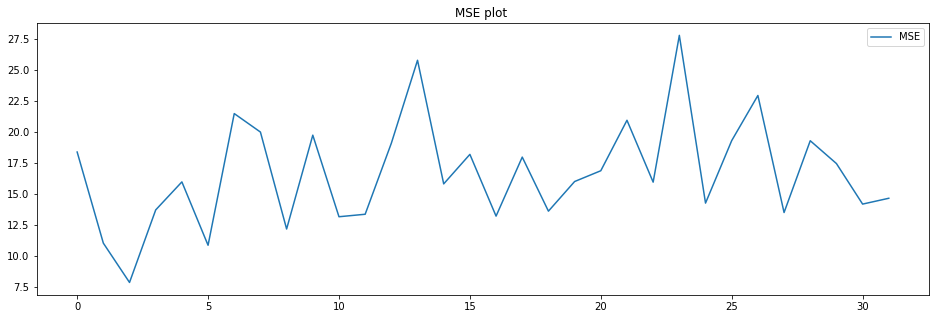


Shapiro_Wilk Test
Statistics=0.974, p=0.6081763506
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.327
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 74
mean=18.437,median=18.28 ,max=28.09,min=9.68,variance=19.64


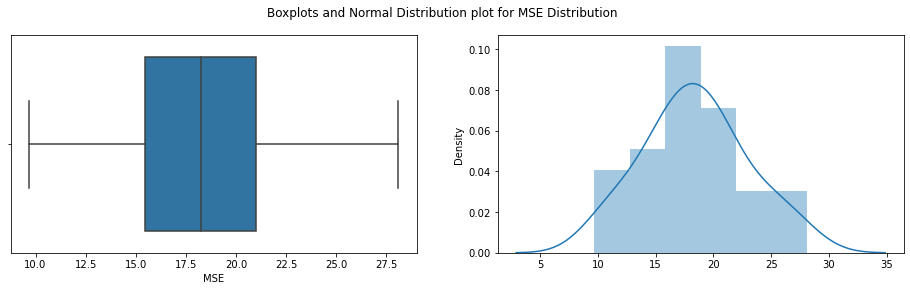

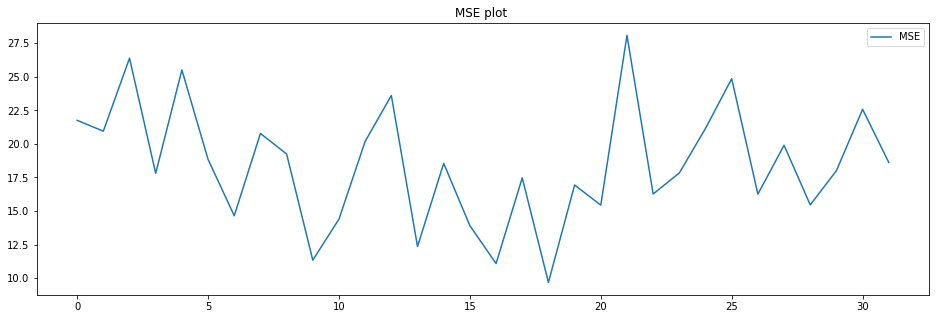


Shapiro_Wilk Test
Statistics=0.988, p=0.9757035971
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.121
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 75
mean=17.601,median=15.945 ,max=31.3,min=8.39,variance=34.031


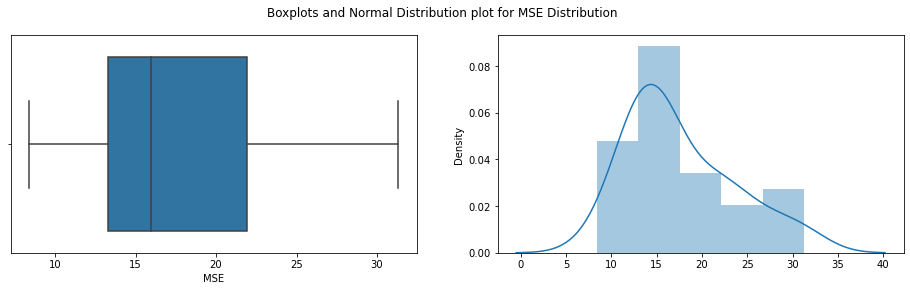

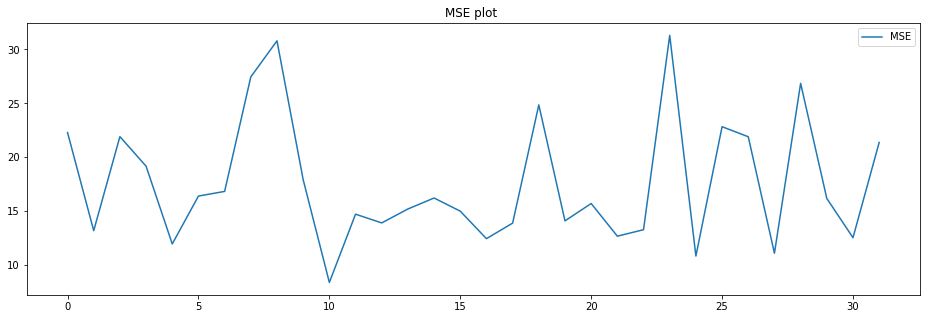


Shapiro_Wilk Test
Statistics=0.919, p=0.0191873163
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.006
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 76
mean=18.651,median=17.475 ,max=28.5,min=11.28,variance=20.39


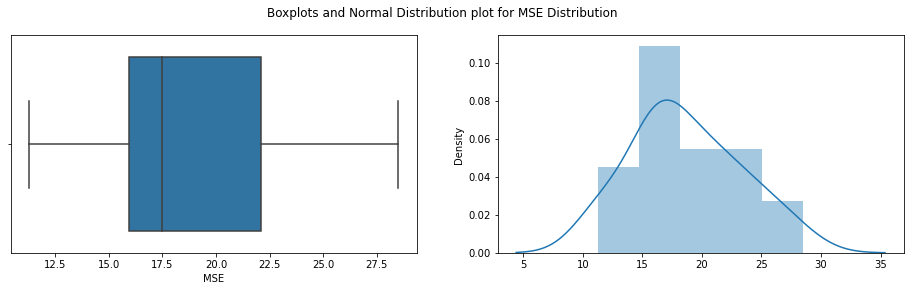

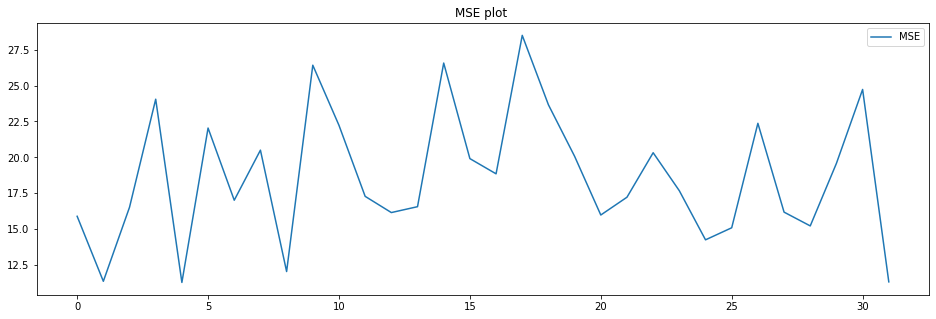


Shapiro_Wilk Test
Statistics=0.966, p=0.3947262466
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.347
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 77
mean=17.133,median=16.28 ,max=27.01,min=8.26,variance=26.131


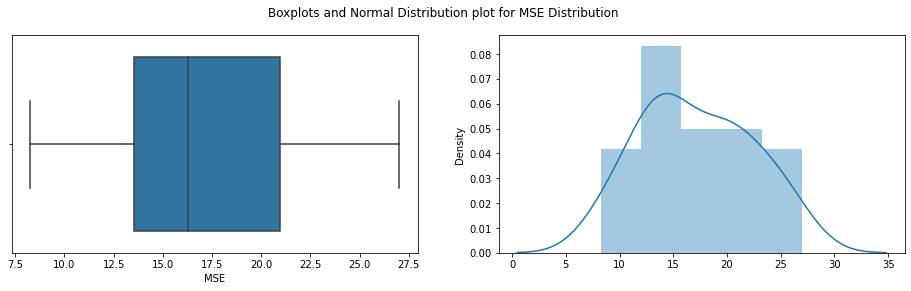

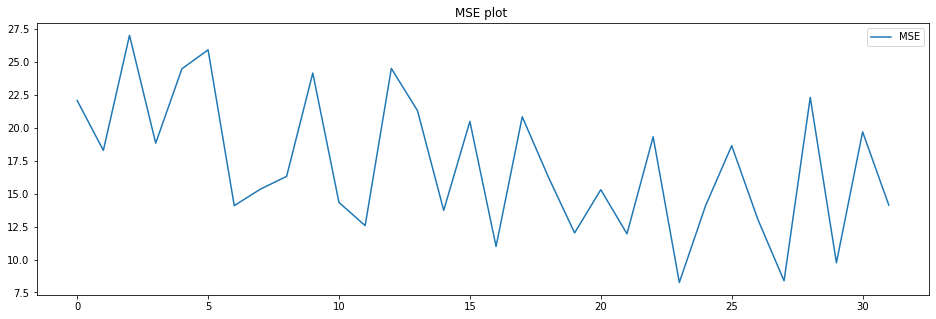


Shapiro_Wilk Test
Statistics=0.969, p=0.4687804580
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.317
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 78
mean=17.352,median=17.555 ,max=27.96,min=10.36,variance=15.654


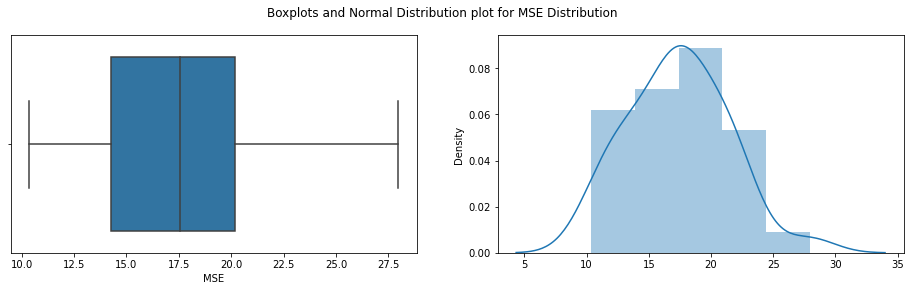

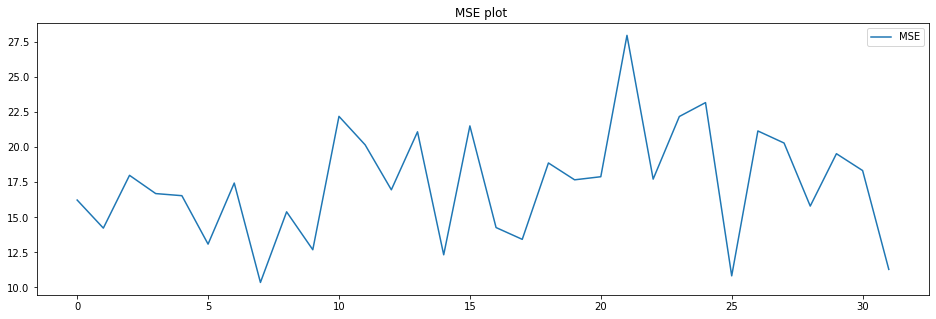


Shapiro_Wilk Test
Statistics=0.979, p=0.7593697309
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.177
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 79
mean=16.548,median=16.59 ,max=26.18,min=10.68,variance=12.556


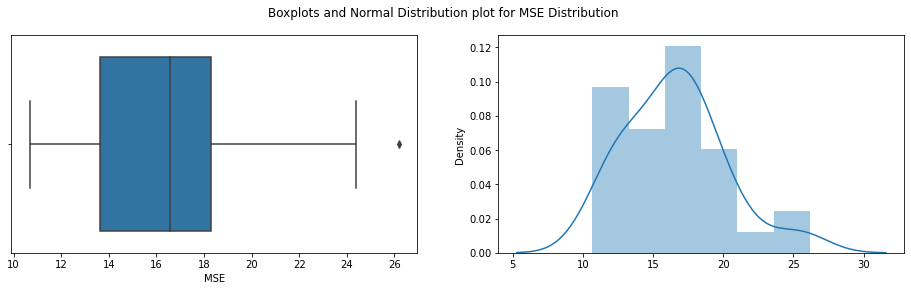

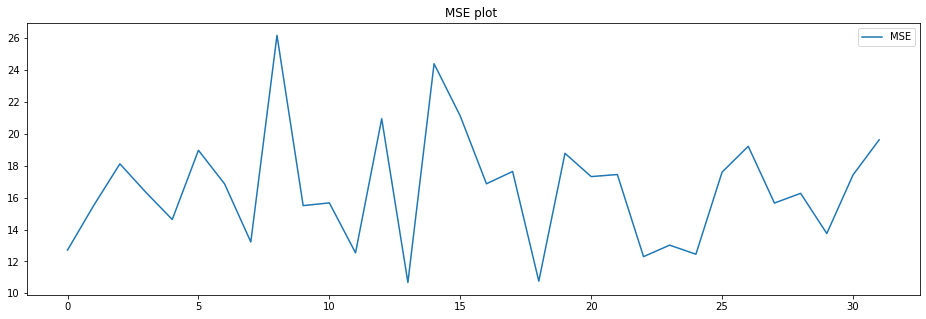


Shapiro_Wilk Test
Statistics=0.959, p=0.2559864819
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.366
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 80
mean=17.217,median=17.3 ,max=28.16,min=7.45,variance=17.502


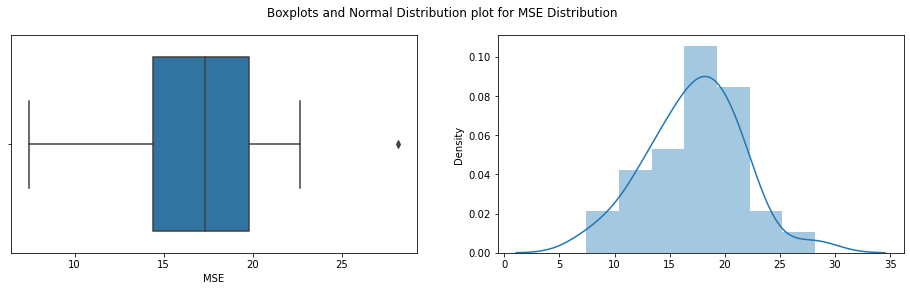

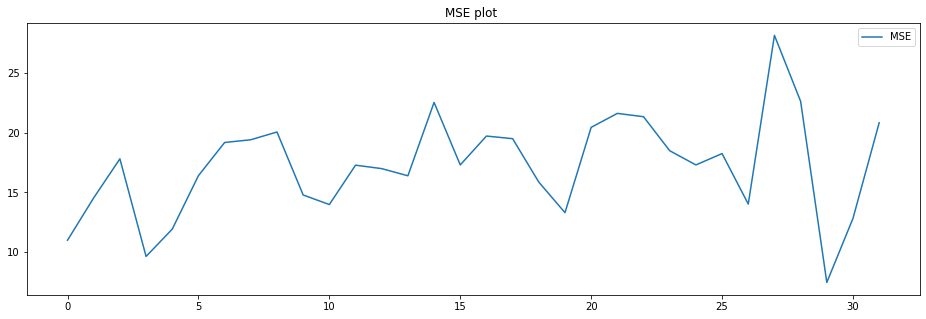


Shapiro_Wilk Test
Statistics=0.986, p=0.9391213655
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.200
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 81
mean=16.143,median=16.785 ,max=29.08,min=8.31,variance=19.262


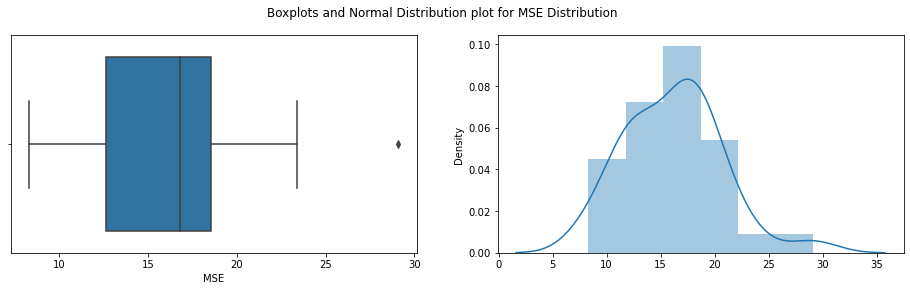

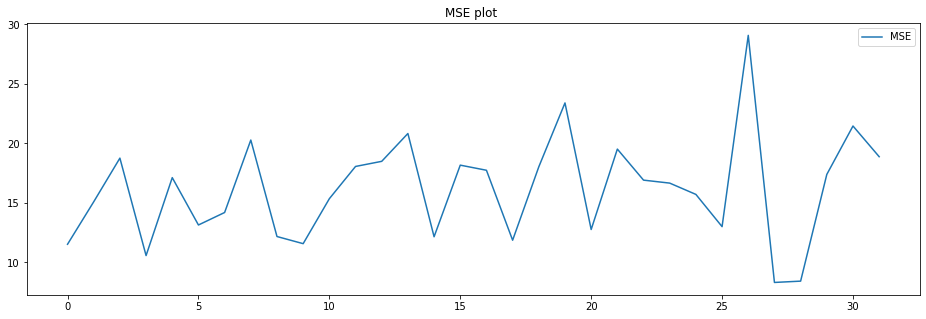


Shapiro_Wilk Test
Statistics=0.964, p=0.3565273881
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.333
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 82
mean=17.157,median=16.095 ,max=29.46,min=6.96,variance=22.715


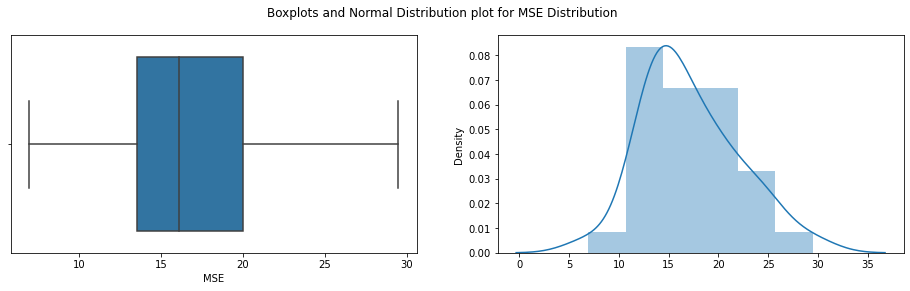

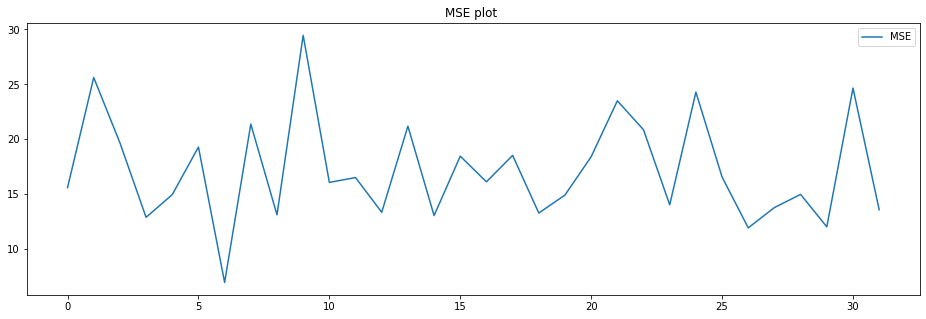


Shapiro_Wilk Test
Statistics=0.955, p=0.1935927421
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.646
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 83
mean=18.779,median=17.835 ,max=31.57,min=8.68,variance=26.368


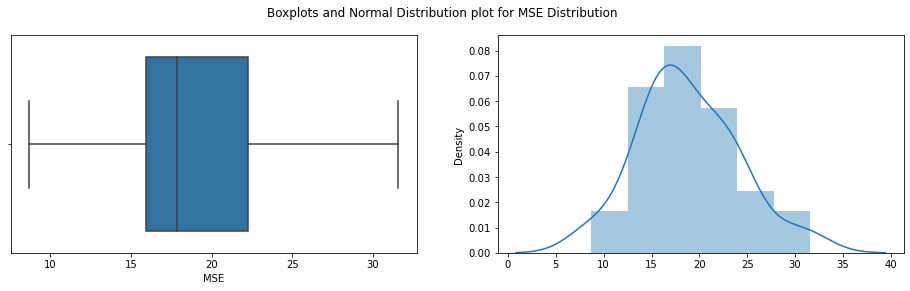

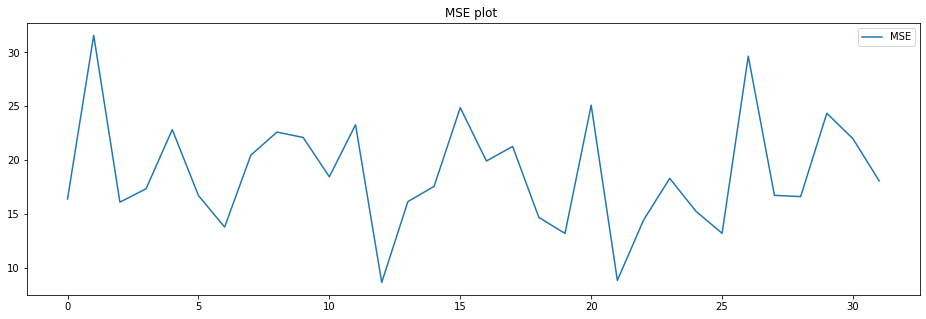


Shapiro_Wilk Test
Statistics=0.973, p=0.5731186867
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.344
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 84
mean=17.162,median=16.915 ,max=26.43,min=7.77,variance=19.949


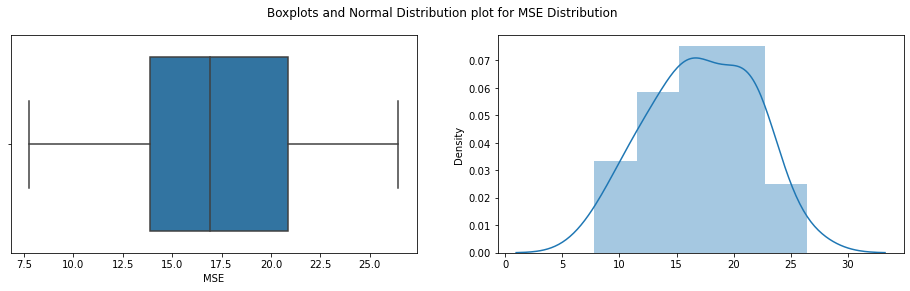

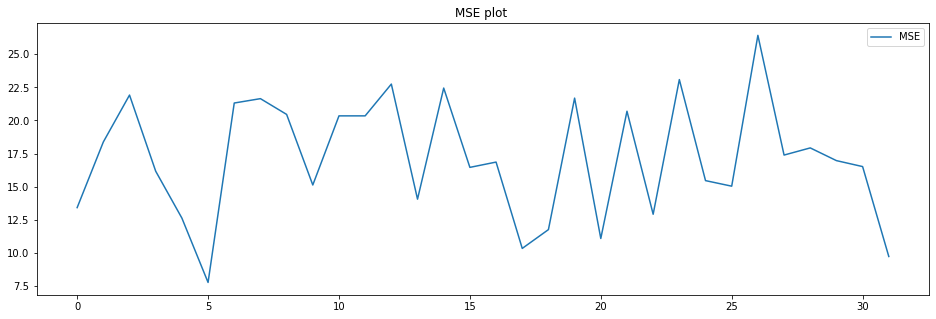


Shapiro_Wilk Test
Statistics=0.978, p=0.7472884059
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.292
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 85
mean=17.574,median=17.36 ,max=27.8,min=8.63,variance=20.752


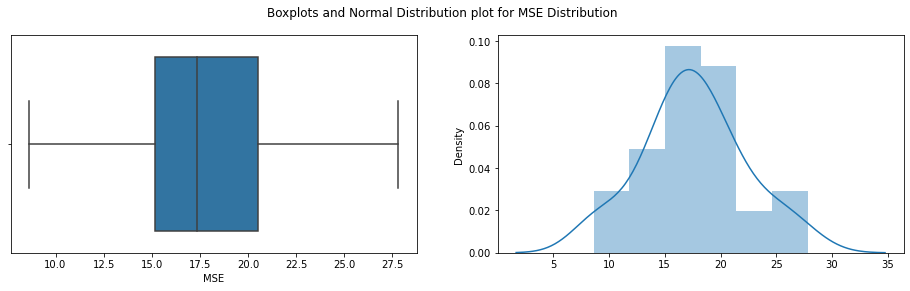

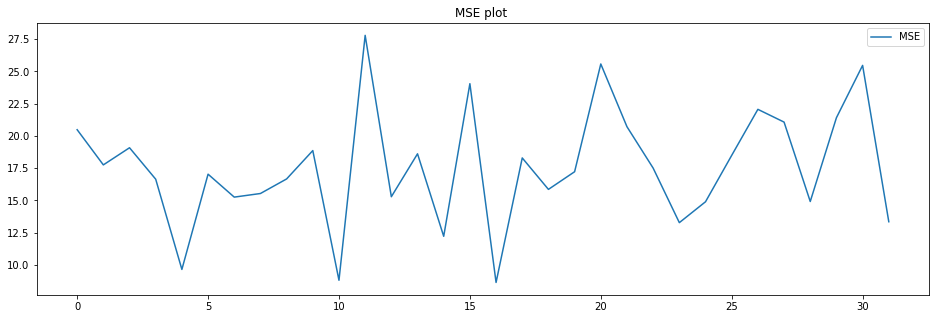


Shapiro_Wilk Test
Statistics=0.979, p=0.7552424073
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.252
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 86
mean=16.703,median=15.79 ,max=26.73,min=10.62,variance=14.119


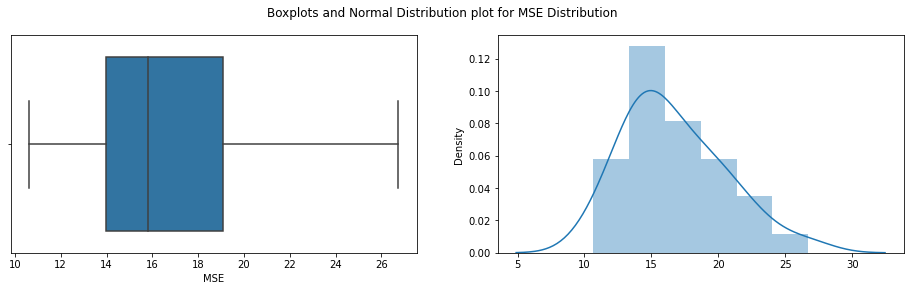

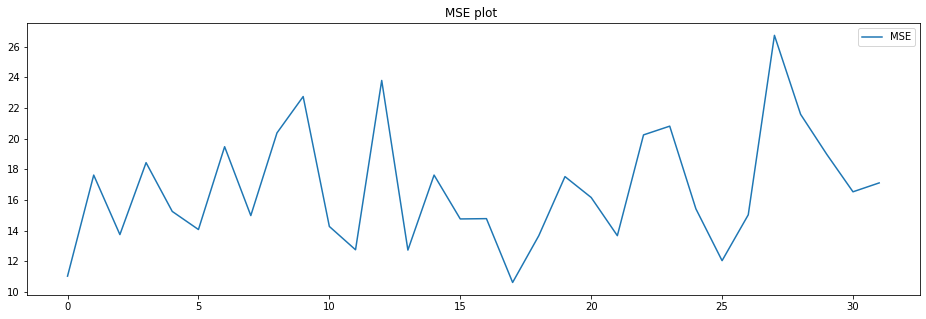


Shapiro_Wilk Test
Statistics=0.961, p=0.2971119285
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.418
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 87
mean=17.35,median=17.235 ,max=30.06,min=6.16,variance=28.247


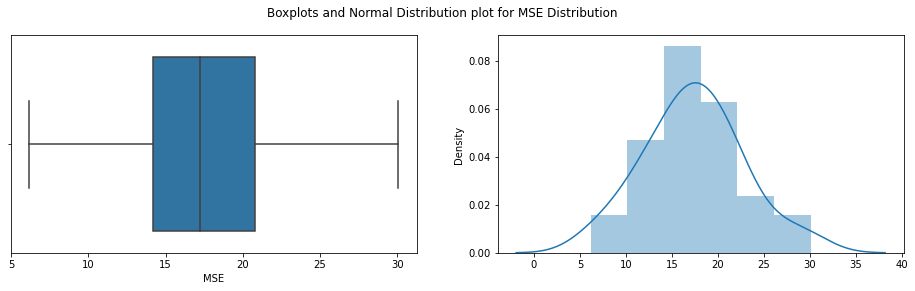

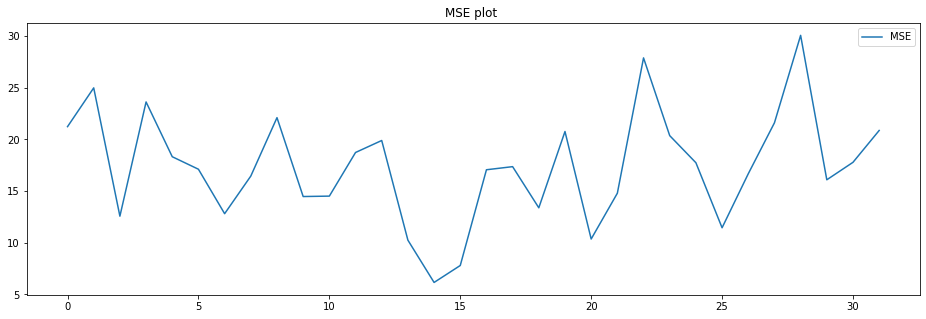


Shapiro_Wilk Test
Statistics=0.990, p=0.9875978231
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.150
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 88
mean=16.85,median=17.835 ,max=25.26,min=8.01,variance=23.106


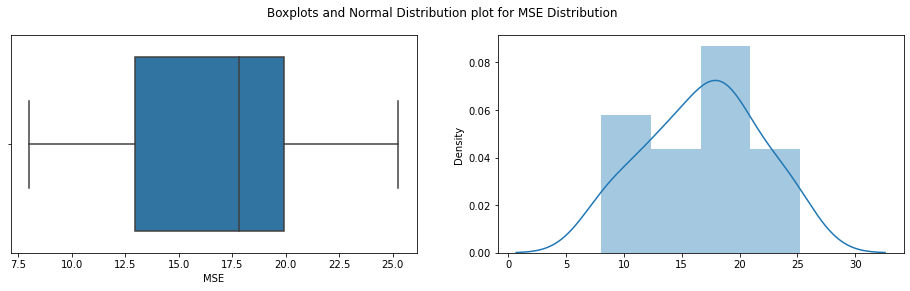

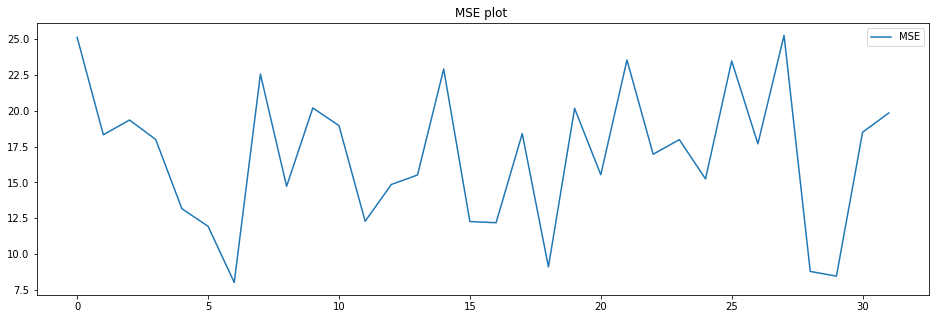


Shapiro_Wilk Test
Statistics=0.965, p=0.3664134145
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.307
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 89
mean=17.427,median=17.845 ,max=27.42,min=8.15,variance=22.711


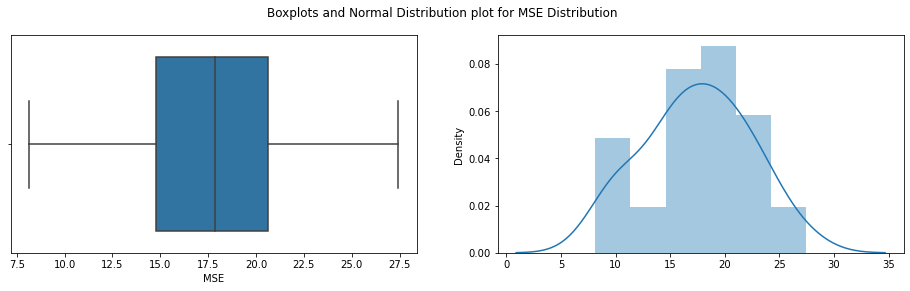

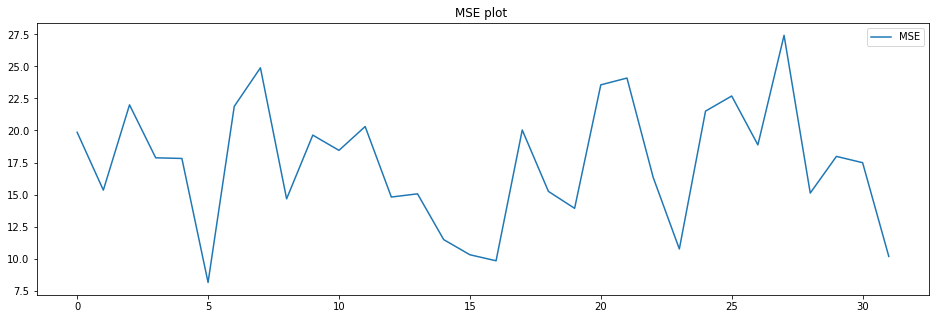


Shapiro_Wilk Test
Statistics=0.980, p=0.8066709638
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.220
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 90
mean=16.545,median=16.35 ,max=26.58,min=9.04,variance=16.131


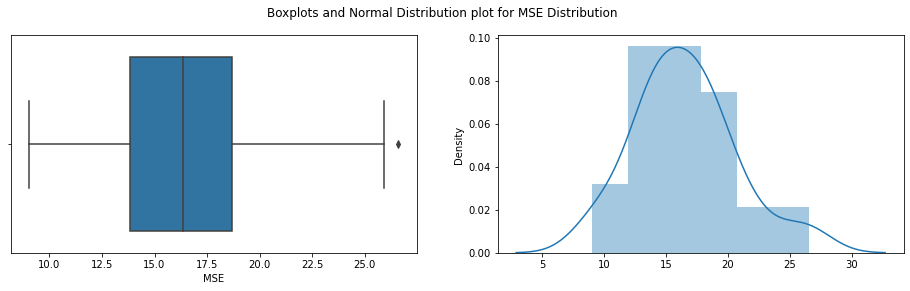

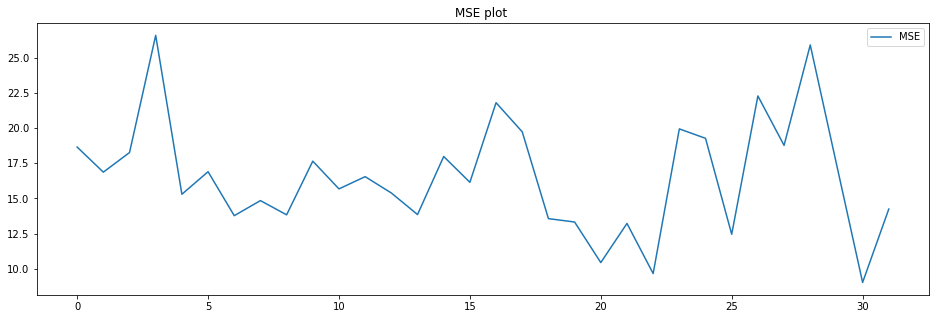


Shapiro_Wilk Test
Statistics=0.967, p=0.4294270873
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.324
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 91
mean=17.138,median=16.065 ,max=30.51,min=10.98,variance=21.301


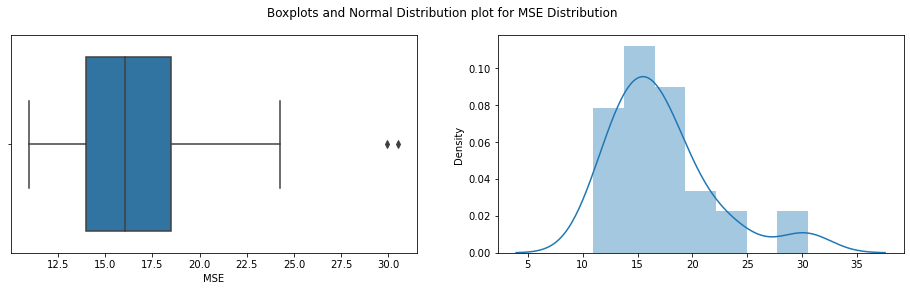

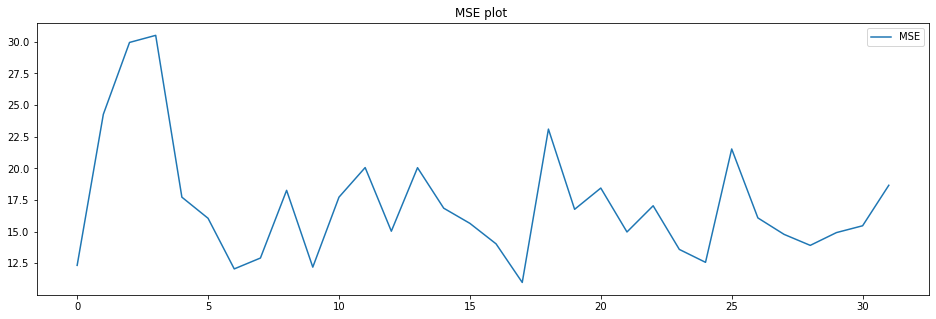


Shapiro_Wilk Test
Statistics=0.876, p=0.0015892078
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.148
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 92
mean=18.458,median=17.295 ,max=36.21,min=11.82,variance=32.916


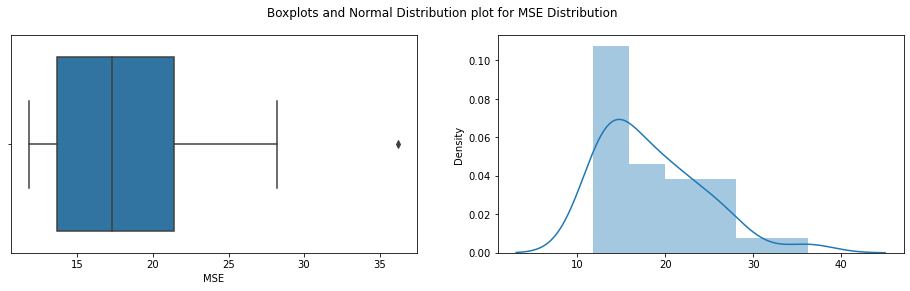

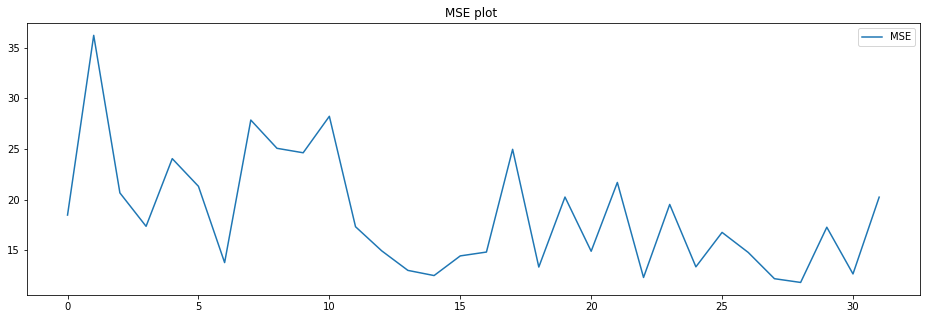


Shapiro_Wilk Test
Statistics=0.897, p=0.0052843192
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.928
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 93
mean=17.302,median=16.265 ,max=32.19,min=7.51,variance=29.442


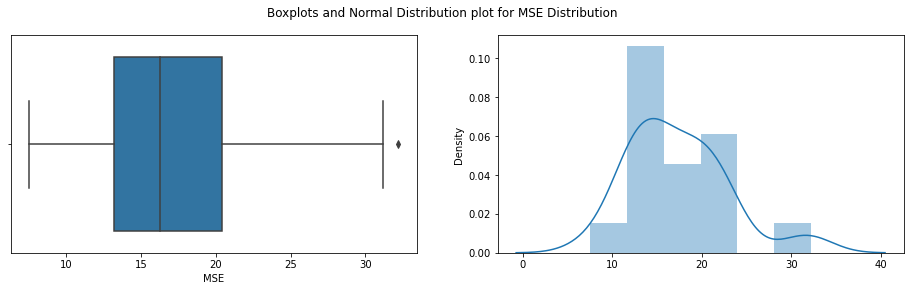

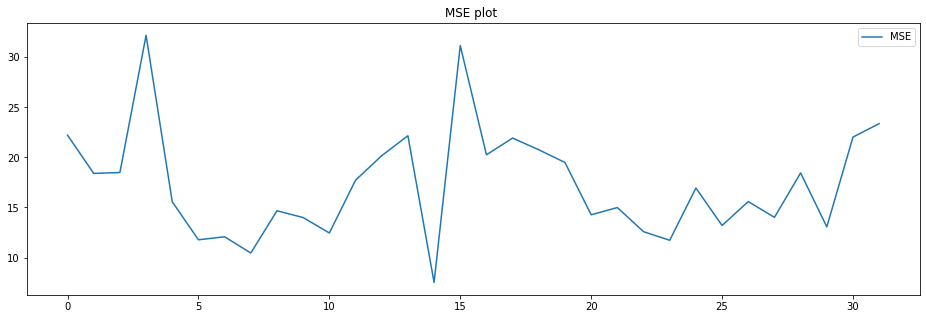


Shapiro_Wilk Test
Statistics=0.933, p=0.0488271415
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.618
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 94
mean=16.828,median=16.245 ,max=32.22,min=8.63,variance=28.685


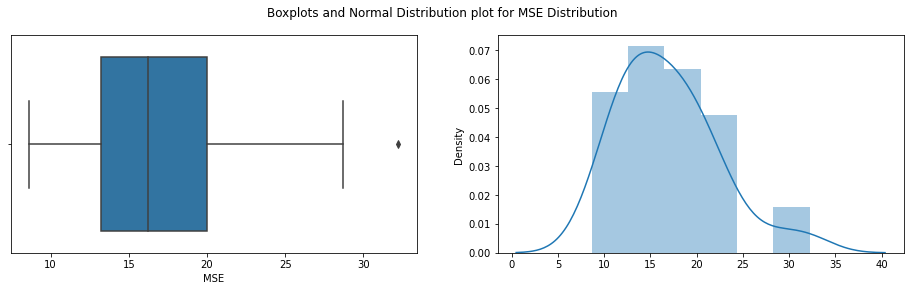

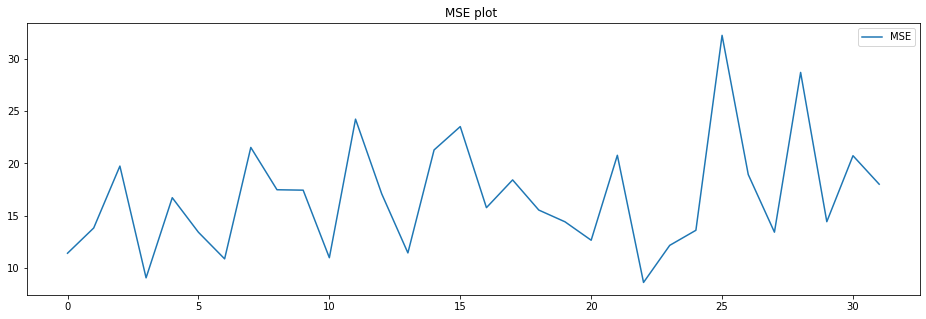


Shapiro_Wilk Test
Statistics=0.946, p=0.1096114591
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.450
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 95
mean=17.126,median=17.16 ,max=28.38,min=6.94,variance=25.223


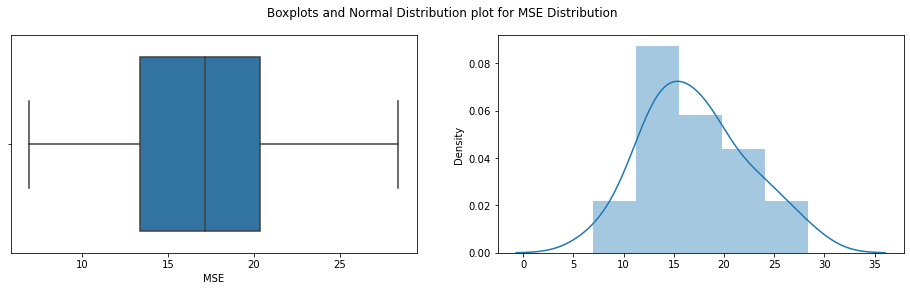

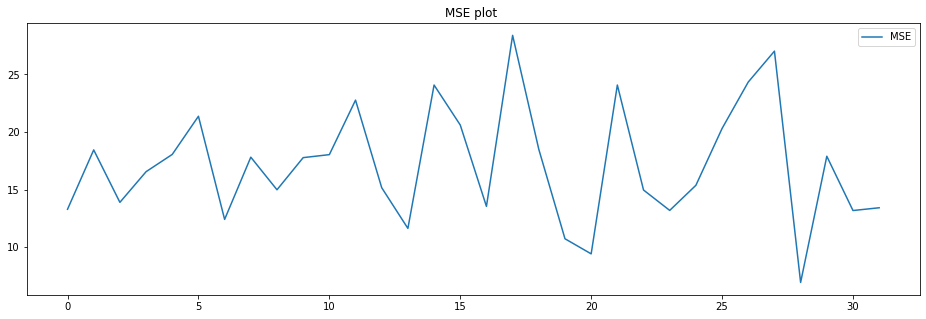


Shapiro_Wilk Test
Statistics=0.976, p=0.6647627354
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.355
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 96
mean=16.394,median=16.235 ,max=26.44,min=8.07,variance=20.103


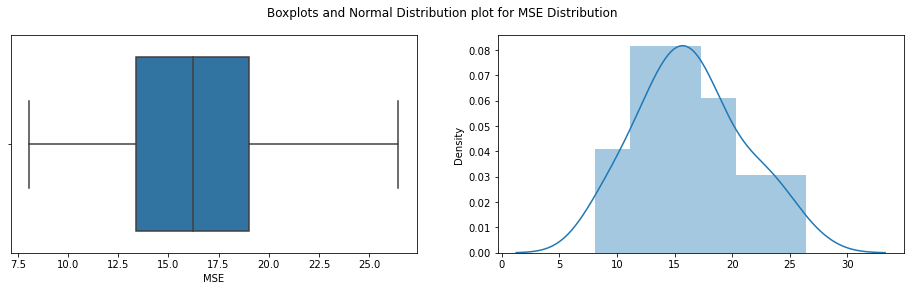

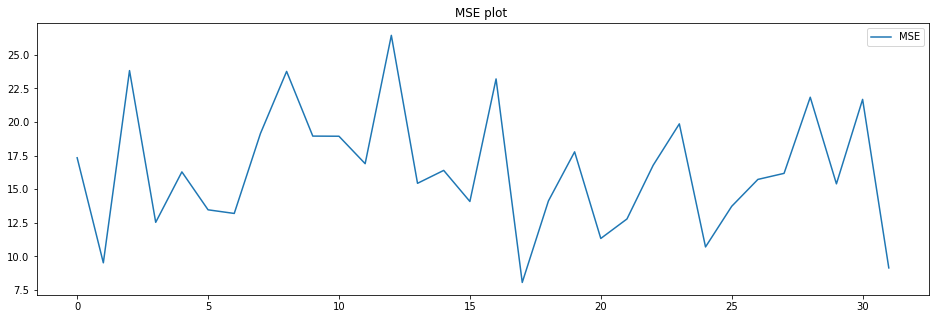


Shapiro_Wilk Test
Statistics=0.981, p=0.8285951614
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.208
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 97
mean=16.845,median=16.85 ,max=23.45,min=9.62,variance=14.381


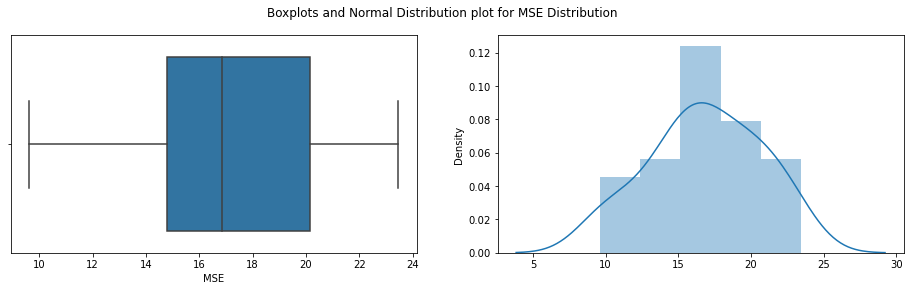

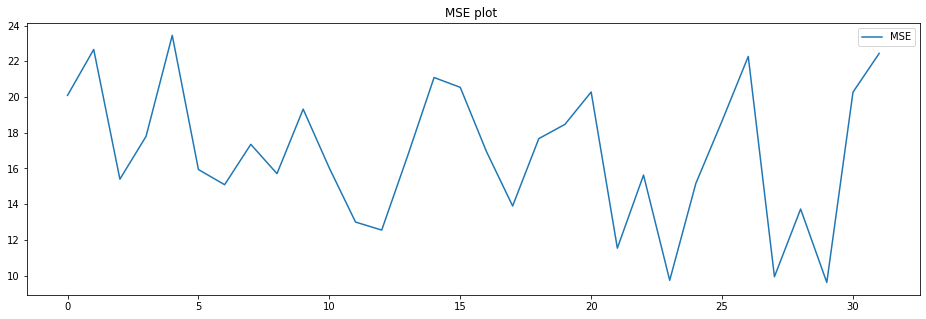


Shapiro_Wilk Test
Statistics=0.970, p=0.4958706498
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.219
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 98
mean=17.667,median=17.34 ,max=26.03,min=7.81,variance=23.788


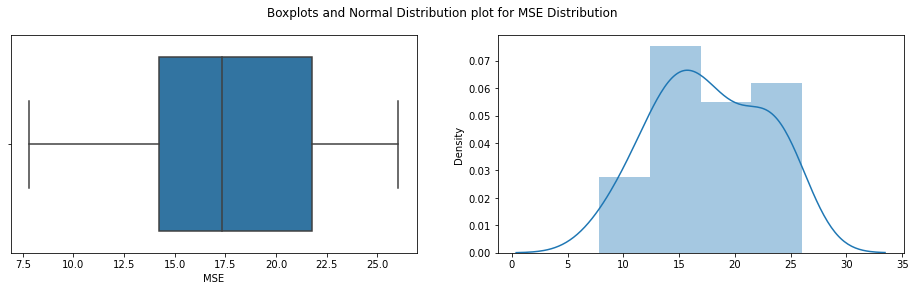

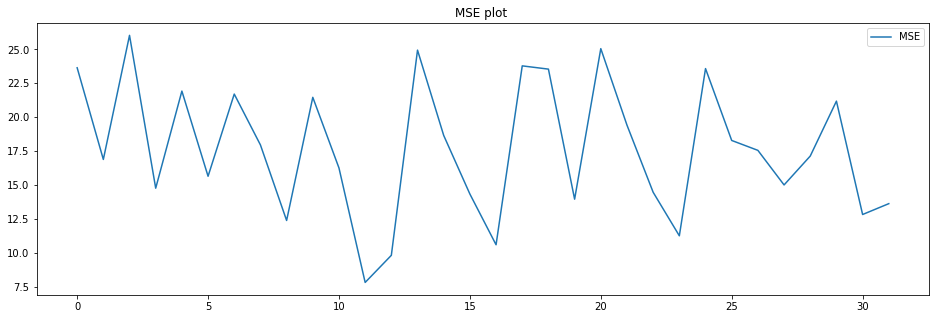


Shapiro_Wilk Test
Statistics=0.967, p=0.4314016998
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.336
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 99
mean=15.533,median=14.465 ,max=28.45,min=6.53,variance=16.795


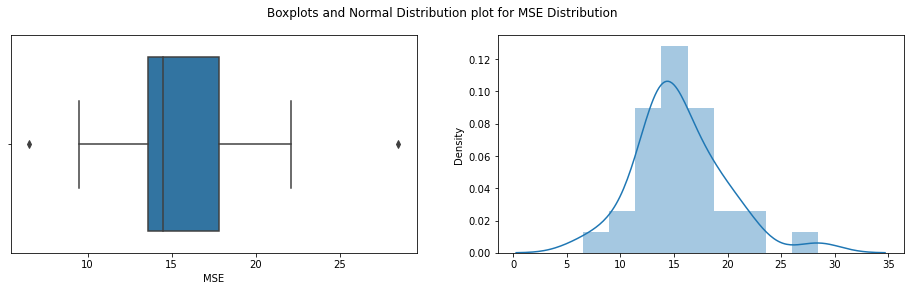

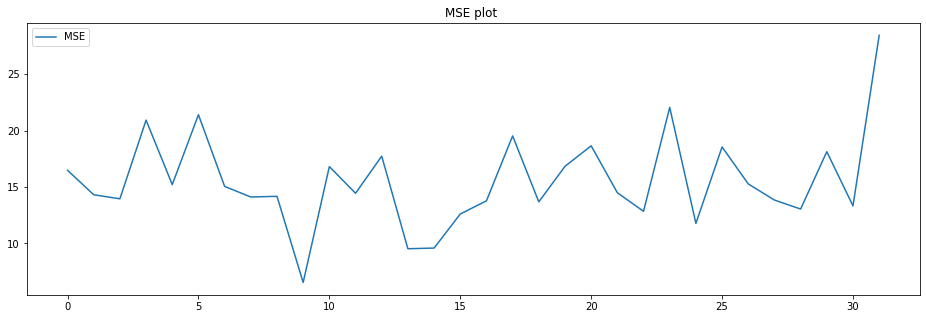


Shapiro_Wilk Test
Statistics=0.944, p=0.0996010080
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.689
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 100
mean=16.591,median=15.47 ,max=30.77,min=8.7,variance=24.608


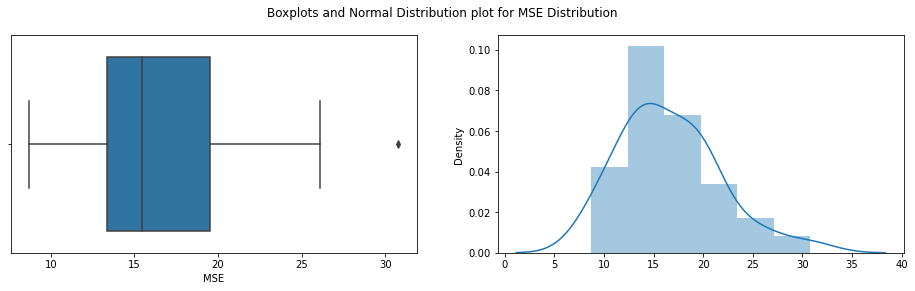

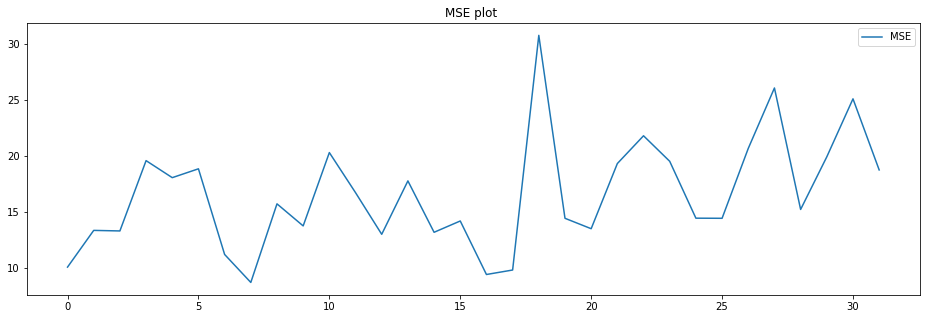


Shapiro_Wilk Test
Statistics=0.950, p=0.1462445259
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.486
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 101
mean=17.17,median=16.44 ,max=26.84,min=11.3,variance=17.592


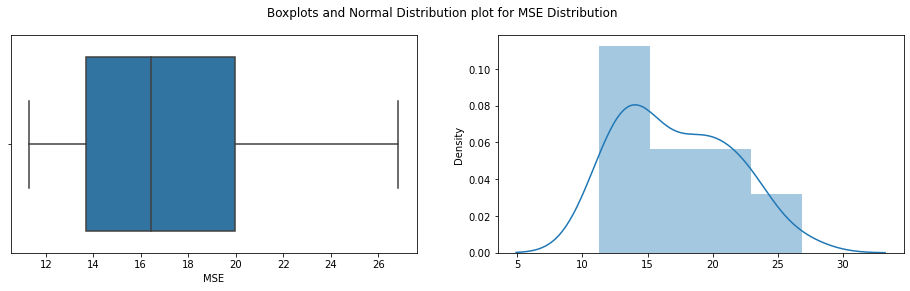

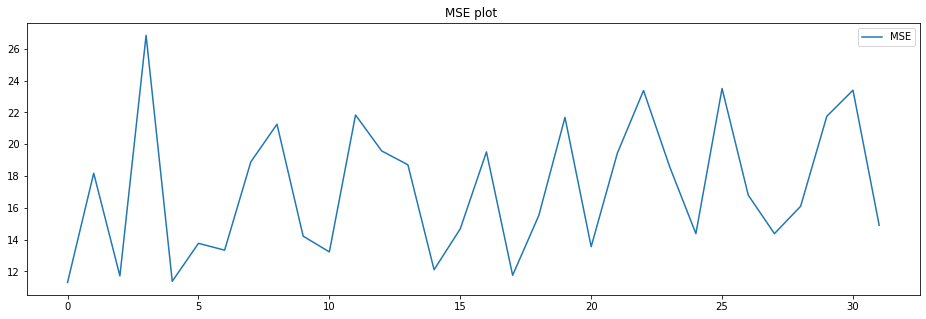


Shapiro_Wilk Test
Statistics=0.943, p=0.0924556106
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.608
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 102
mean=15.833,median=15.44 ,max=27.47,min=4.19,variance=33.019


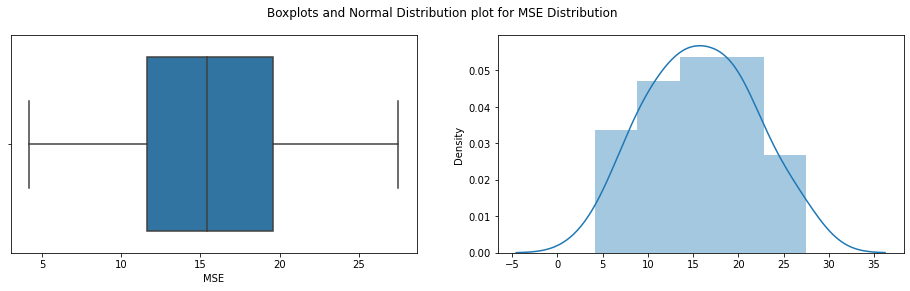

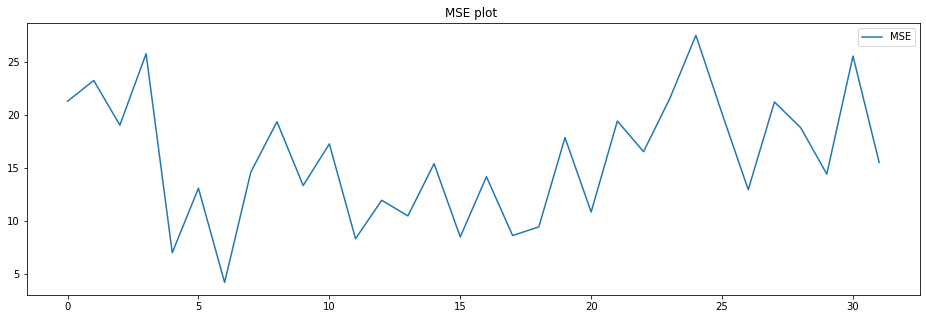


Shapiro_Wilk Test
Statistics=0.985, p=0.9306532145
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.150
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 103
mean=17.123,median=16.97 ,max=27.94,min=9.64,variance=19.458


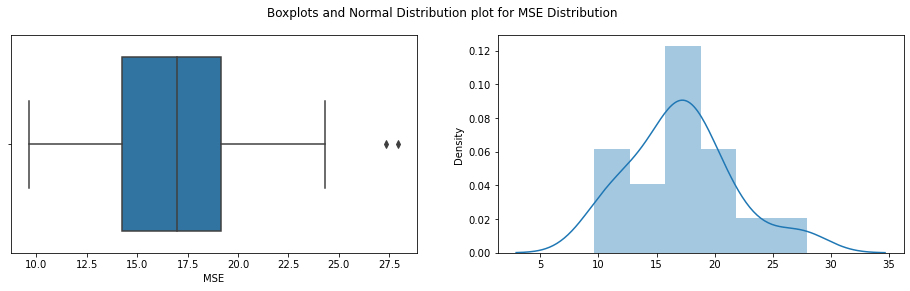

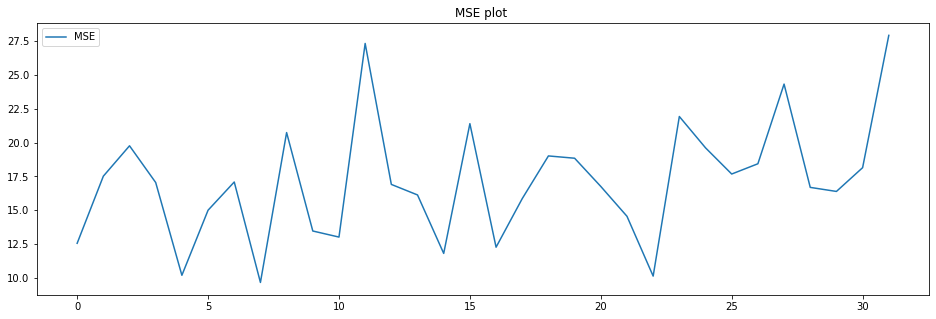


Shapiro_Wilk Test
Statistics=0.961, p=0.2864507437
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.370
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 104
mean=17.762,median=18.035 ,max=32.42,min=9.6,variance=25.955


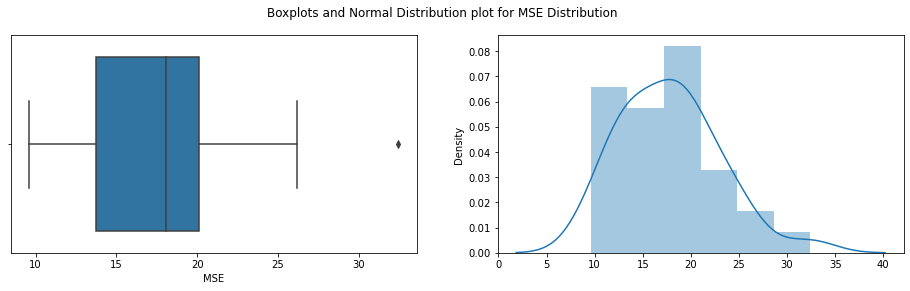

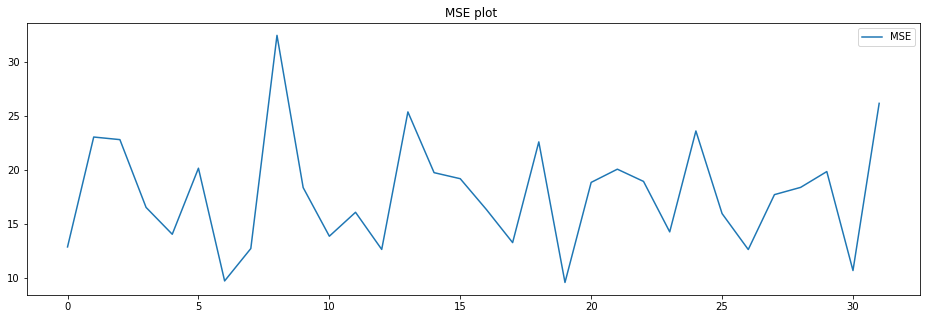


Shapiro_Wilk Test
Statistics=0.962, p=0.3090300560
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.319
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 105
mean=17.865,median=17.23 ,max=31.53,min=6.77,variance=25.27


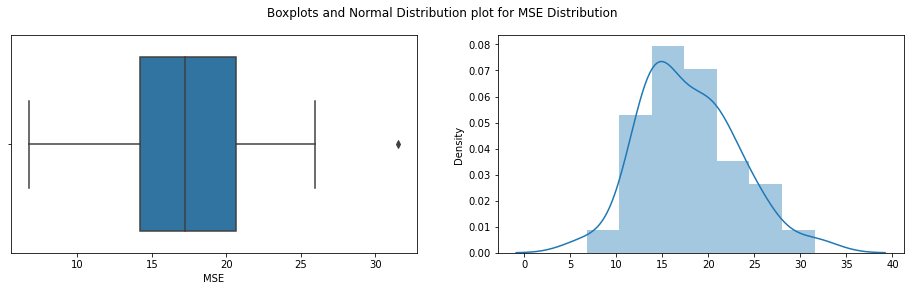

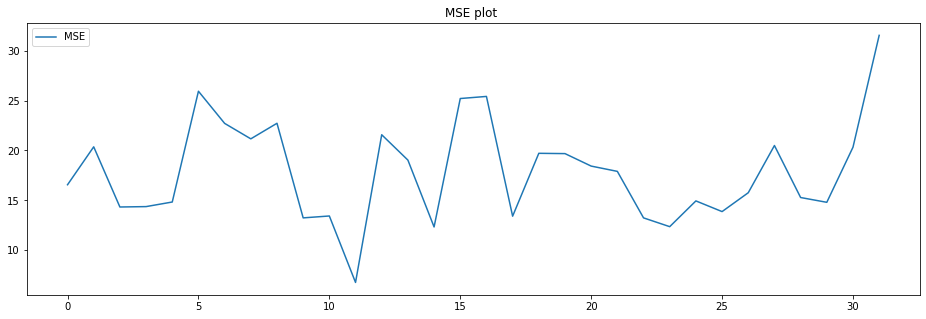


Shapiro_Wilk Test
Statistics=0.960, p=0.2702847719
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.545
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 106
mean=16.706,median=16.295 ,max=29.71,min=8.86,variance=25.301


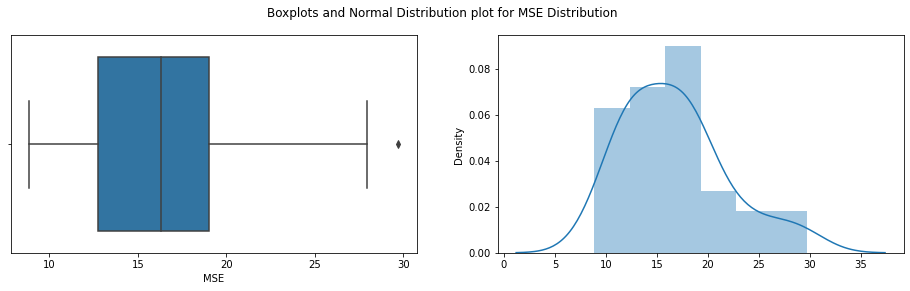

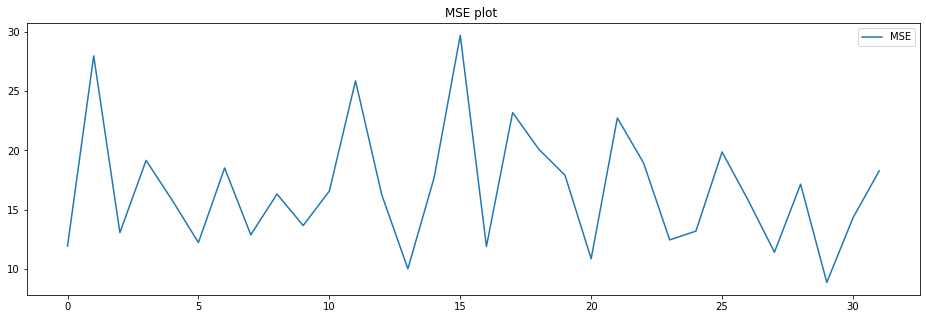


Shapiro_Wilk Test
Statistics=0.941, p=0.0778705701
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.580
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 107
mean=19.216,median=17.615 ,max=34.39,min=11.82,variance=25.986


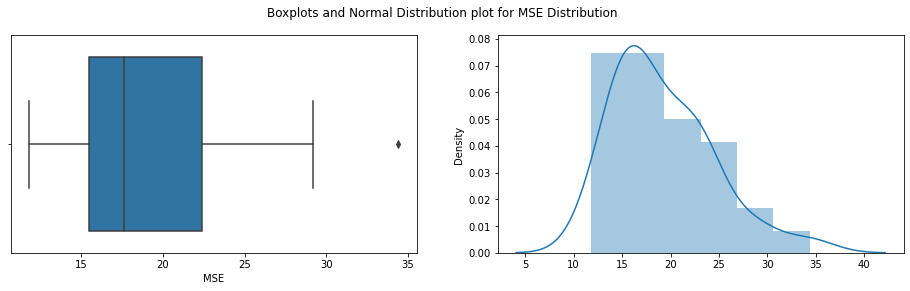

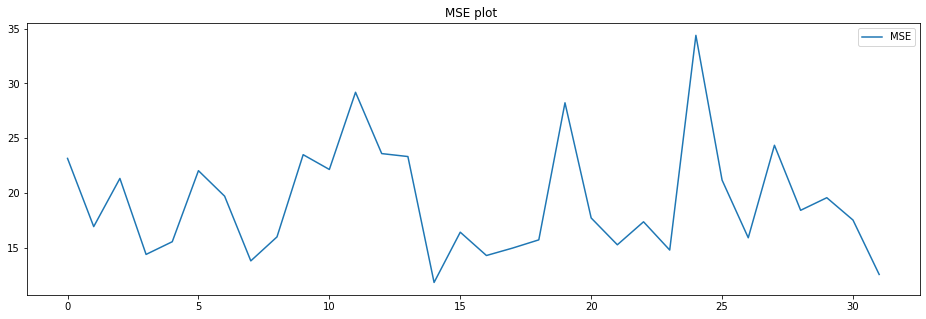


Shapiro_Wilk Test
Statistics=0.923, p=0.0248686690
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.767
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 108
mean=17.269,median=17.125 ,max=26.76,min=8.99,variance=20.21


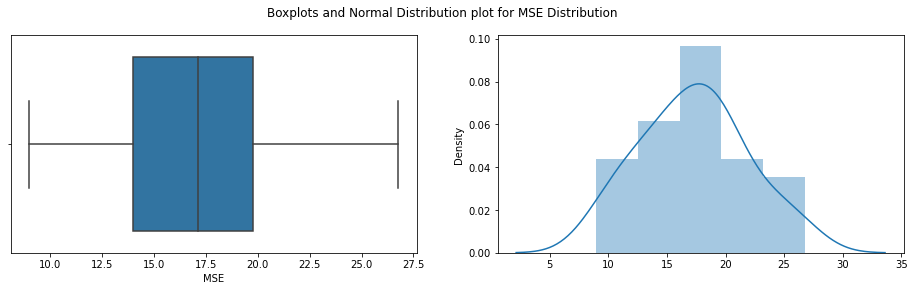

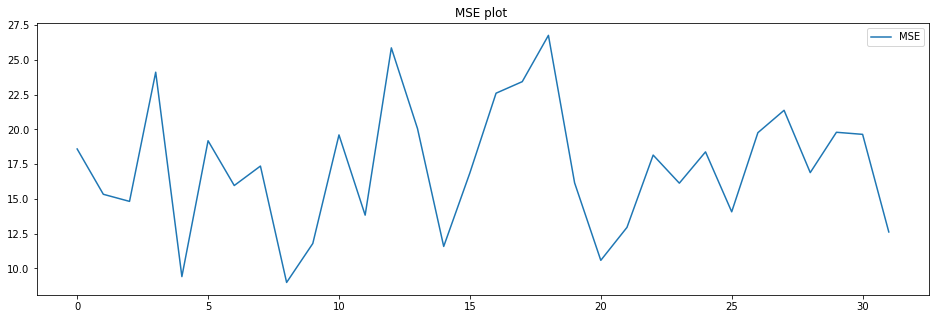


Shapiro_Wilk Test
Statistics=0.983, p=0.8907033801
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.144
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 109
mean=17.88,median=17.59 ,max=29.7,min=9.41,variance=18.946


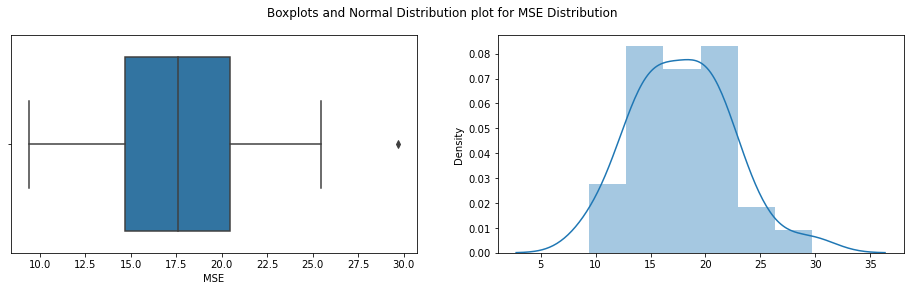

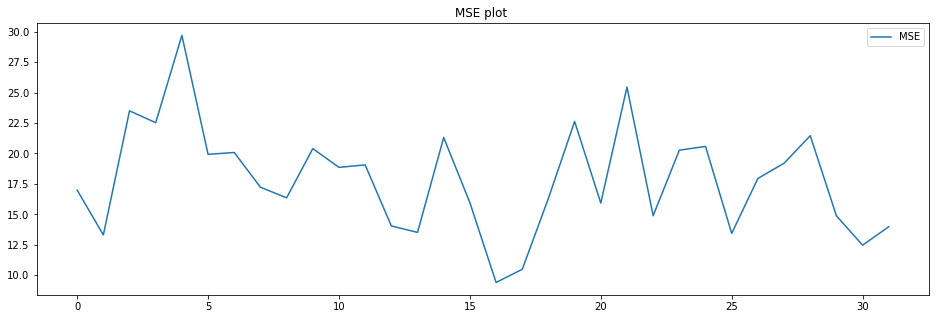


Shapiro_Wilk Test
Statistics=0.982, p=0.8603060246
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.197
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 110
mean=17.24,median=17.92 ,max=27.32,min=6.86,variance=25.998


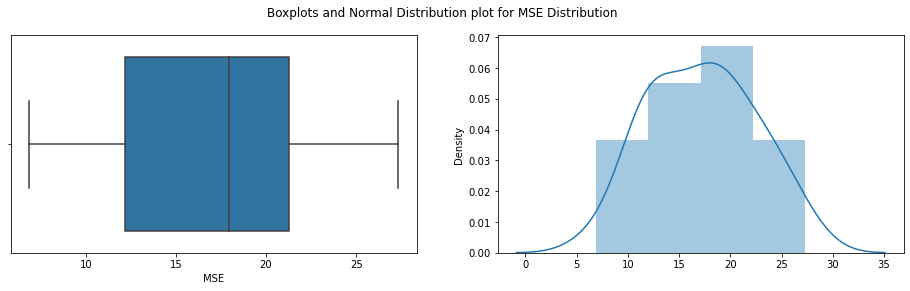

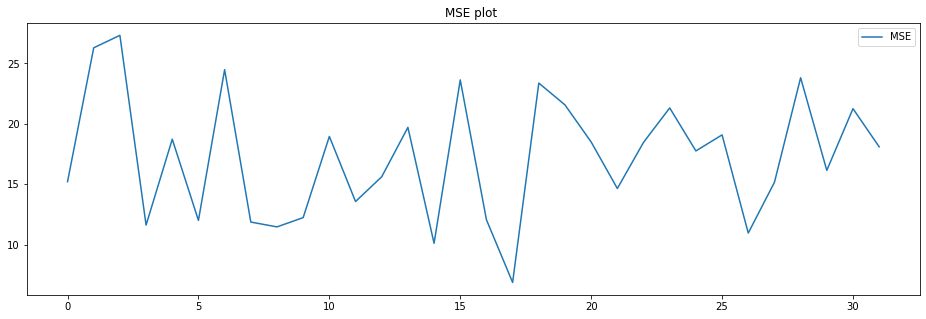


Shapiro_Wilk Test
Statistics=0.974, p=0.6013484597
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.329
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 111
mean=17.903,median=16.005 ,max=30.62,min=6.66,variance=40.065


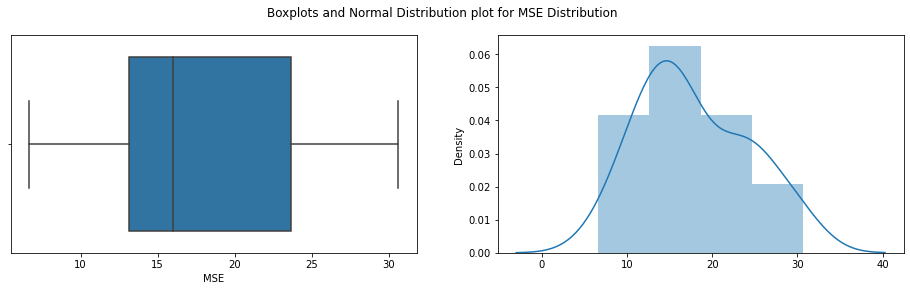

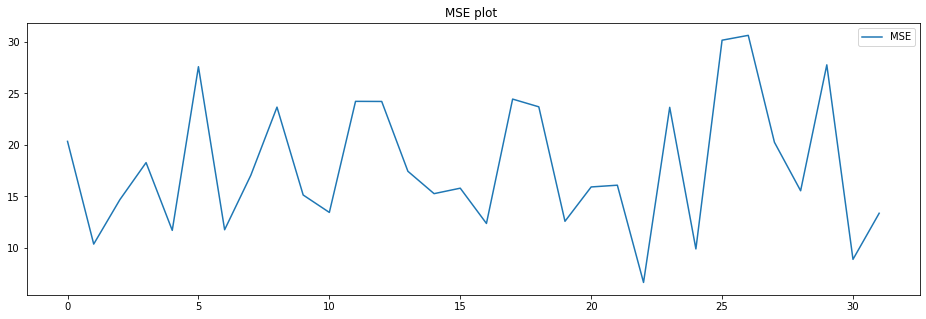


Shapiro_Wilk Test
Statistics=0.955, p=0.1953679770
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.581
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 112
mean=17.842,median=18.36 ,max=26.01,min=9.59,variance=17.148


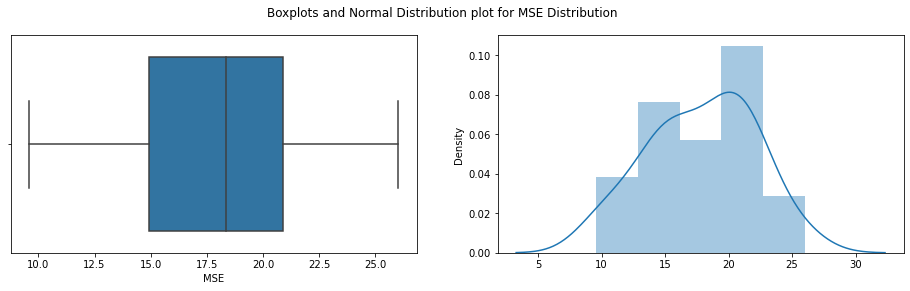

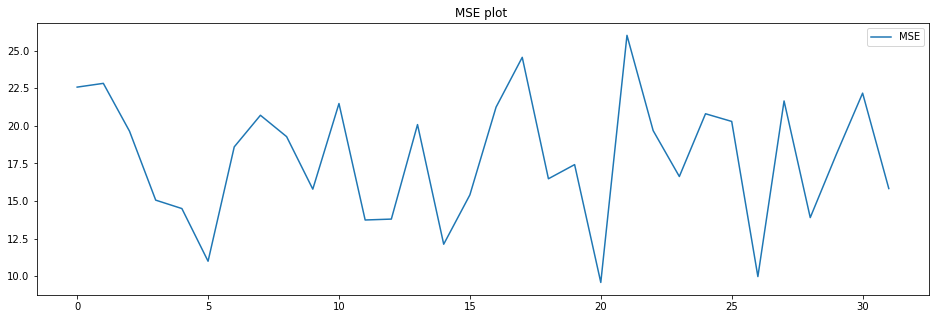


Shapiro_Wilk Test
Statistics=0.977, p=0.7164975405
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.268
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 113
mean=17.246,median=16.3 ,max=34.79,min=9.64,variance=25.49


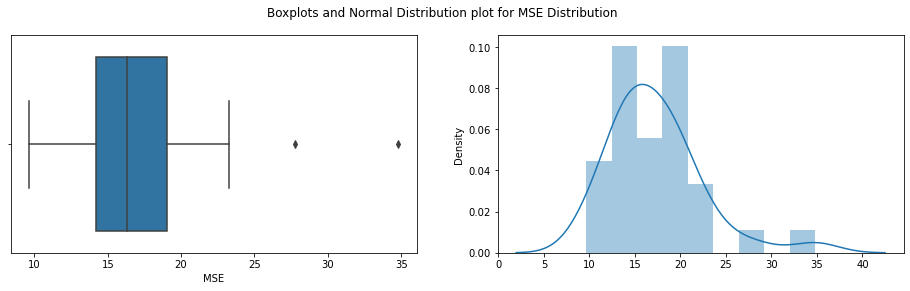

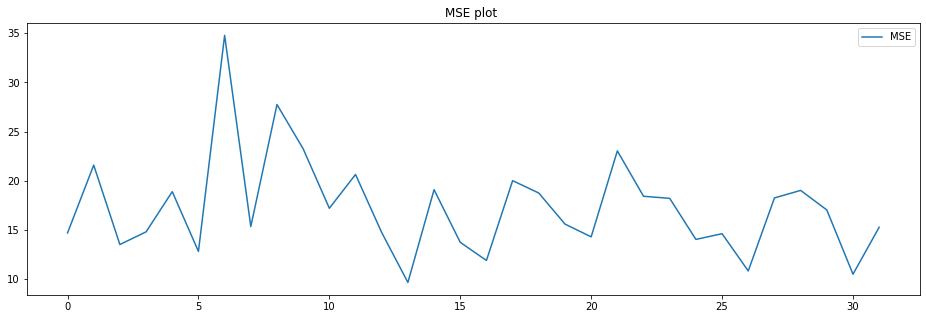


Shapiro_Wilk Test
Statistics=0.901, p=0.0064385985
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.795
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 114
mean=17.272,median=16.94 ,max=33.57,min=9.58,variance=23.304


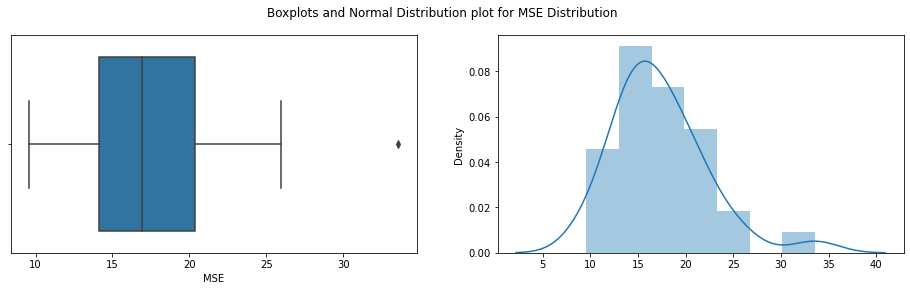

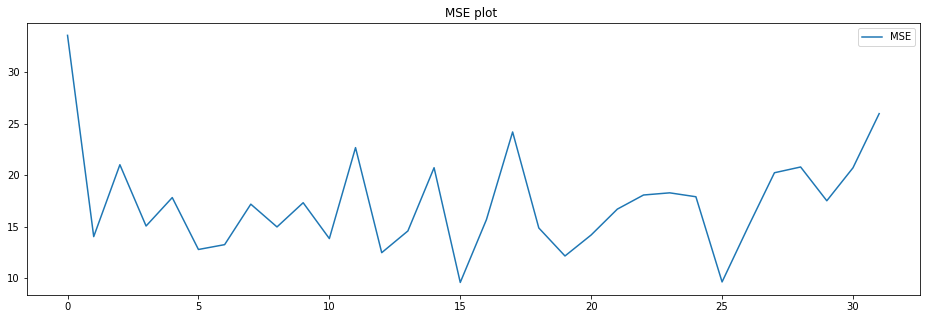


Shapiro_Wilk Test
Statistics=0.923, p=0.0243490916
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.629
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 115
mean=17.404,median=16.995 ,max=29.95,min=8.61,variance=26.257


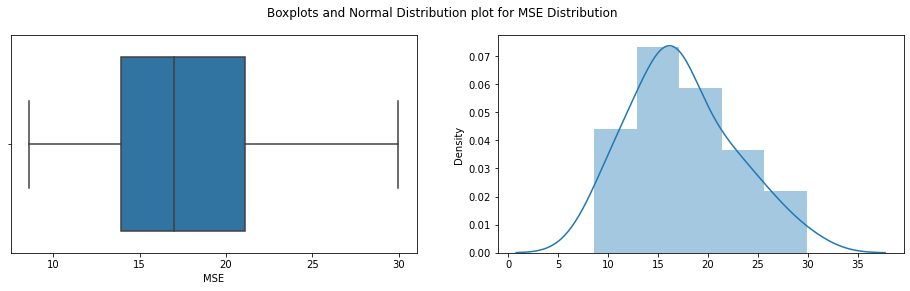

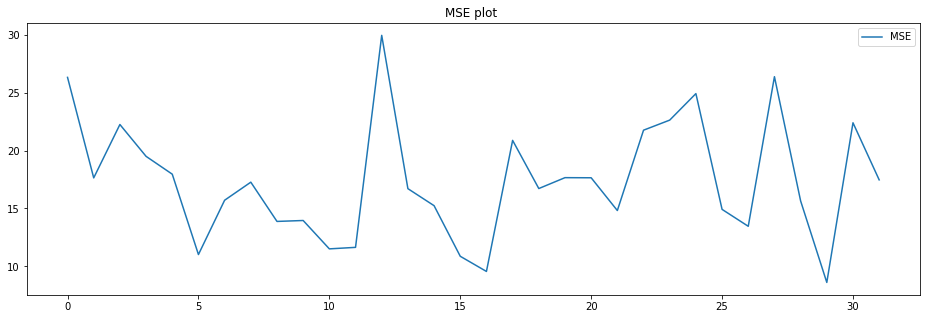


Shapiro_Wilk Test
Statistics=0.968, p=0.4565601349
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.367
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 116
mean=16.79,median=15.635 ,max=29.19,min=7.95,variance=19.202


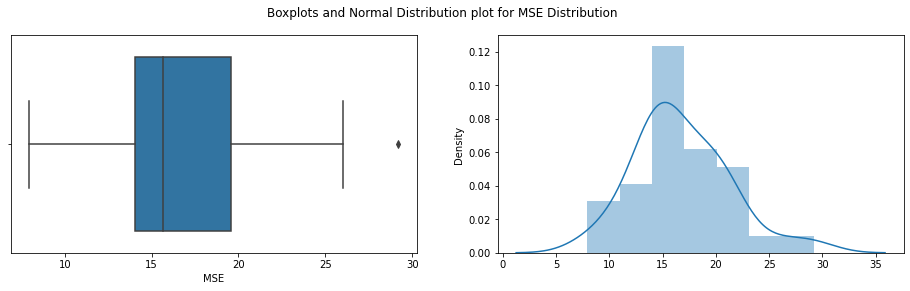

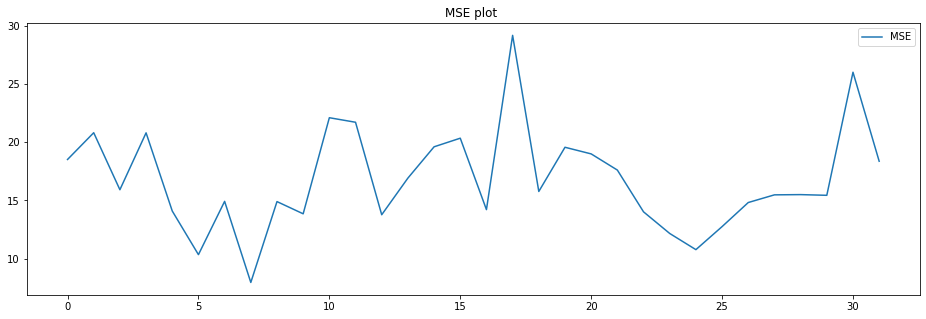


Shapiro_Wilk Test
Statistics=0.964, p=0.3496531844
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.442
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 117
mean=18.075,median=16.95 ,max=35.22,min=10.75,variance=27.378


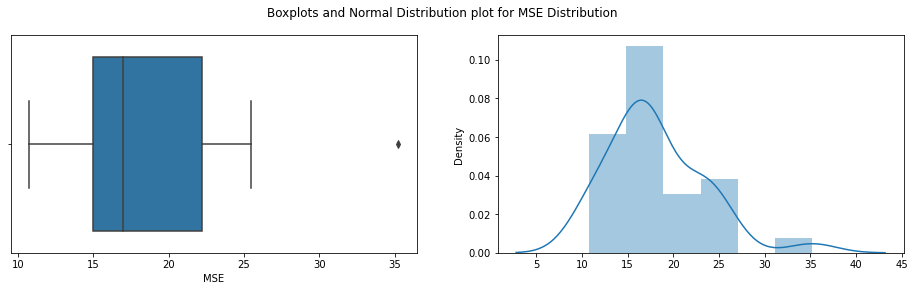

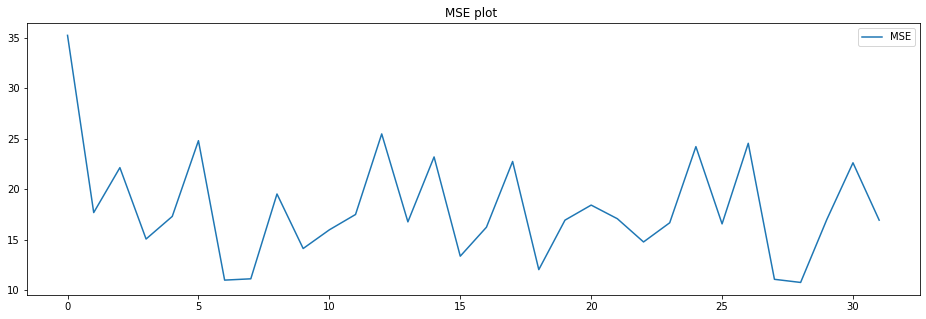


Shapiro_Wilk Test
Statistics=0.910, p=0.0110525163
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.849
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 118
mean=18.446,median=18.655 ,max=29.09,min=10.97,variance=26.93


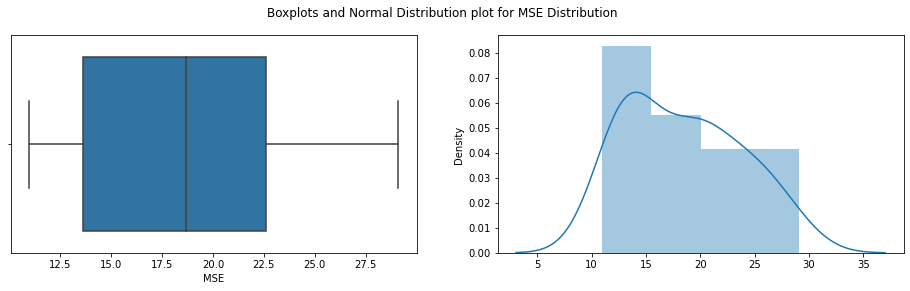

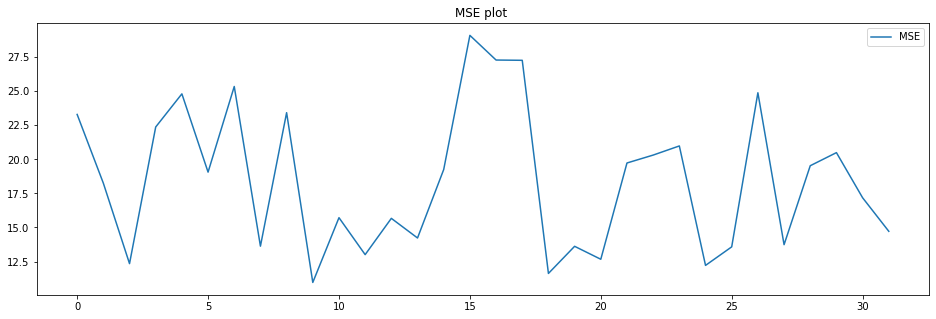


Shapiro_Wilk Test
Statistics=0.937, p=0.0627652854
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.663
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 119
mean=16.797,median=16.41 ,max=30.85,min=9.85,variance=21.22


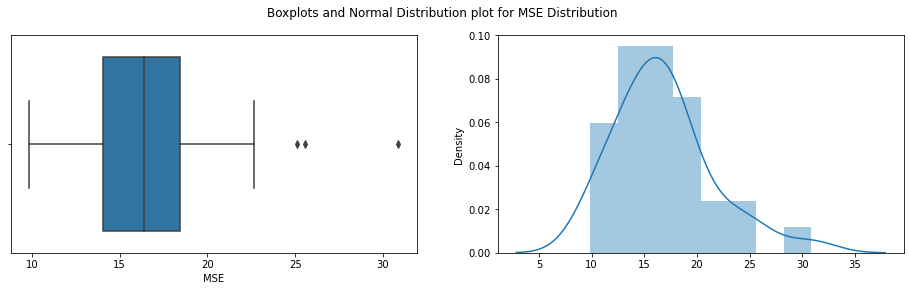

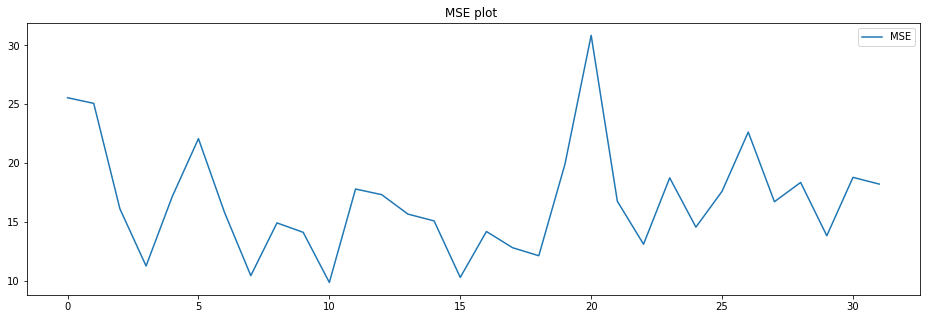


Shapiro_Wilk Test
Statistics=0.934, p=0.0521241054
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.590
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 120
mean=17.983,median=17.975 ,max=29.43,min=9.6,variance=29.994


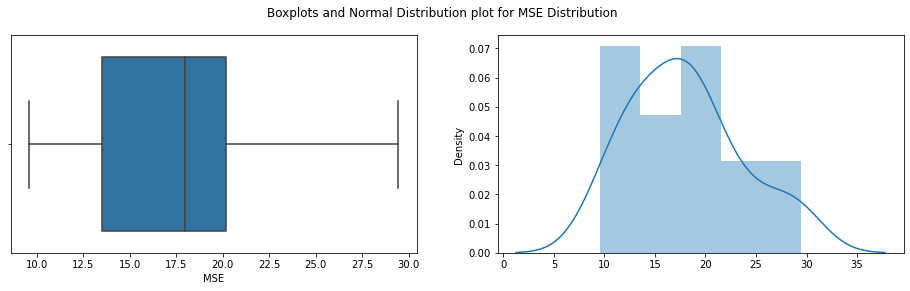

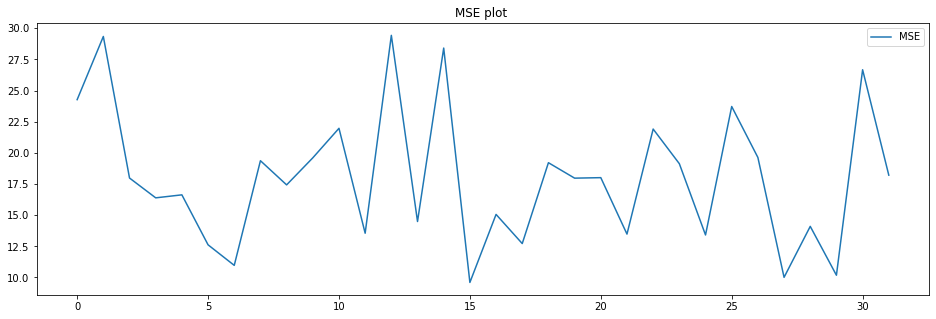


Shapiro_Wilk Test
Statistics=0.948, p=0.1275304556
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.468
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 121
mean=17.505,median=16.645 ,max=26.93,min=6.24,variance=26.098


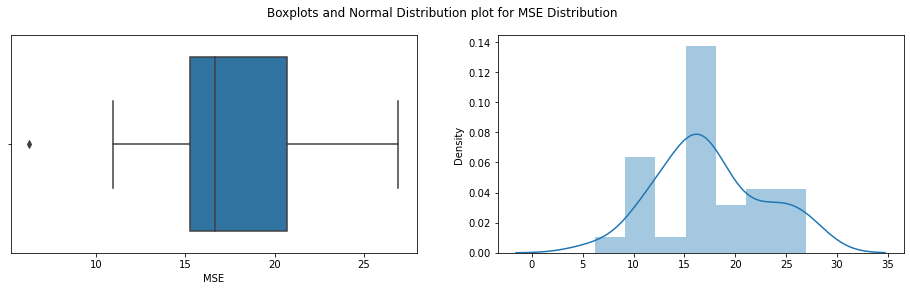

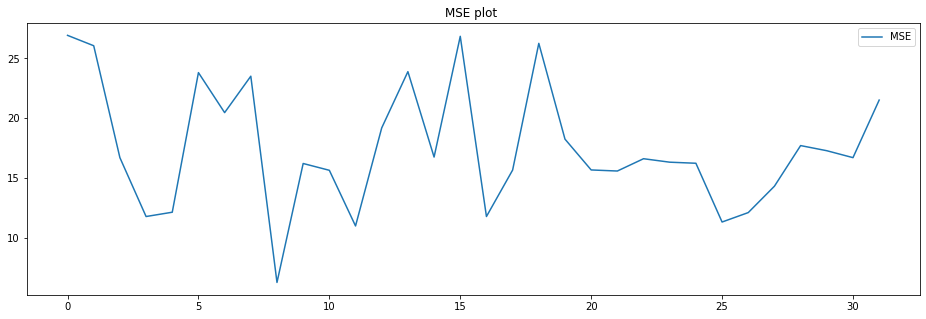


Shapiro_Wilk Test
Statistics=0.945, p=0.1053549573
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.752
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 122
mean=16.402,median=15.455 ,max=25.65,min=10.95,variance=14.638


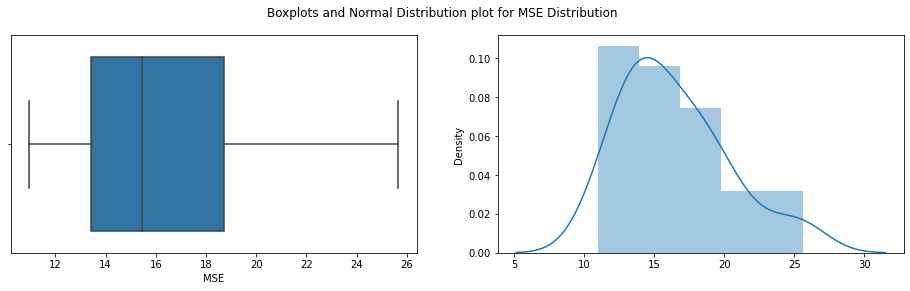

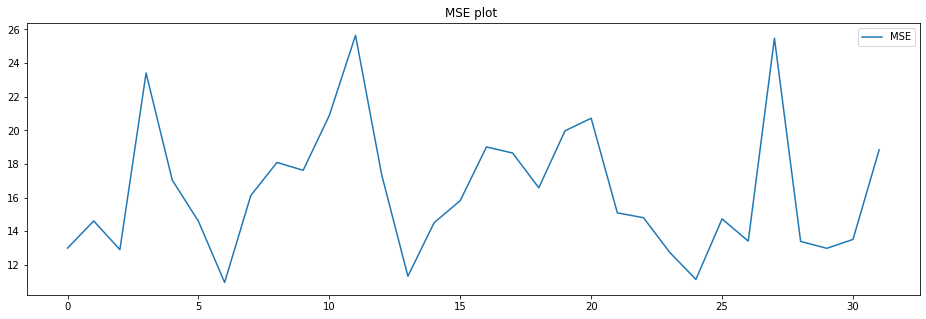


Shapiro_Wilk Test
Statistics=0.932, p=0.0452388339
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.633
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 123
mean=17.136,median=15.575 ,max=29.97,min=8.32,variance=39.832


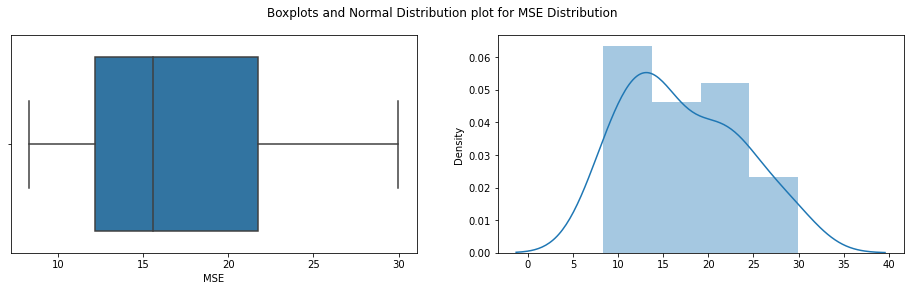

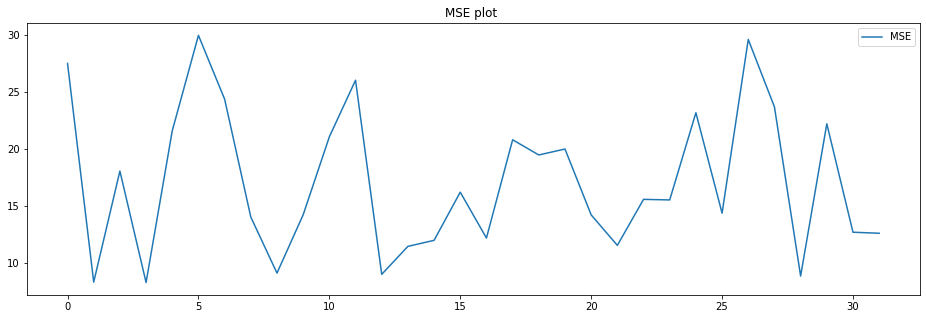


Shapiro_Wilk Test
Statistics=0.943, p=0.0896071270
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.552
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 124
mean=16.108,median=14.725 ,max=27.44,min=8.42,variance=20.886


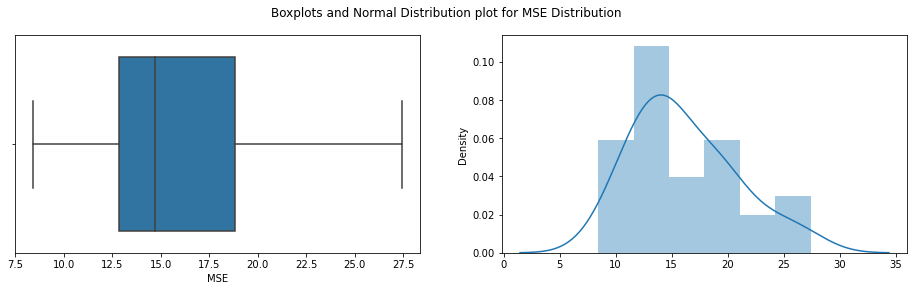

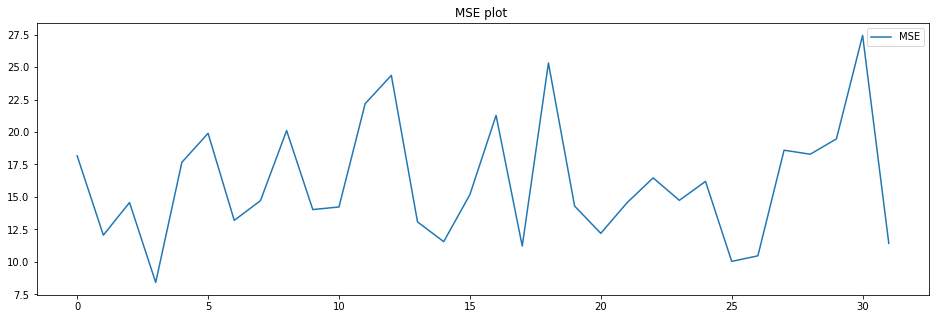


Shapiro_Wilk Test
Statistics=0.957, p=0.2316417843
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.481
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 125
mean=17.736,median=18.04 ,max=26.31,min=9.74,variance=20.32


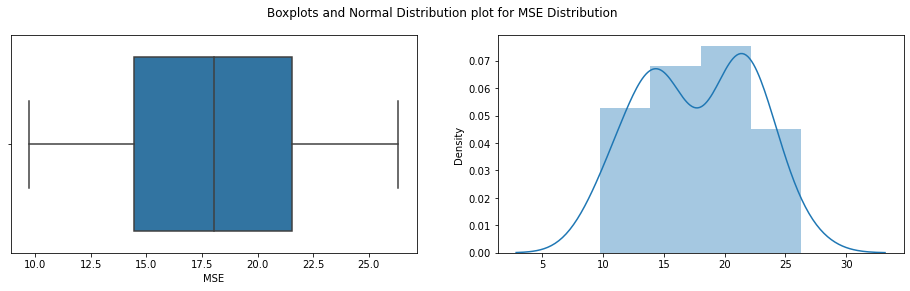

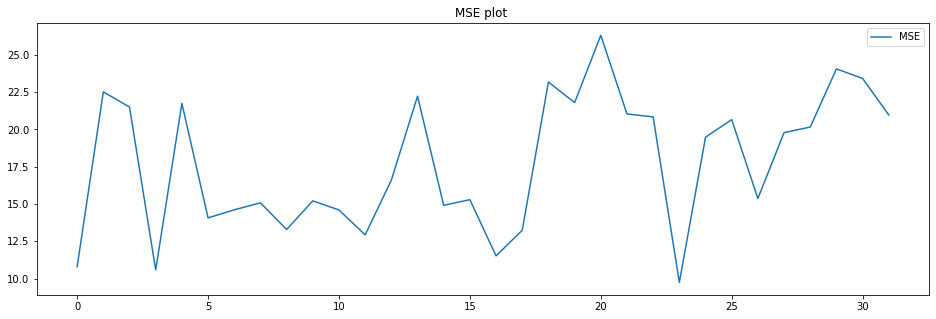


Shapiro_Wilk Test
Statistics=0.940, p=0.0749106407
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.866
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 126
mean=17.813,median=17.435 ,max=28.59,min=10.13,variance=21.238


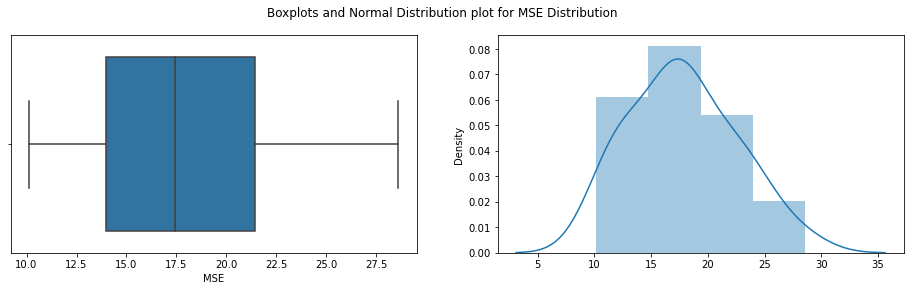

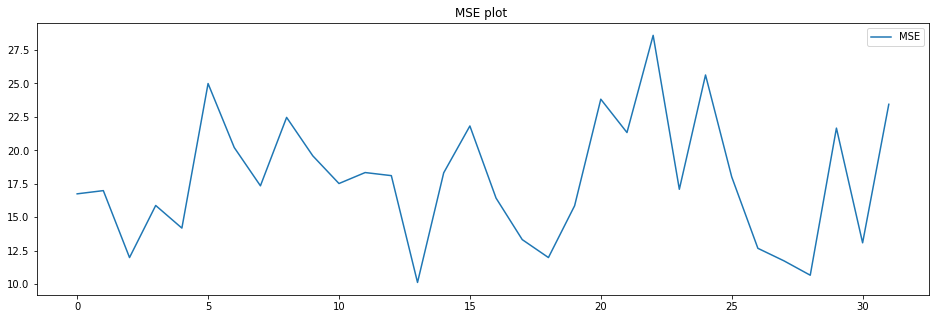


Shapiro_Wilk Test
Statistics=0.973, p=0.5894966125
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.273
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 127
mean=19.027,median=18.605 ,max=30.21,min=9.43,variance=30.684


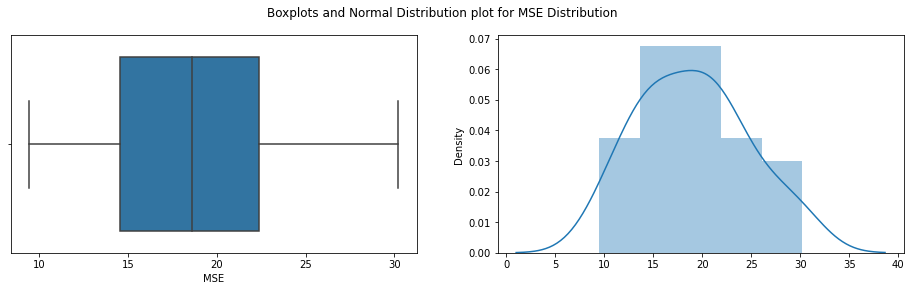

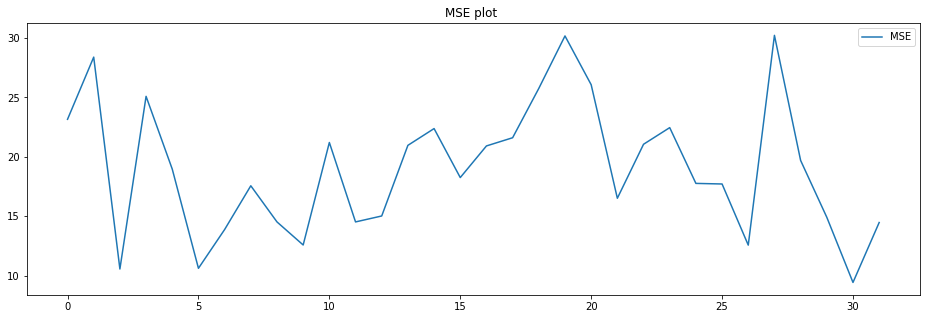


Shapiro_Wilk Test
Statistics=0.971, p=0.5149934292
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.255
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 128
mean=16.418,median=15.585 ,max=28.5,min=8.46,variance=18.611


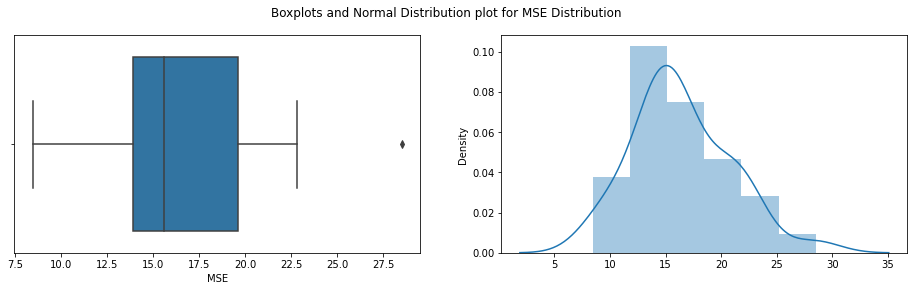

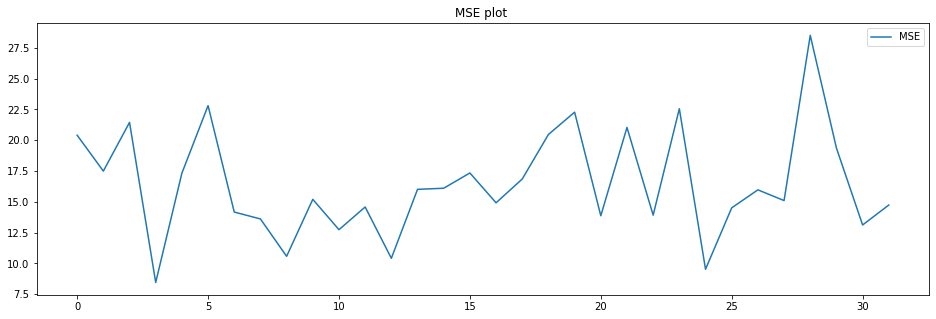


Shapiro_Wilk Test
Statistics=0.963, p=0.3217084408
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.478
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 129
mean=17.777,median=17.215 ,max=26.82,min=10.47,variance=21.416


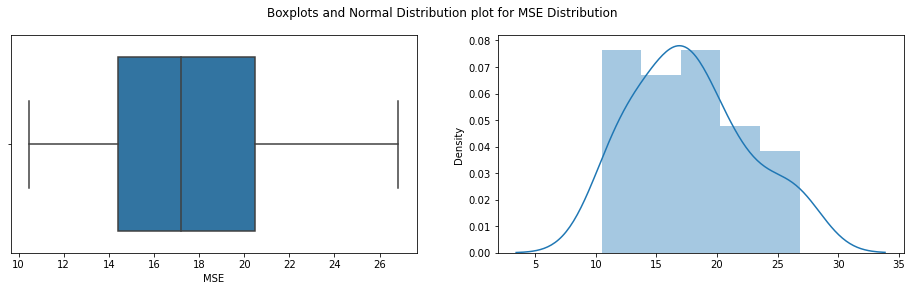

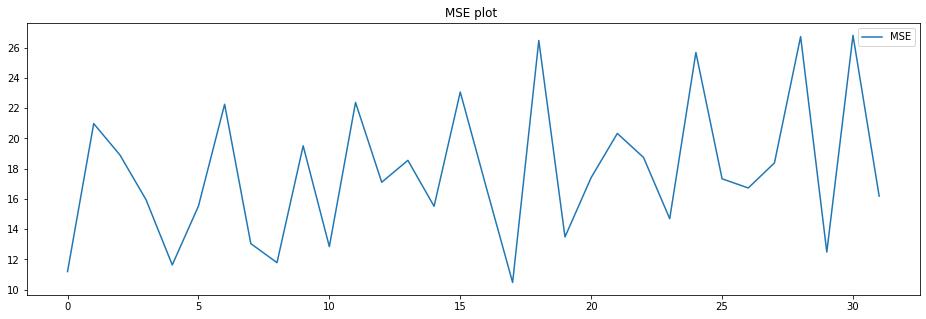


Shapiro_Wilk Test
Statistics=0.951, p=0.1530287117
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.409
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 130
mean=16.893,median=16.95 ,max=31.15,min=7.86,variance=22.434


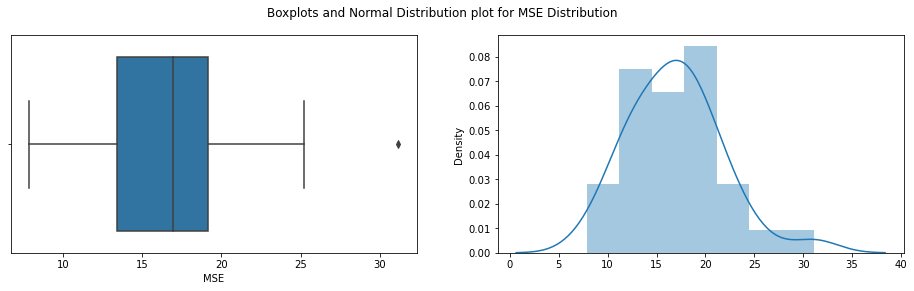

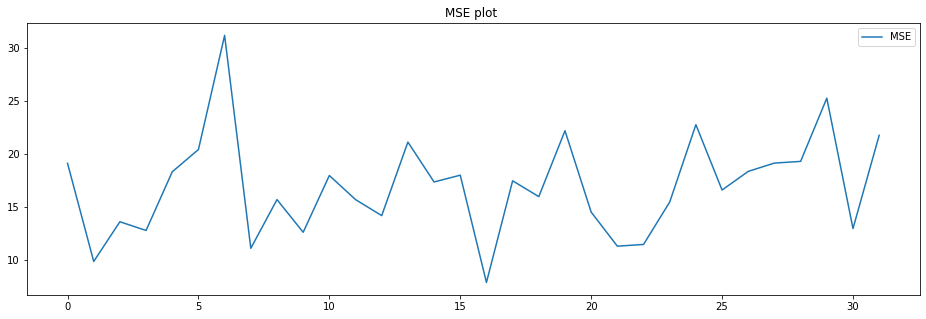


Shapiro_Wilk Test
Statistics=0.971, p=0.5200457573
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.228
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 131
mean=17.116,median=16.07 ,max=31.76,min=7.88,variance=34.007


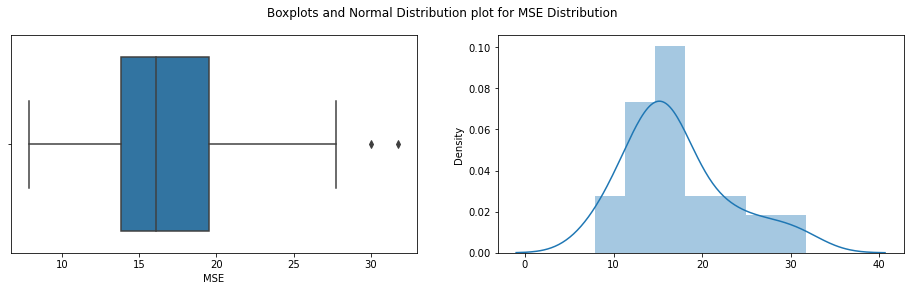

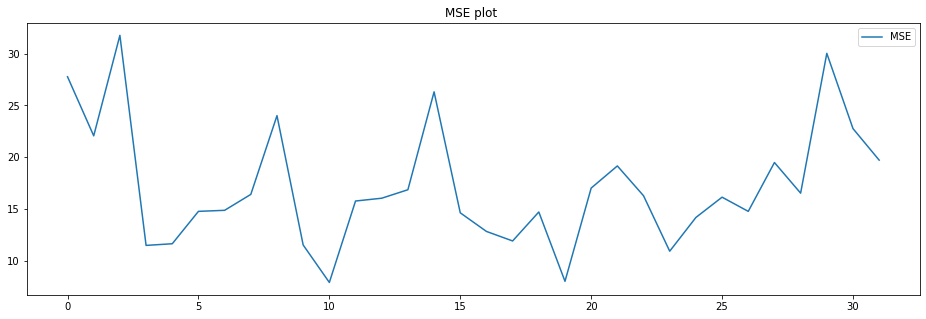


Shapiro_Wilk Test
Statistics=0.926, p=0.0311264433
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.920
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 132
mean=16.694,median=16.135 ,max=31.04,min=8.33,variance=25.039


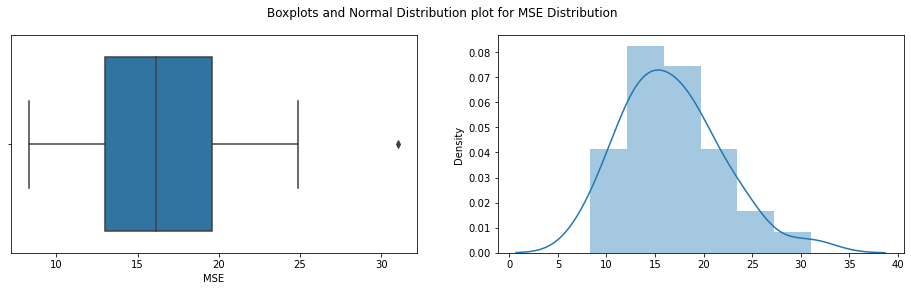

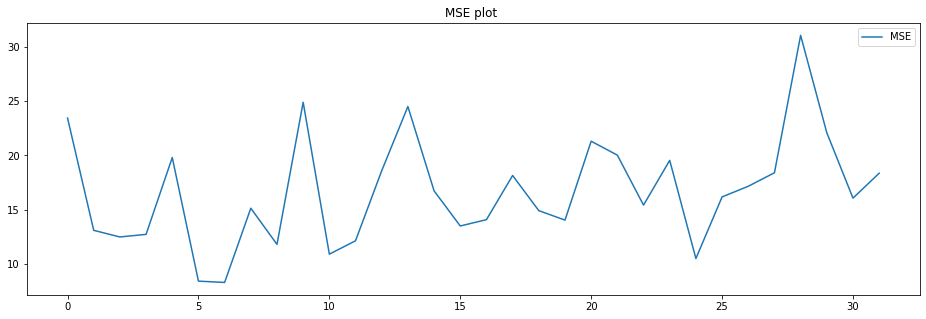


Shapiro_Wilk Test
Statistics=0.968, p=0.4573222101
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.253
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 133
mean=17.471,median=16.955 ,max=29.24,min=6.28,variance=22.988


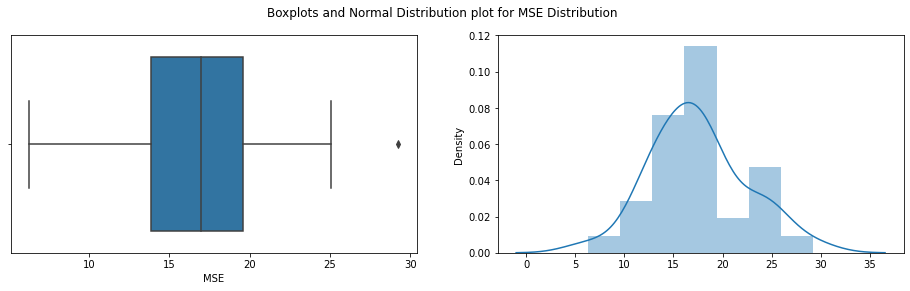

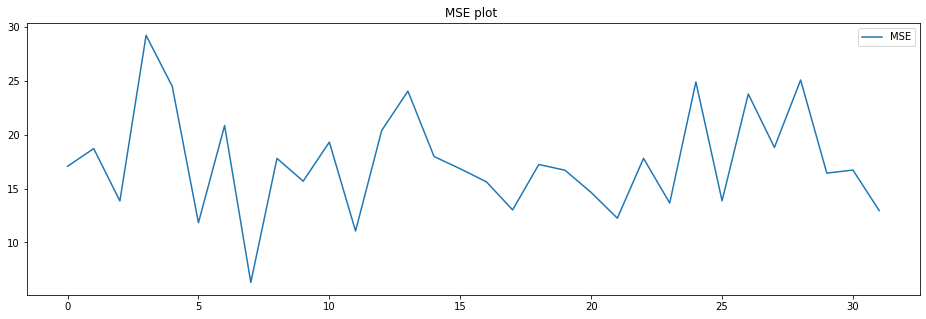


Shapiro_Wilk Test
Statistics=0.971, p=0.5302633643
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.452
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 134
mean=17.31,median=17.985 ,max=25.02,min=9.71,variance=14.505


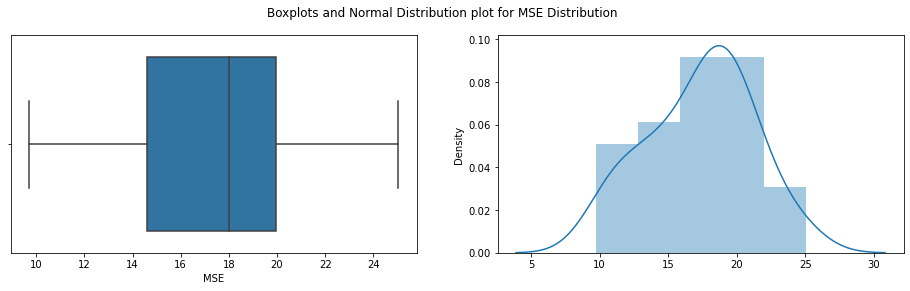

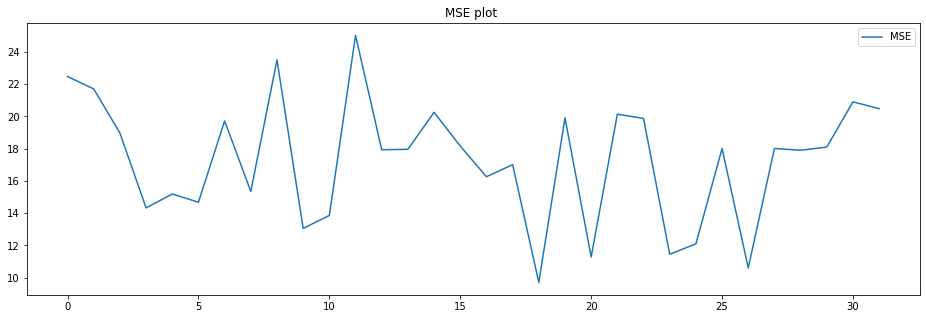


Shapiro_Wilk Test
Statistics=0.973, p=0.5794555545
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.374
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 135
mean=17.884,median=18.035 ,max=28.86,min=6.44,variance=30.806


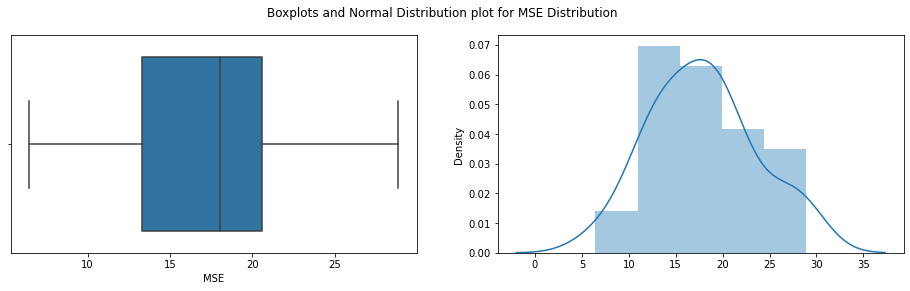

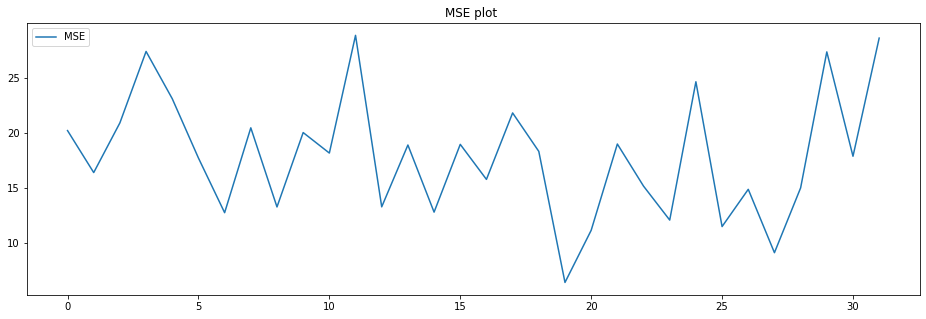


Shapiro_Wilk Test
Statistics=0.973, p=0.5899965763
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.290
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 136
mean=16.964,median=16.2 ,max=31.4,min=10.27,variance=23.04


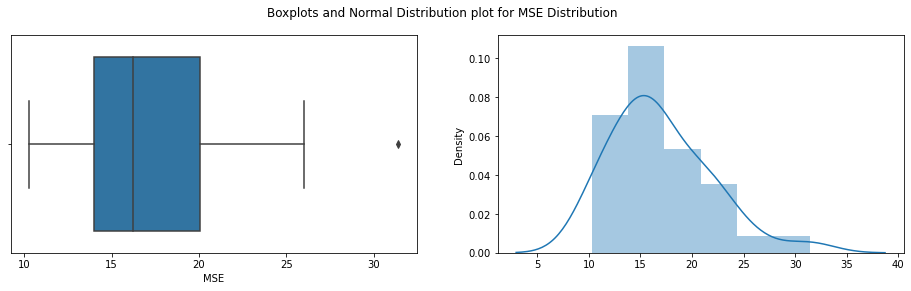

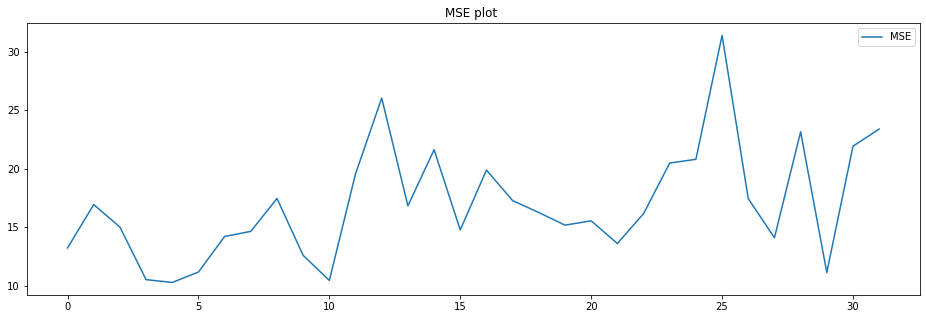


Shapiro_Wilk Test
Statistics=0.940, p=0.0740528032
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.490
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 137
mean=16.446,median=16.535 ,max=25.62,min=6.85,variance=19.702


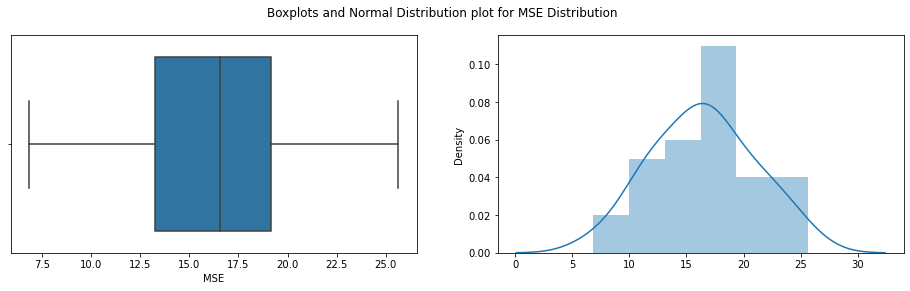

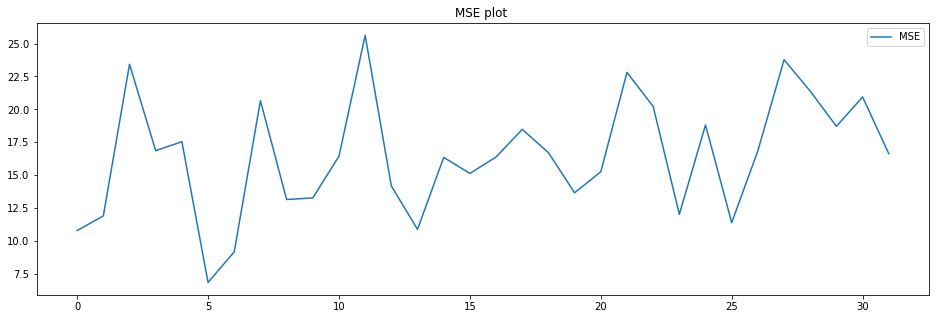


Shapiro_Wilk Test
Statistics=0.988, p=0.9715106487
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.168
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 138
mean=17.092,median=17.78 ,max=26.93,min=9.74,variance=24.275


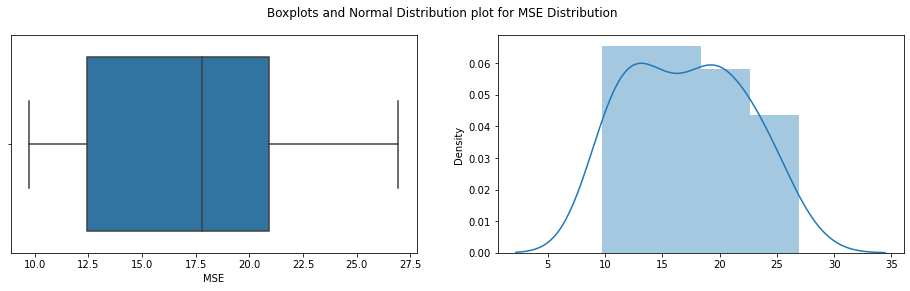

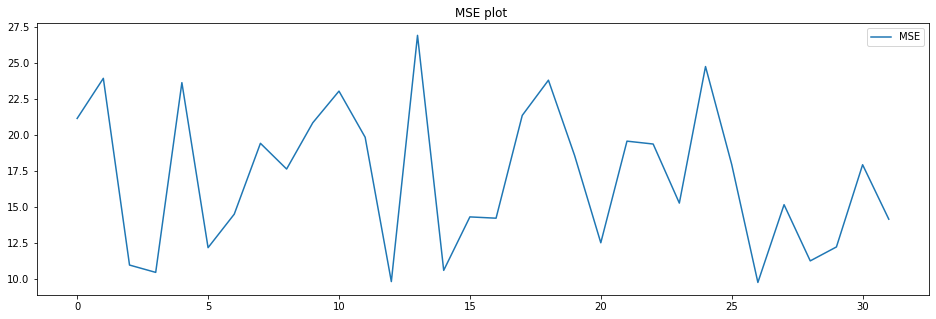


Shapiro_Wilk Test
Statistics=0.950, p=0.1397819966
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.498
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 139
mean=16.179,median=14.645 ,max=36.52,min=8.8,variance=33.574


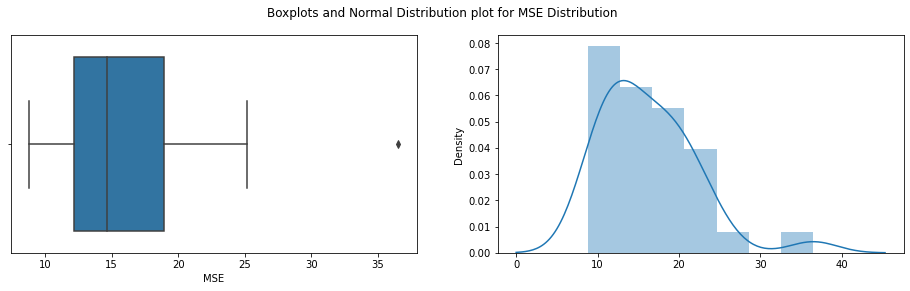

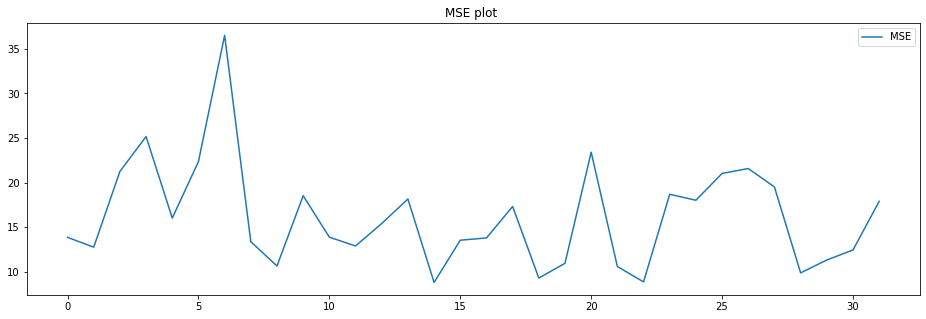


Shapiro_Wilk Test
Statistics=0.899, p=0.0057428749
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.660
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 140
mean=17.65,median=17.32 ,max=25.54,min=11.74,variance=14.053


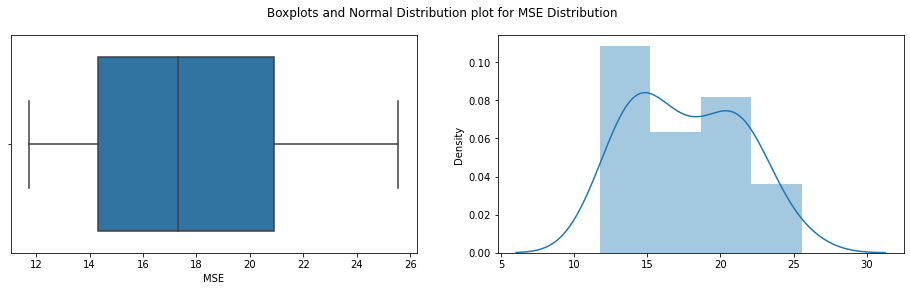

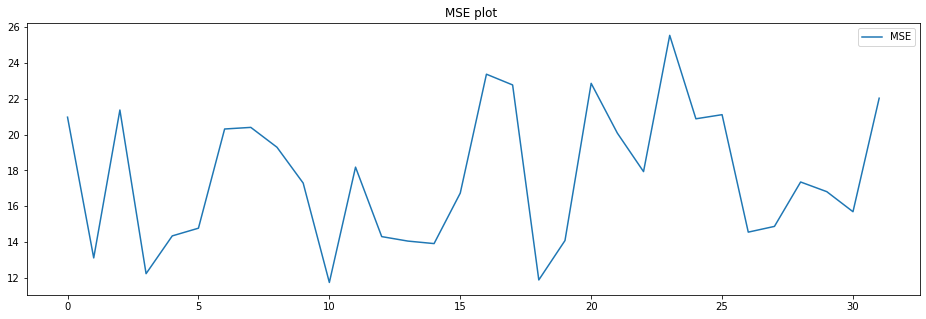


Shapiro_Wilk Test
Statistics=0.953, p=0.1796310097
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.550
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 141
mean=19.072,median=19.075 ,max=29.16,min=9.02,variance=32.992


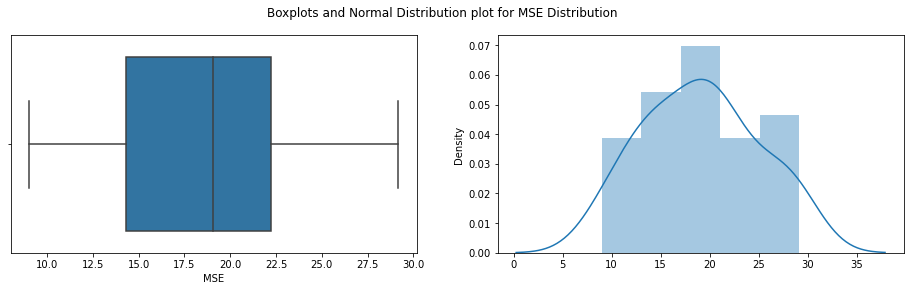

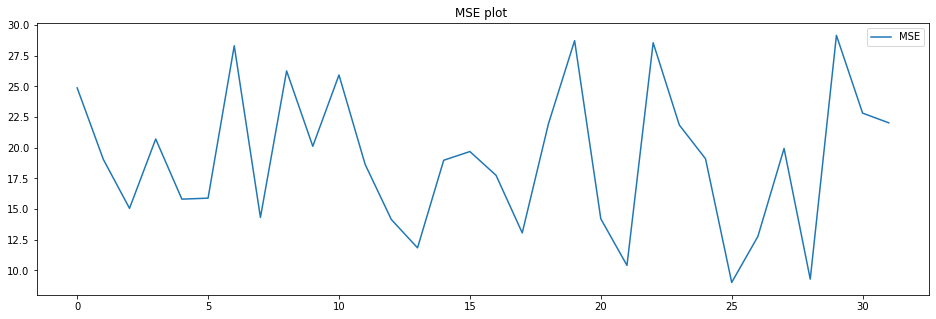


Shapiro_Wilk Test
Statistics=0.964, p=0.3433067203
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.289
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 142
mean=18.302,median=18.5 ,max=24.13,min=7.77,variance=12.499


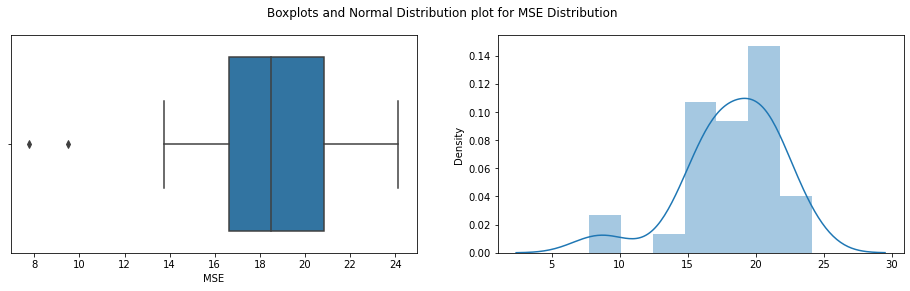

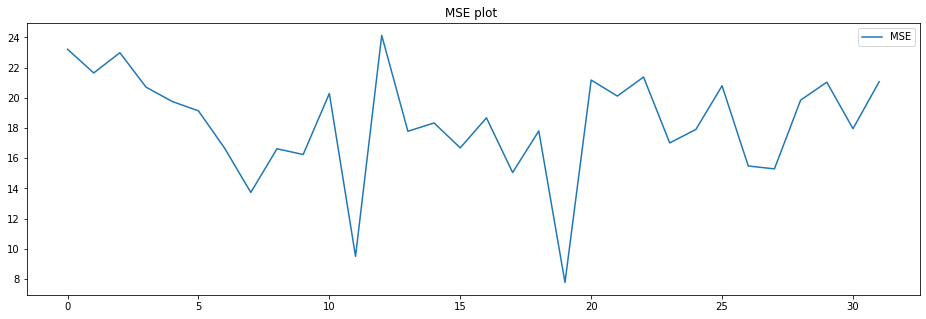


Shapiro_Wilk Test
Statistics=0.928, p=0.0347766802
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.611
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 143
mean=17.338,median=16.775 ,max=29.02,min=9.46,variance=23.815


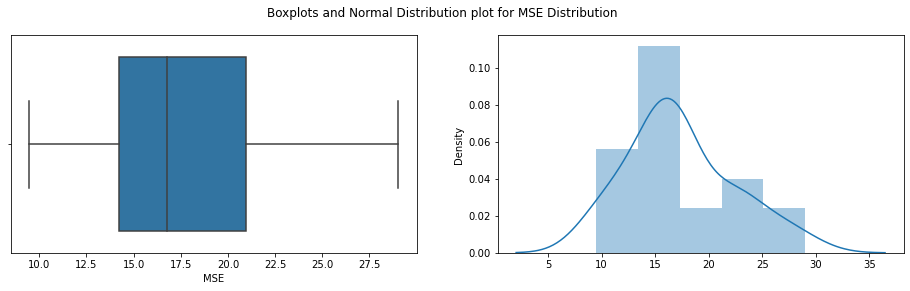

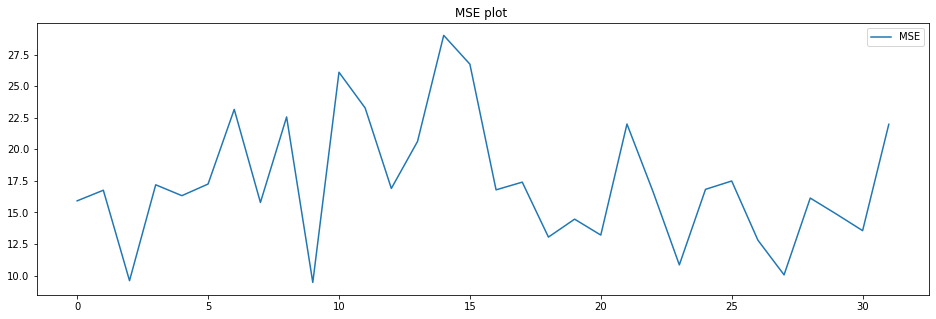


Shapiro_Wilk Test
Statistics=0.947, p=0.1179739982
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.708
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 144
mean=15.482,median=14.96 ,max=24.64,min=7.71,variance=15.012


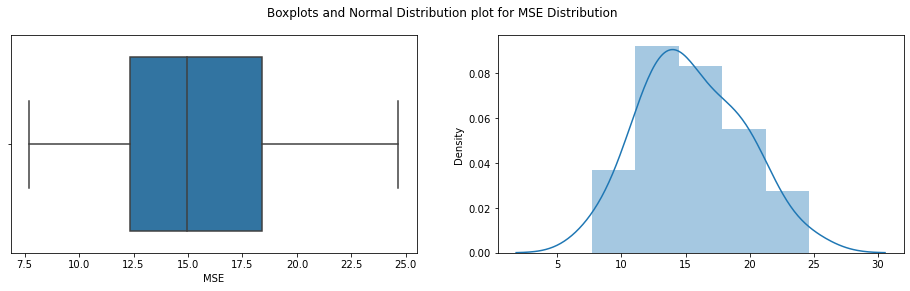

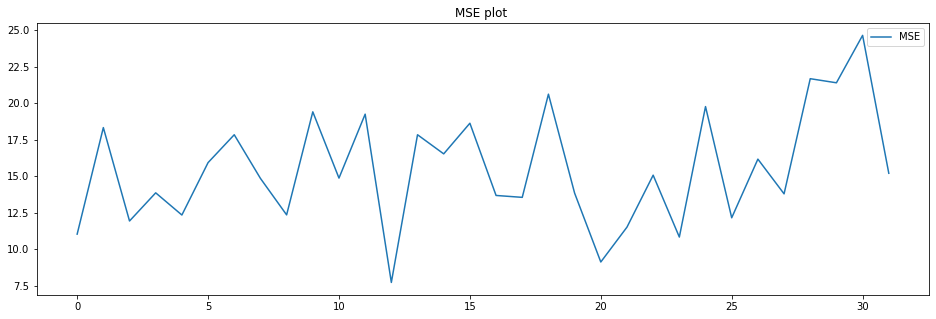


Shapiro_Wilk Test
Statistics=0.985, p=0.9275426865
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.228
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 145
mean=16.772,median=17.14 ,max=26.22,min=7.57,variance=23.886


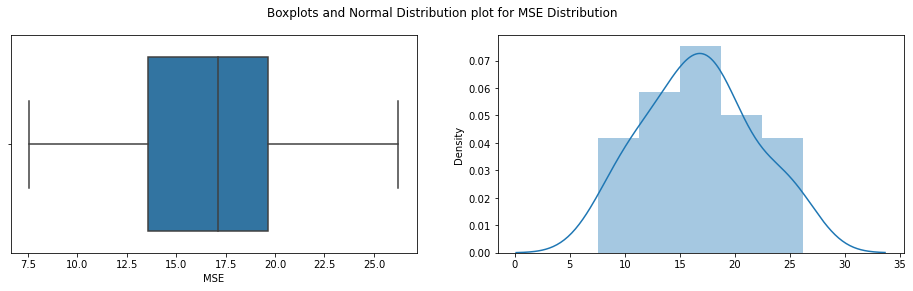

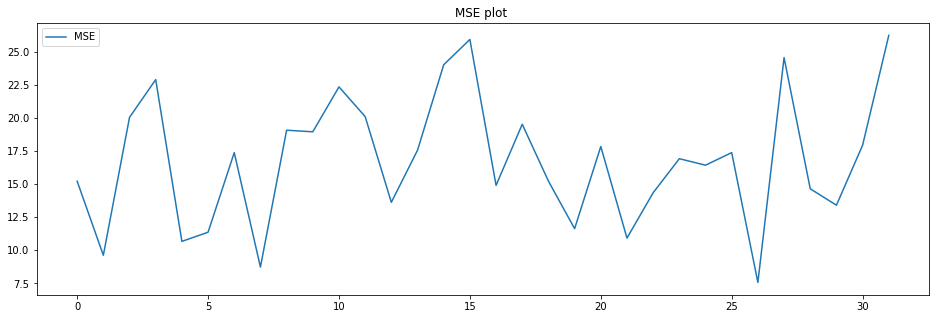


Shapiro_Wilk Test
Statistics=0.978, p=0.7359127998
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.190
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 146
mean=17.177,median=16.01 ,max=28.37,min=8.59,variance=25.63


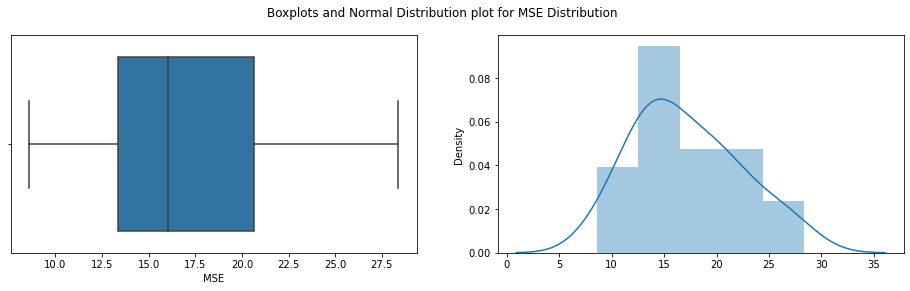

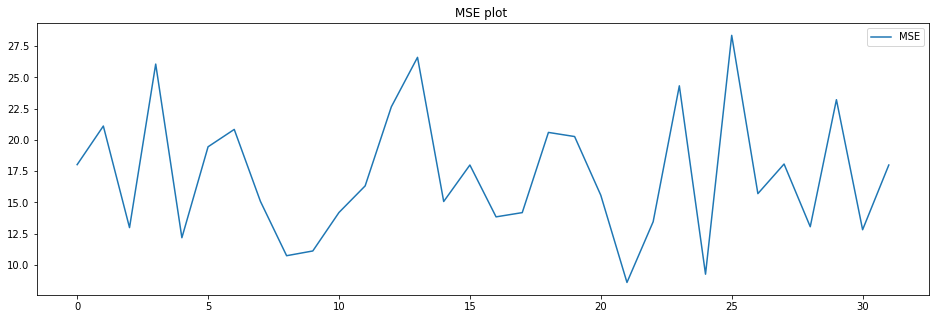


Shapiro_Wilk Test
Statistics=0.968, p=0.4407838881
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.355
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 147
mean=16.147,median=16.06 ,max=25.37,min=10.14,variance=18.187


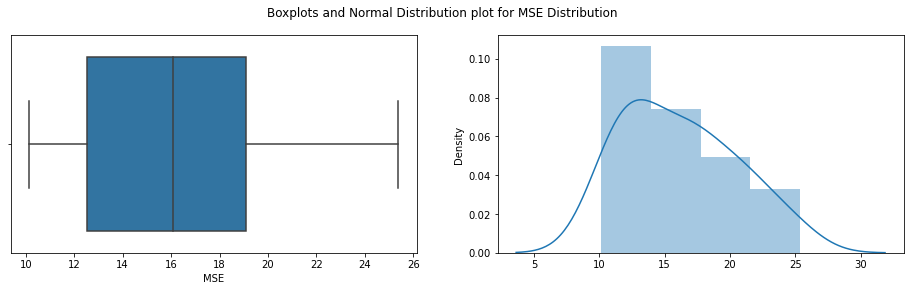

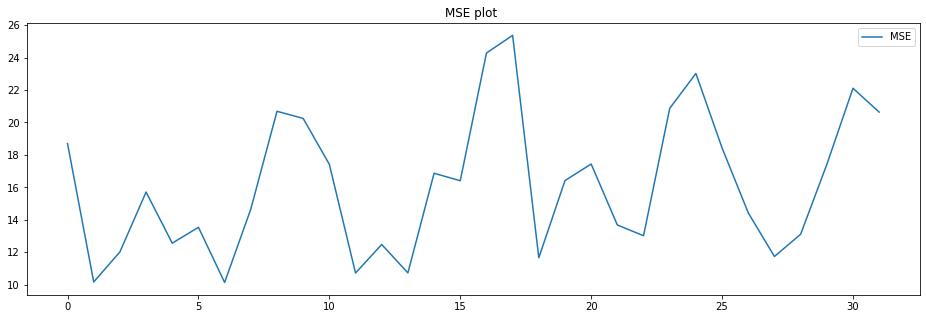


Shapiro_Wilk Test
Statistics=0.949, p=0.1322735697
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.485
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 148
mean=18.683,median=18.715 ,max=28.33,min=7.63,variance=28.096


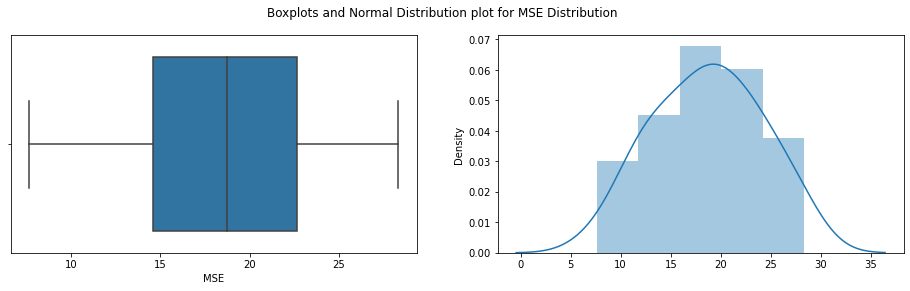

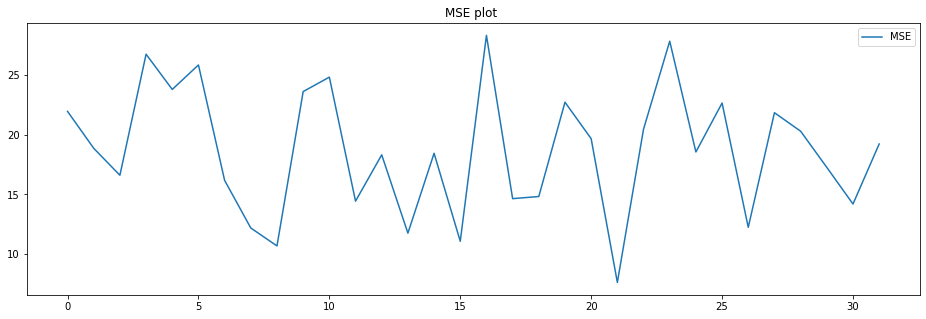


Shapiro_Wilk Test
Statistics=0.981, p=0.8348668218
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.168
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 149
mean=16.228,median=16.215 ,max=25.84,min=8.33,variance=17.253


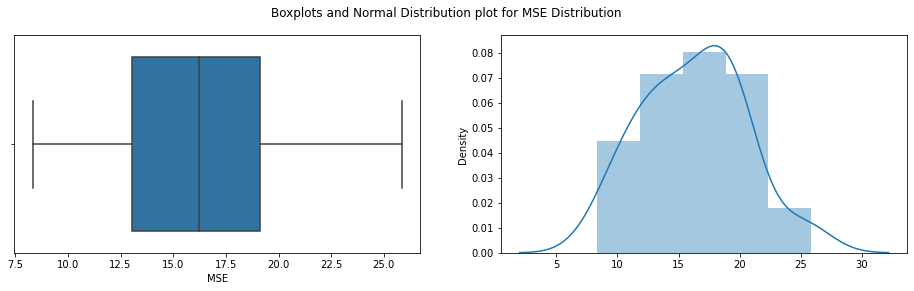

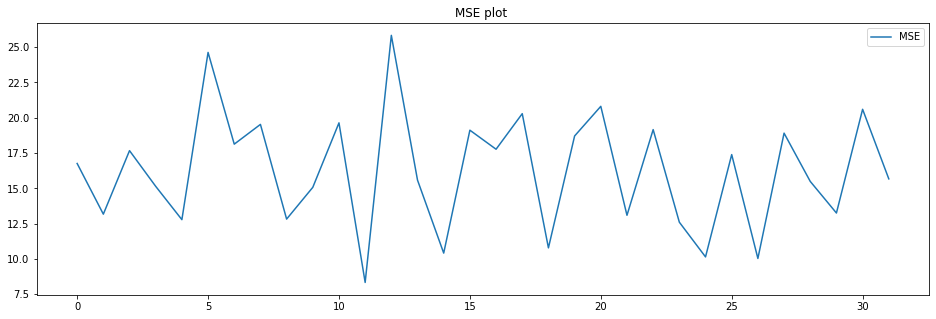


Shapiro_Wilk Test
Statistics=0.974, p=0.6169677377
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.310
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 150
mean=14.843,median=13.51 ,max=29.4,min=7.07,variance=23.414


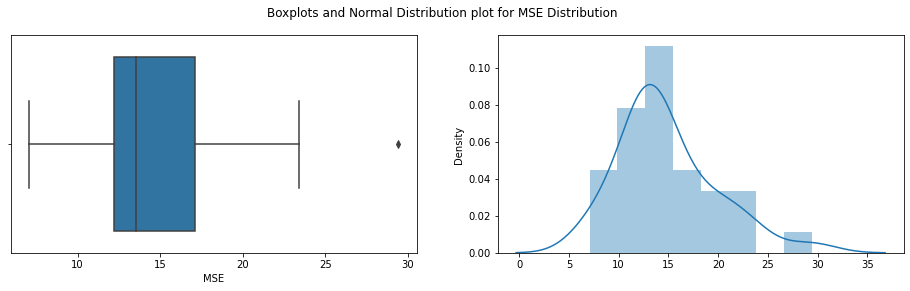

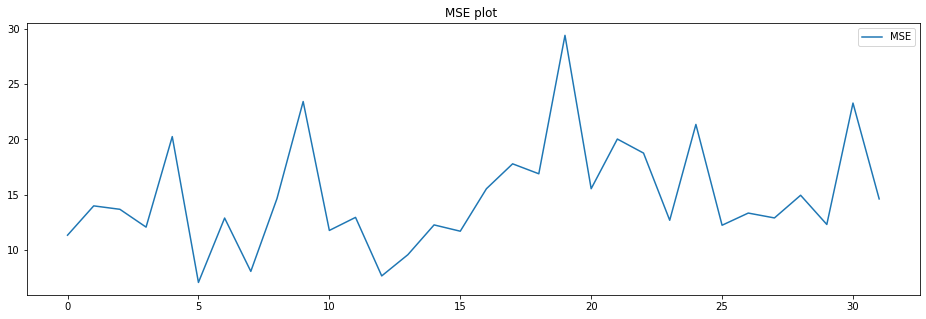


Shapiro_Wilk Test
Statistics=0.926, p=0.0295555219
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.901
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 151
mean=16.251,median=15.975 ,max=30.55,min=7.19,variance=20.874


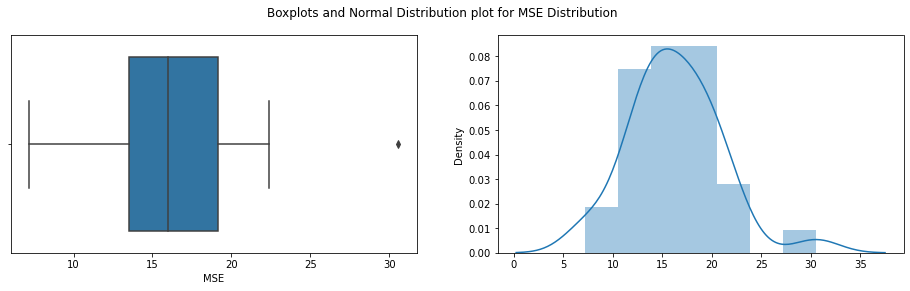

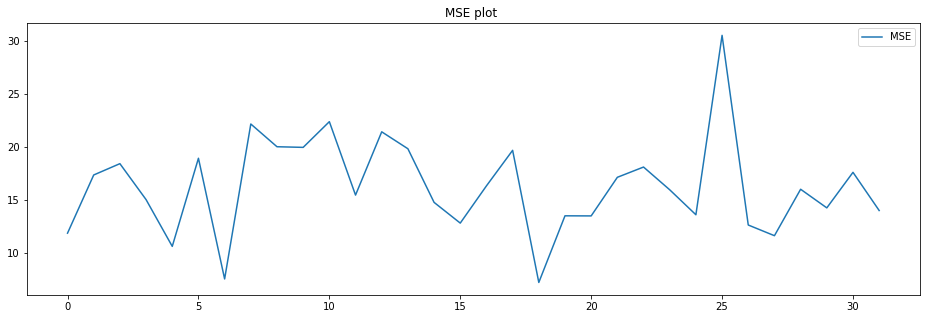


Shapiro_Wilk Test
Statistics=0.962, p=0.3100418150
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.282
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 152
mean=16.789,median=16.275 ,max=29.14,min=6.65,variance=28.332


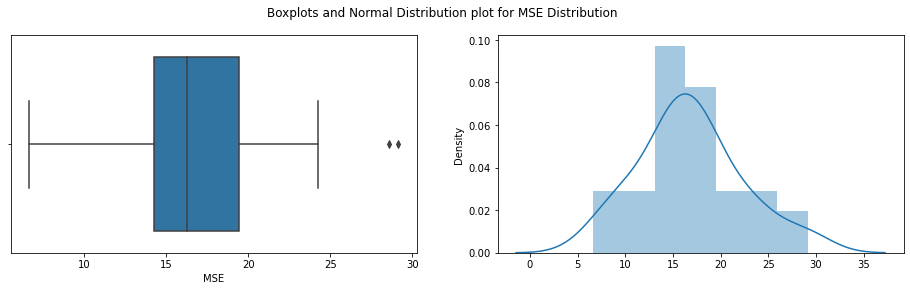

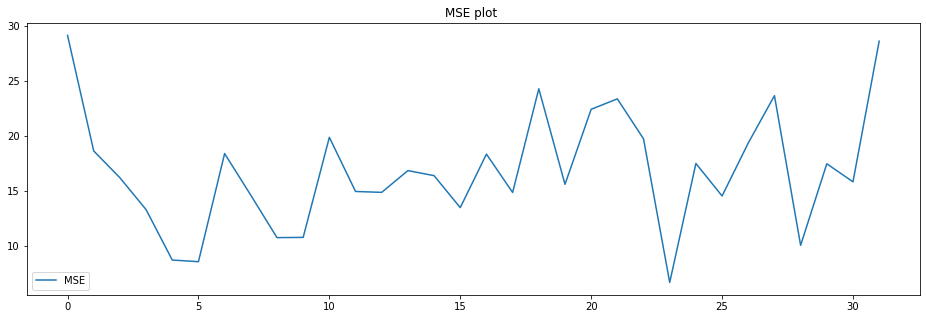


Shapiro_Wilk Test
Statistics=0.972, p=0.5420979857
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.329
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 153
mean=16.906,median=16.045 ,max=34.04,min=8.02,variance=26.23


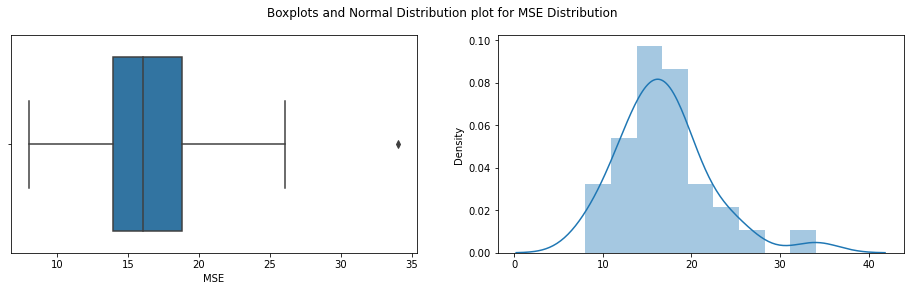

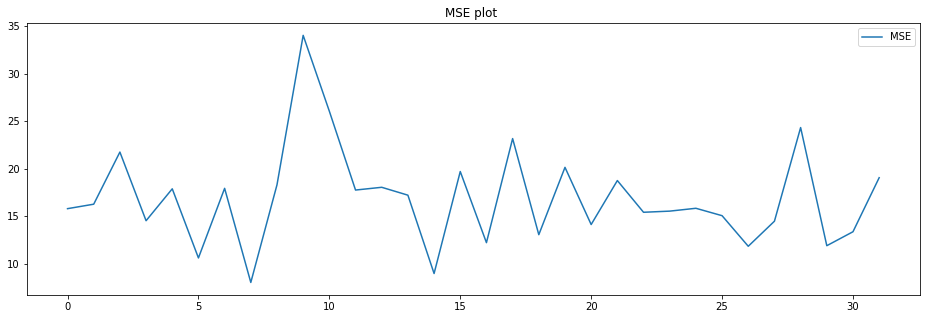


Shapiro_Wilk Test
Statistics=0.934, p=0.0522780977
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.535
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 154
mean=17.785,median=17.155 ,max=33.97,min=8.6,variance=30.073


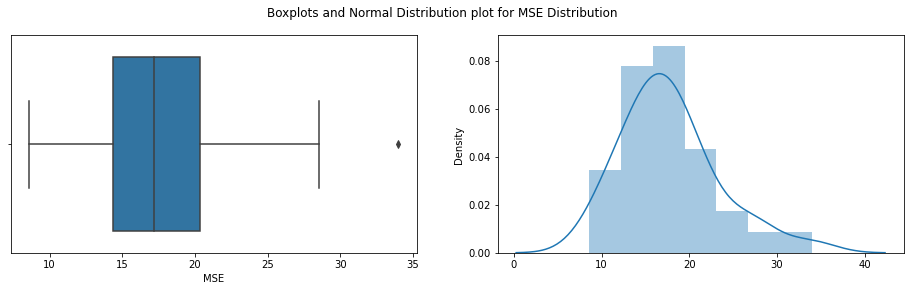

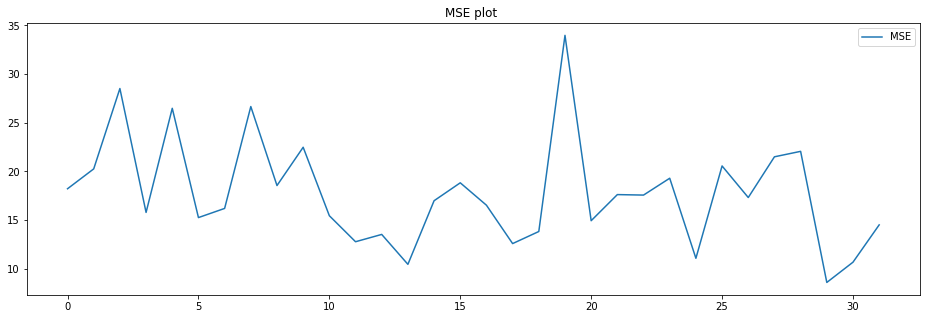


Shapiro_Wilk Test
Statistics=0.946, p=0.1122460887
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.528
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 155
mean=15.652,median=15.845 ,max=29.49,min=6.31,variance=30.983


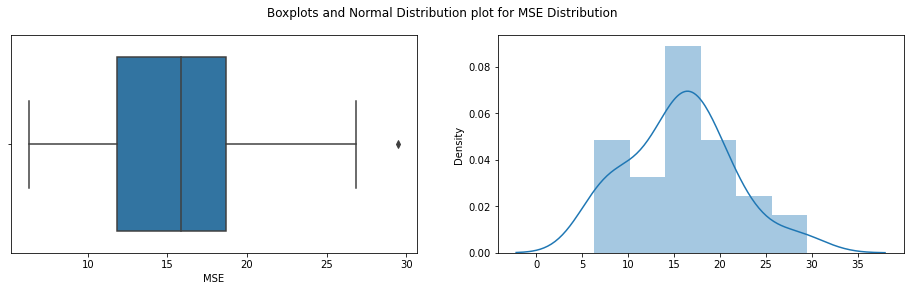

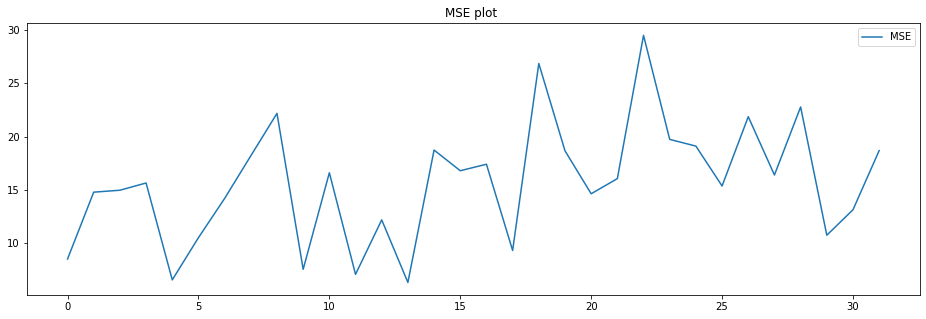


Shapiro_Wilk Test
Statistics=0.969, p=0.4850395620
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.297
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 156
mean=16.057,median=15.845 ,max=24.77,min=8.37,variance=16.163


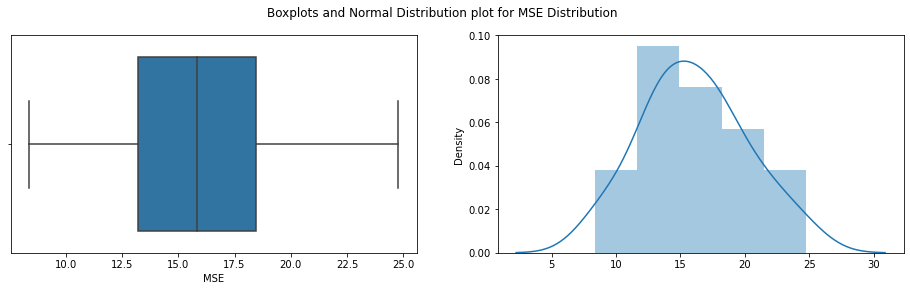

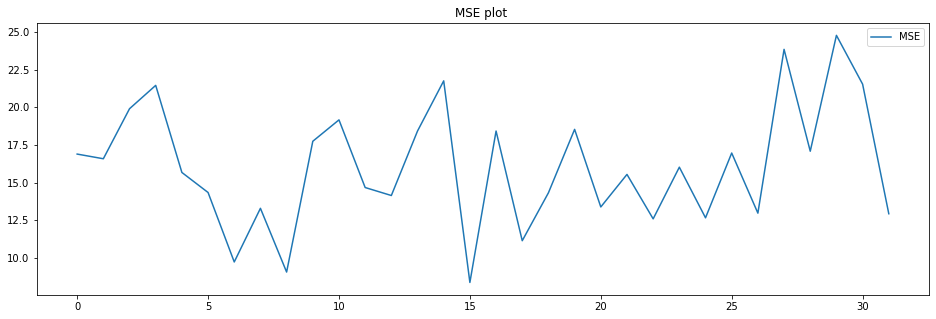


Shapiro_Wilk Test
Statistics=0.983, p=0.8864991069
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.178
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 157
mean=16.096,median=15.75 ,max=25.12,min=9.7,variance=15.415


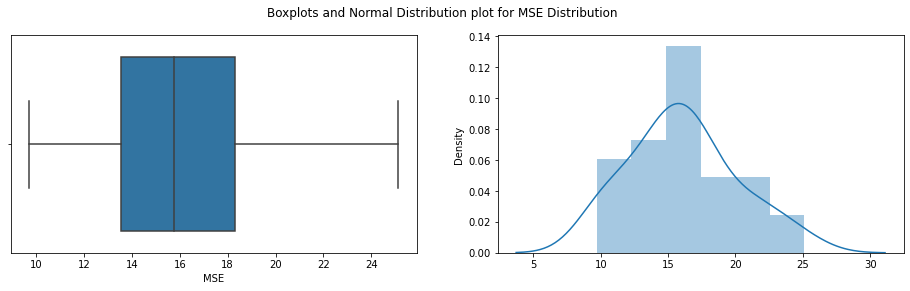

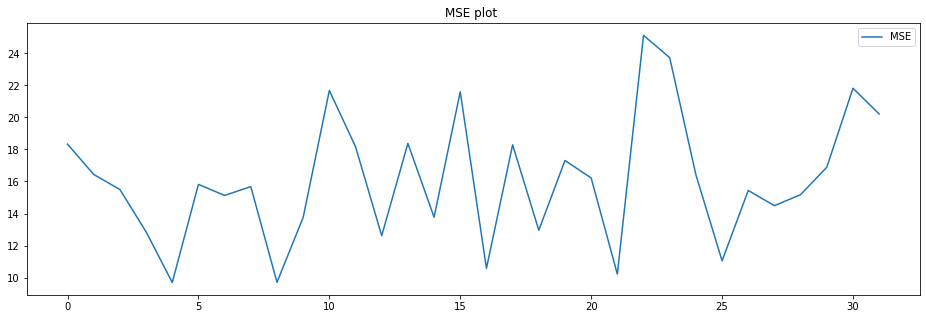


Shapiro_Wilk Test
Statistics=0.968, p=0.4559878111
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.301
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 158
mean=17.032,median=16.17 ,max=27.15,min=7.48,variance=18.926


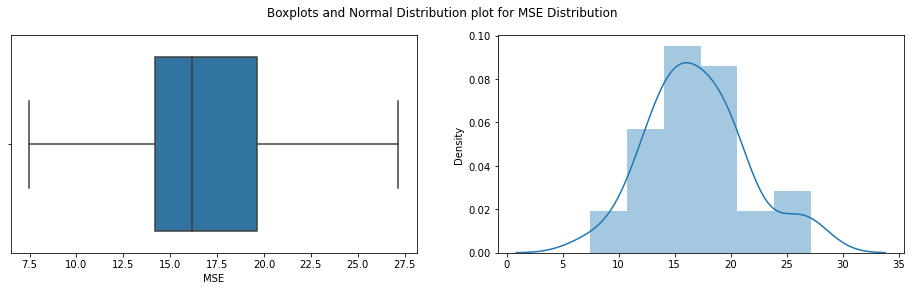

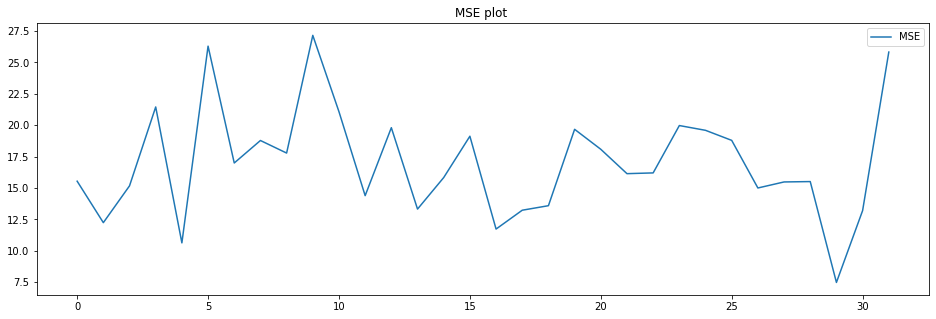


Shapiro_Wilk Test
Statistics=0.966, p=0.4060530365
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.406
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 159
mean=16.533,median=16.345 ,max=26.91,min=6.16,variance=18.31


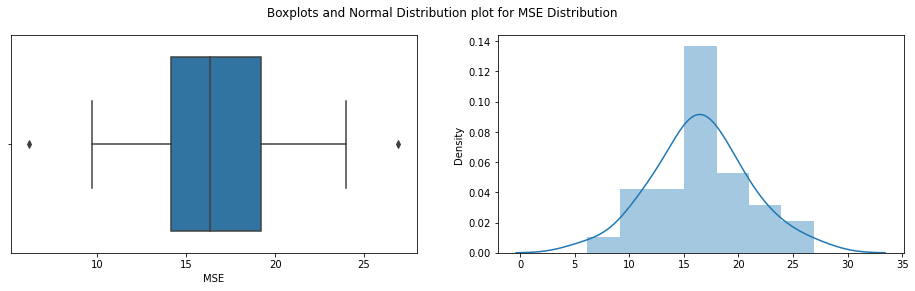

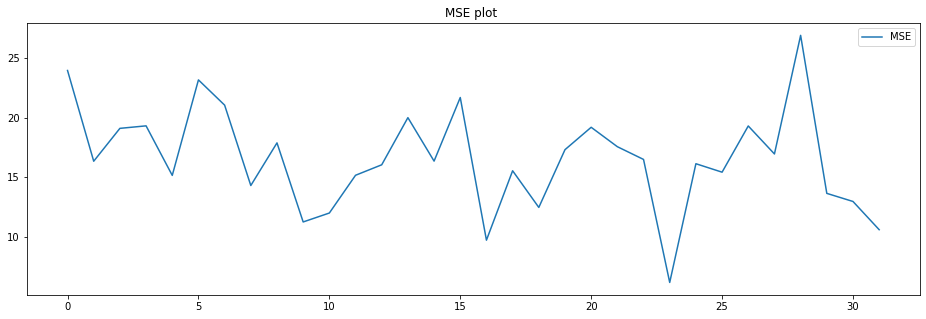


Shapiro_Wilk Test
Statistics=0.991, p=0.9940956235
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.190
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 160
mean=16.573,median=16.555 ,max=28.92,min=8.06,variance=23.059


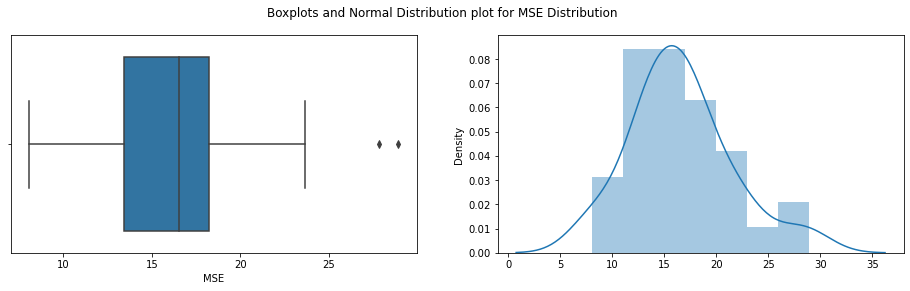

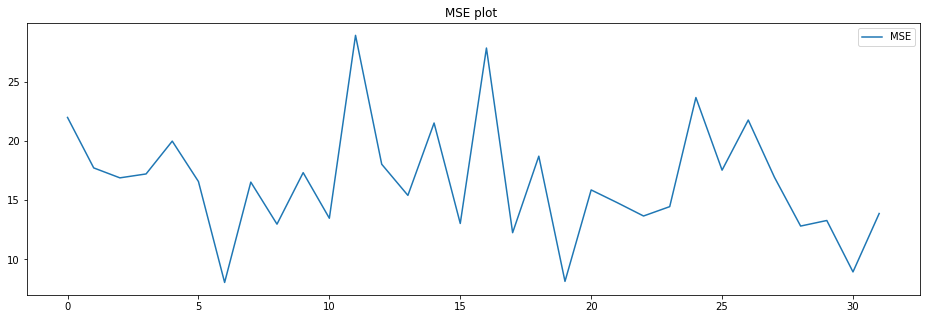


Shapiro_Wilk Test
Statistics=0.952, p=0.1618916541
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.532
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 161
mean=18.048,median=17.735 ,max=28.66,min=9.73,variance=25.275


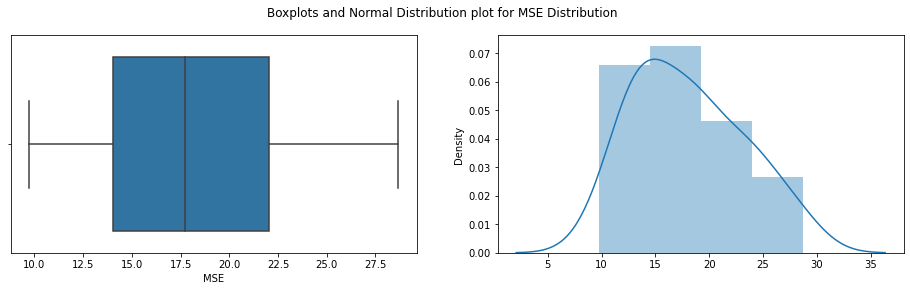

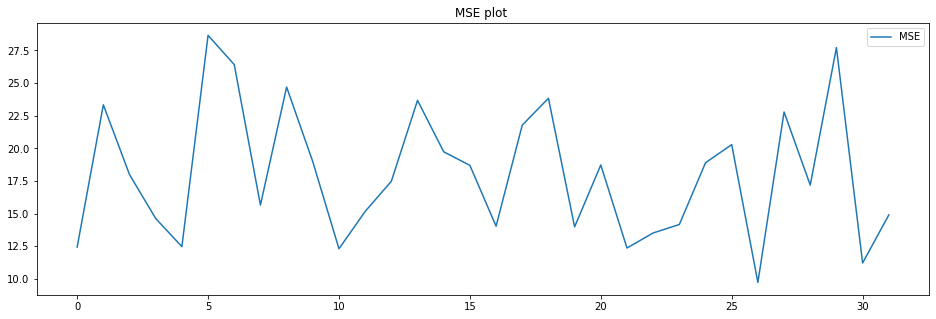


Shapiro_Wilk Test
Statistics=0.956, p=0.2108140141
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.481
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 162
mean=16.151,median=15.66 ,max=26.67,min=8.32,variance=16.939


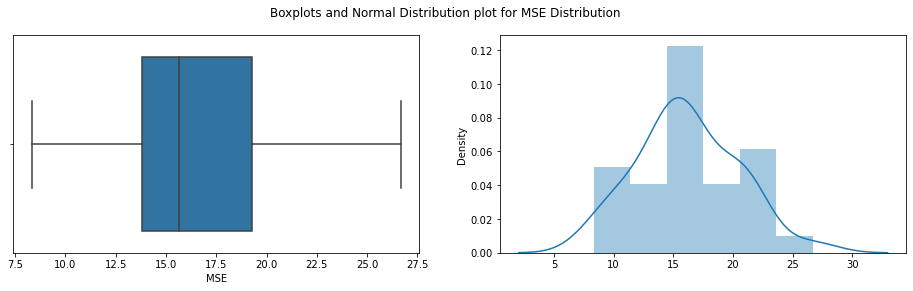

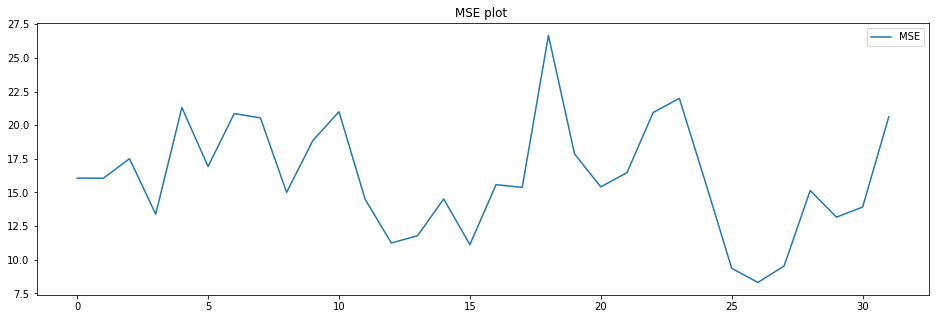


Shapiro_Wilk Test
Statistics=0.973, p=0.5932523012
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.350
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 163
mean=15.332,median=15.04 ,max=23.78,min=9.12,variance=16.824


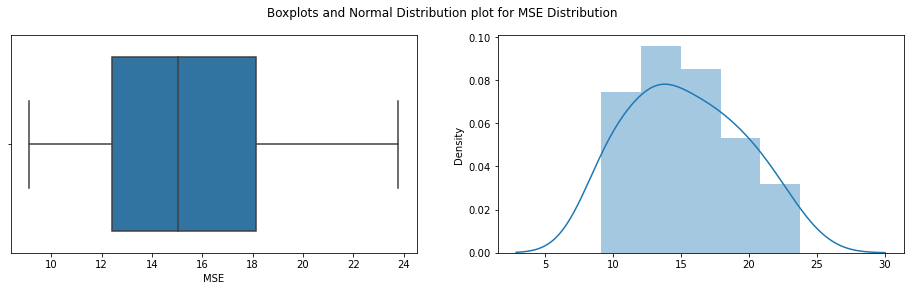

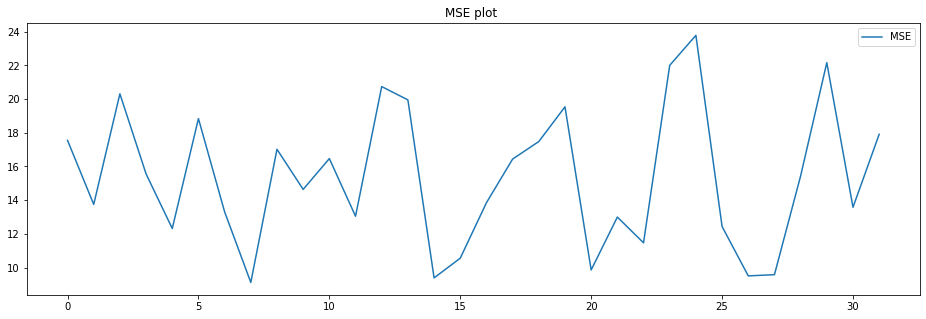


Shapiro_Wilk Test
Statistics=0.961, p=0.2921648324
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.318
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 164
mean=17.074,median=18.255 ,max=24.66,min=4.81,variance=24.065


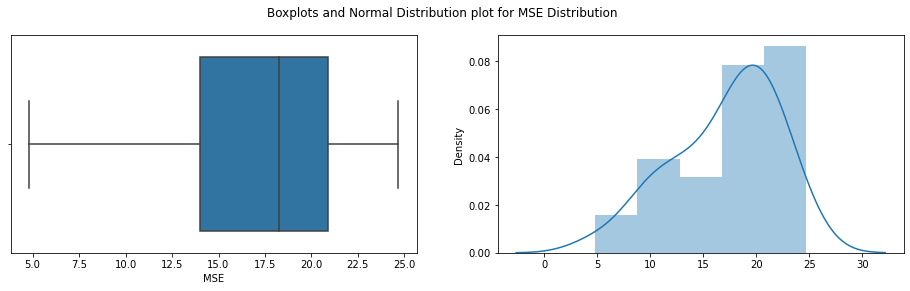

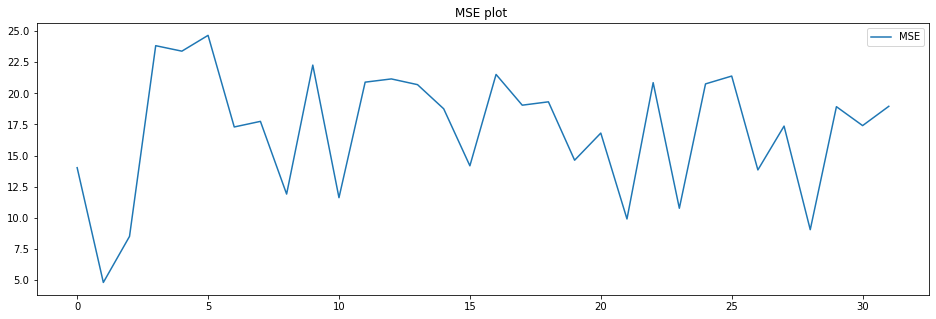


Shapiro_Wilk Test
Statistics=0.946, p=0.1142188981
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.650
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 165
mean=16.658,median=15.415 ,max=29.63,min=7.46,variance=30.177


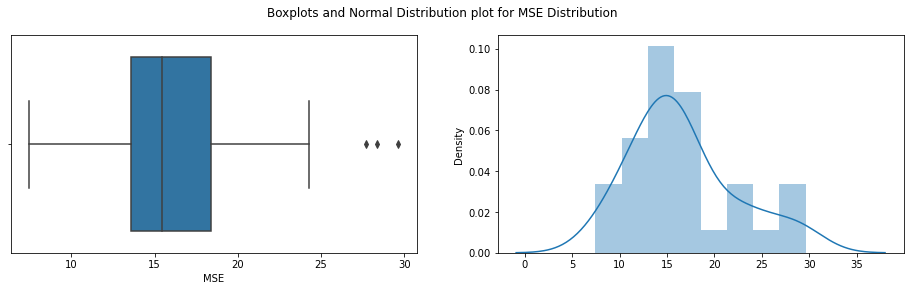

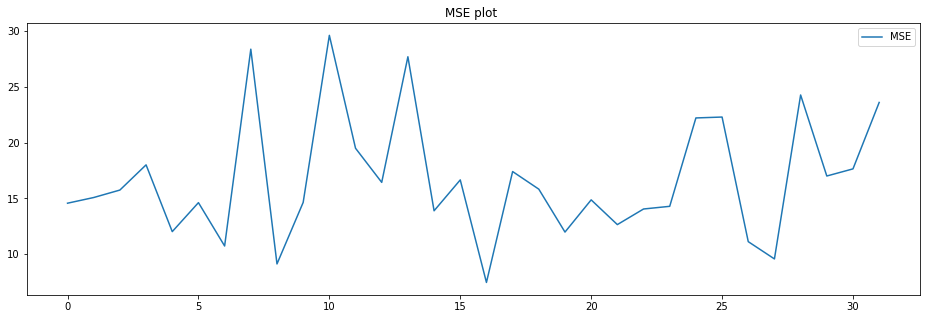


Shapiro_Wilk Test
Statistics=0.935, p=0.0529641323
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.812
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 166
mean=16.865,median=16.025 ,max=25.38,min=11.1,variance=18.584


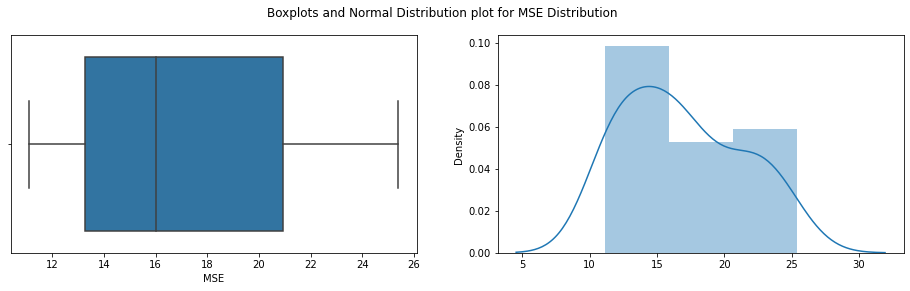

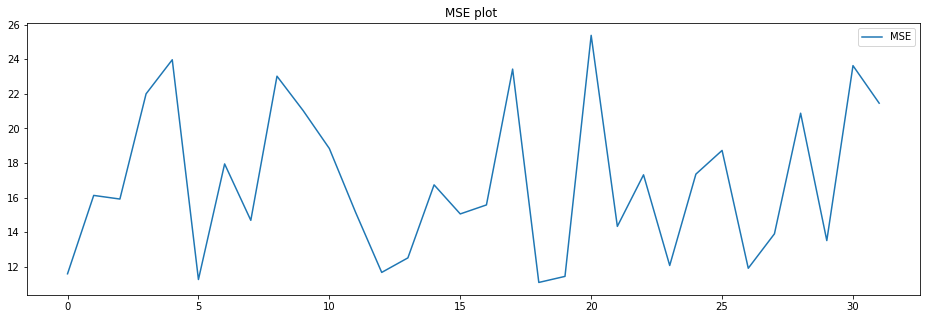


Shapiro_Wilk Test
Statistics=0.930, p=0.0395811163
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.659
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 167
mean=17.008,median=17.21 ,max=26.29,min=7.81,variance=21.232


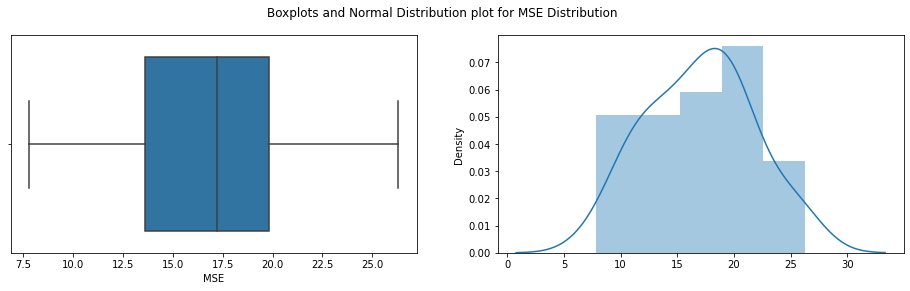

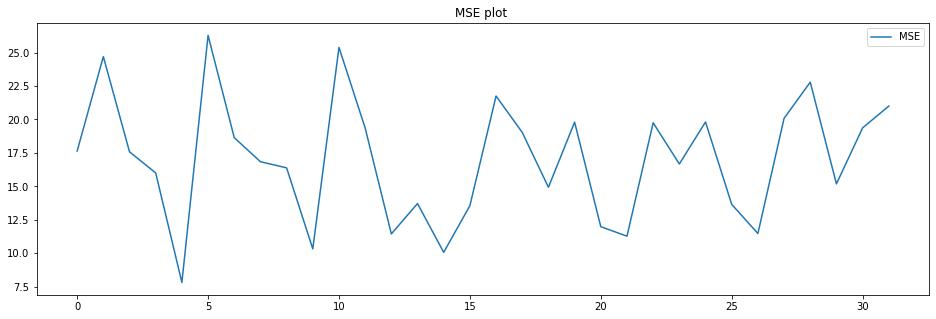


Shapiro_Wilk Test
Statistics=0.980, p=0.7932600975
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.227
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 168
mean=18.907,median=18.865 ,max=33.25,min=8.91,variance=25.988


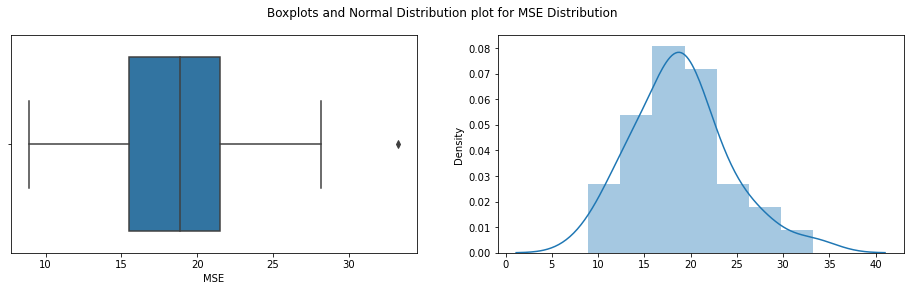

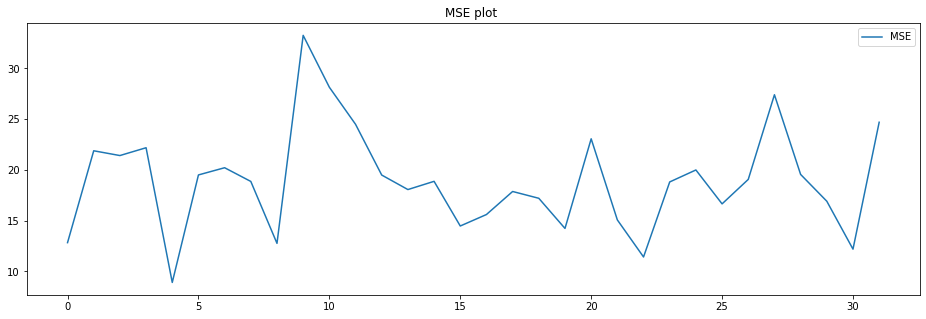


Shapiro_Wilk Test
Statistics=0.973, p=0.5720163584
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.321
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 169
mean=16.743,median=15.22 ,max=27.96,min=9.2,variance=25.793


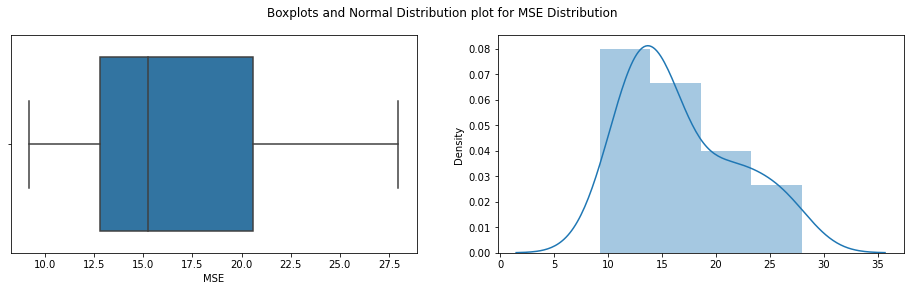

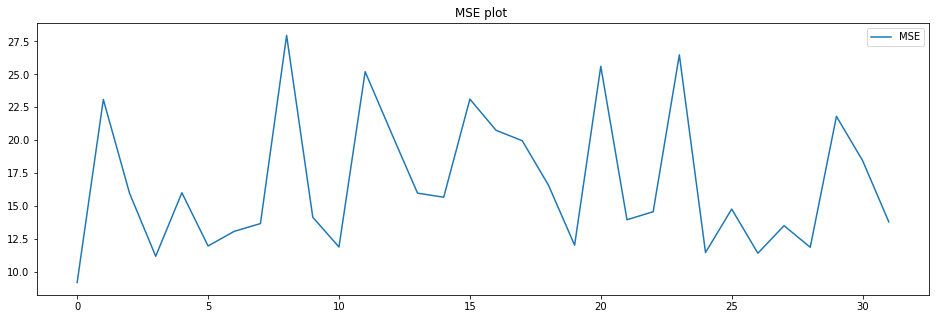


Shapiro_Wilk Test
Statistics=0.912, p=0.0124942260
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.098
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 170
mean=17.538,median=17.395 ,max=30.11,min=6.84,variance=29.835


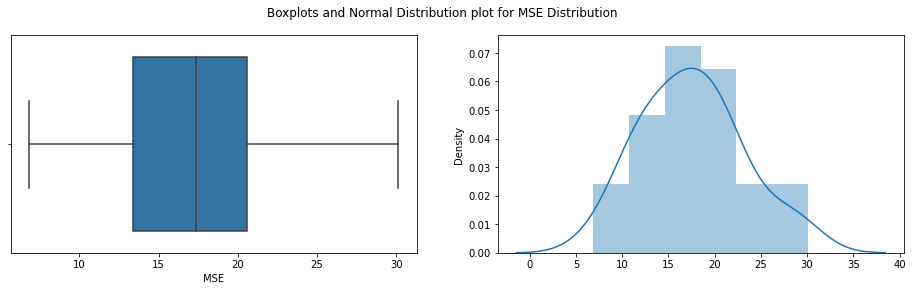

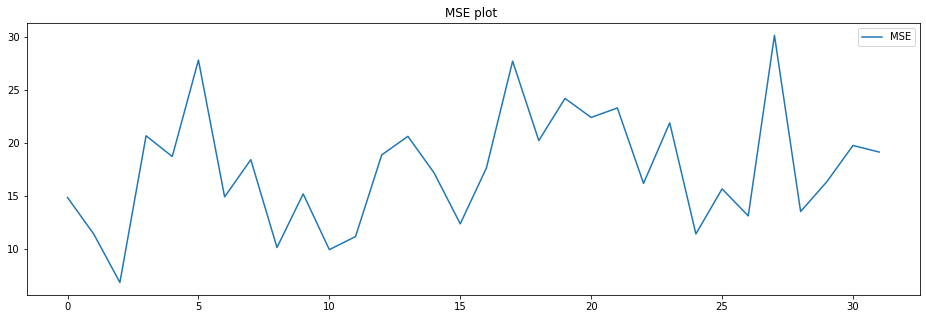


Shapiro_Wilk Test
Statistics=0.982, p=0.8440241218
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.185
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 171
mean=16.952,median=17.245 ,max=28.67,min=8.22,variance=19.293


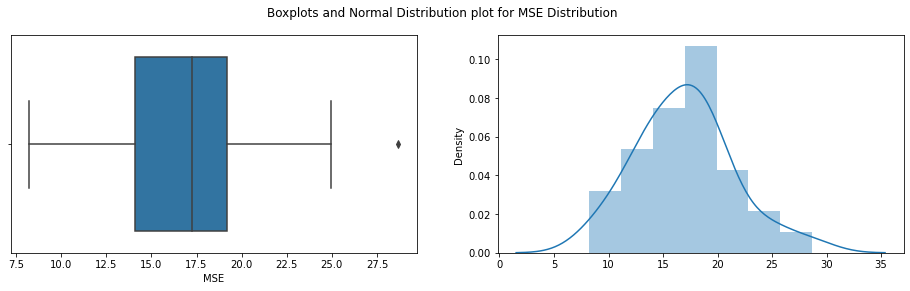

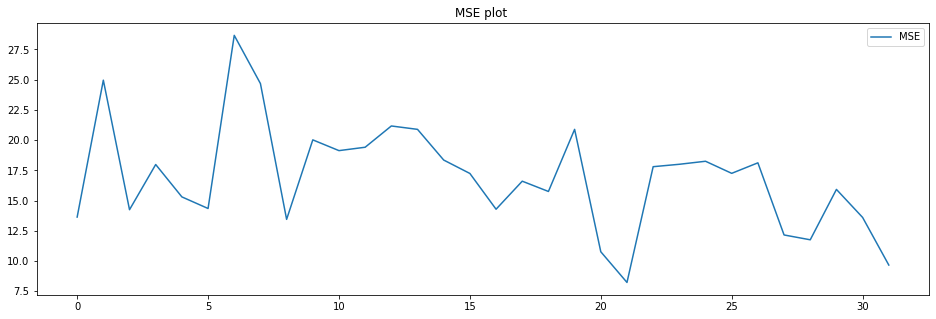


Shapiro_Wilk Test
Statistics=0.978, p=0.7485402226
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.262
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 172
mean=18.274,median=17.355 ,max=28.03,min=11.31,variance=20.387


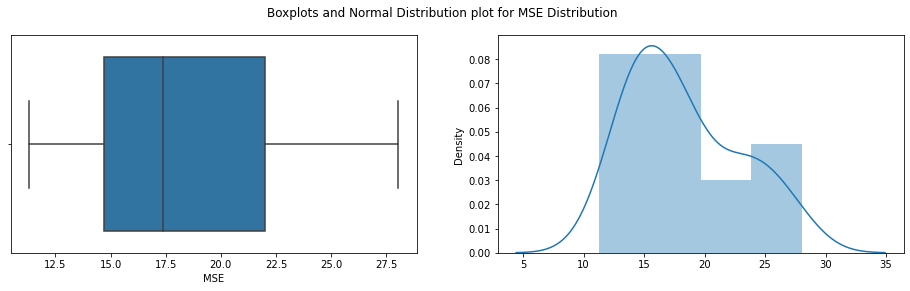

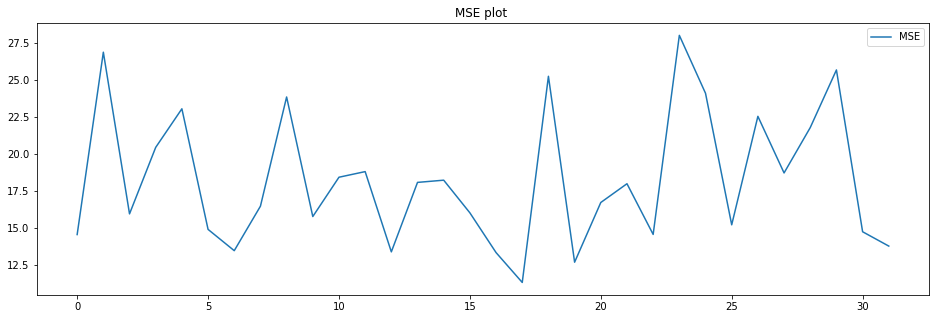


Shapiro_Wilk Test
Statistics=0.932, p=0.0457491688
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 0.811
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 173
mean=17.544,median=17.1 ,max=31.74,min=5.9,variance=24.371


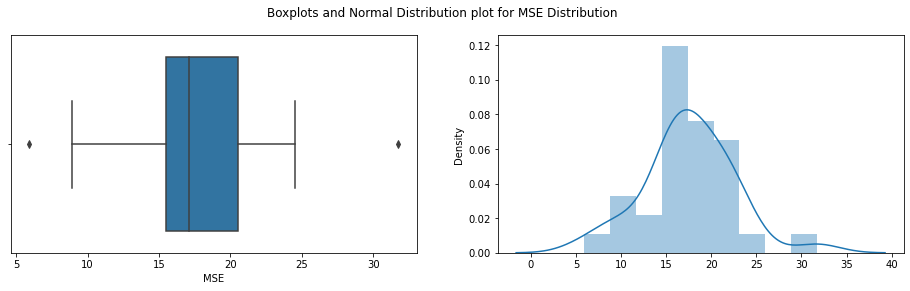

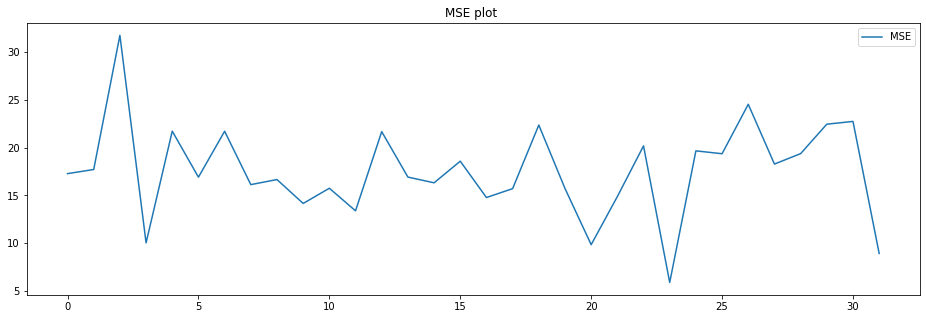


Shapiro_Wilk Test
Statistics=0.966, p=0.3890366852
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.425
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 174
mean=16.709,median=17.085 ,max=25.07,min=8.73,variance=19.997


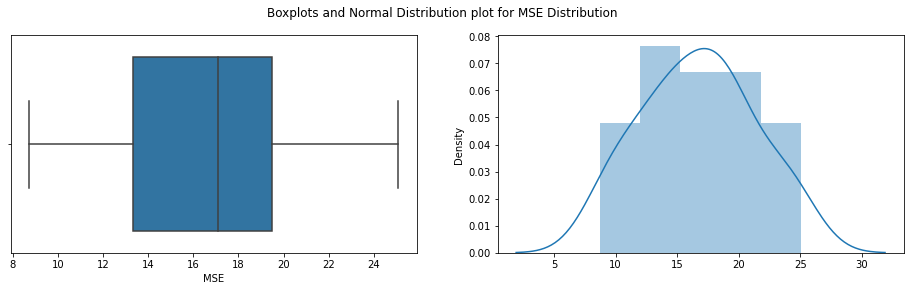

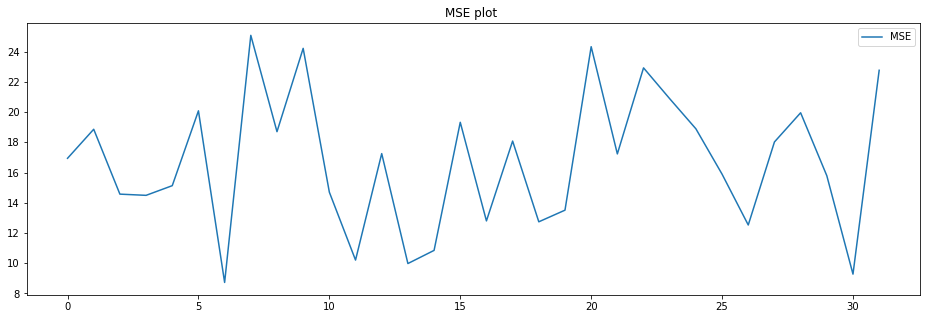


Shapiro_Wilk Test
Statistics=0.973, p=0.5936257839
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.192
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 175
mean=18.273,median=18.265 ,max=29.64,min=11.93,variance=13.834


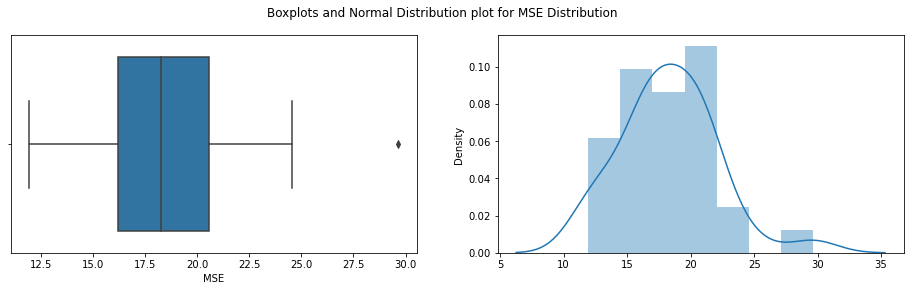

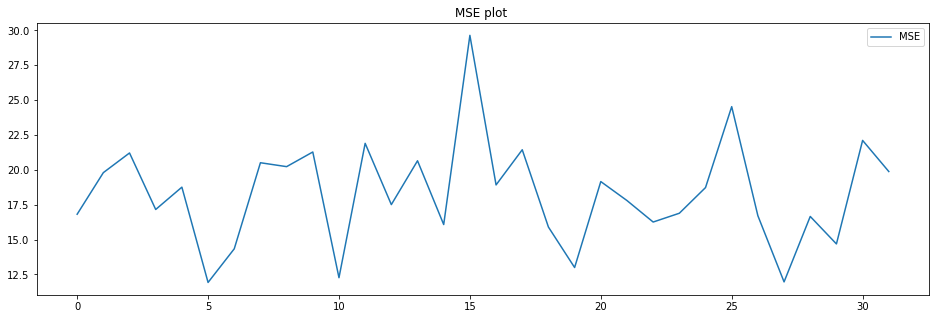


Shapiro_Wilk Test
Statistics=0.957, p=0.2206806093
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.322
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 176
mean=17.274,median=17.1 ,max=26.42,min=9.35,variance=19.121


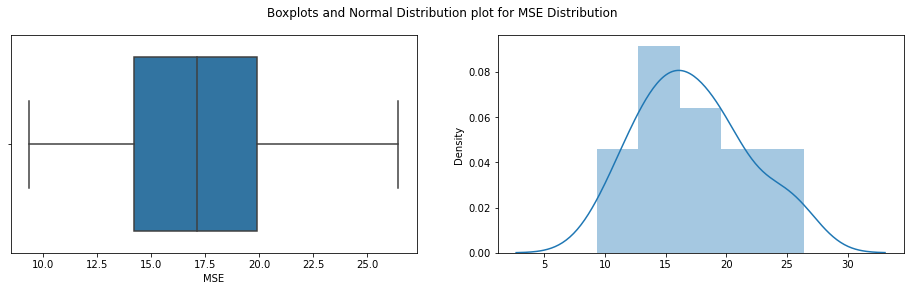

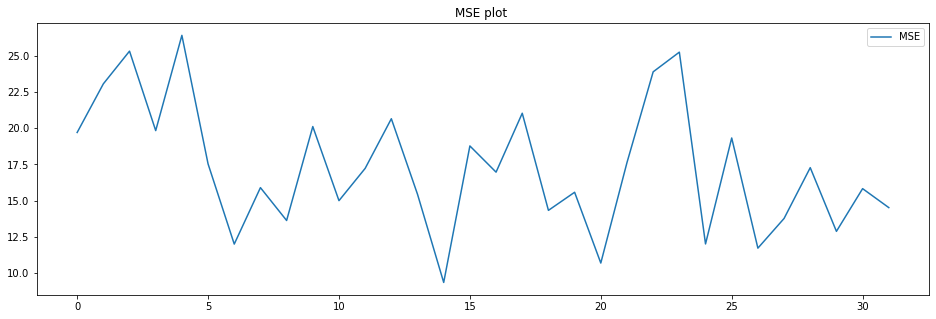


Shapiro_Wilk Test
Statistics=0.972, p=0.5578058362
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.268
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 177
mean=16.949,median=15.98 ,max=30.79,min=9.8,variance=21.783


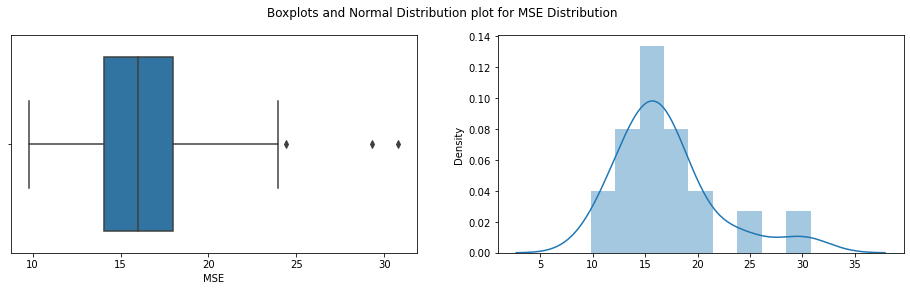

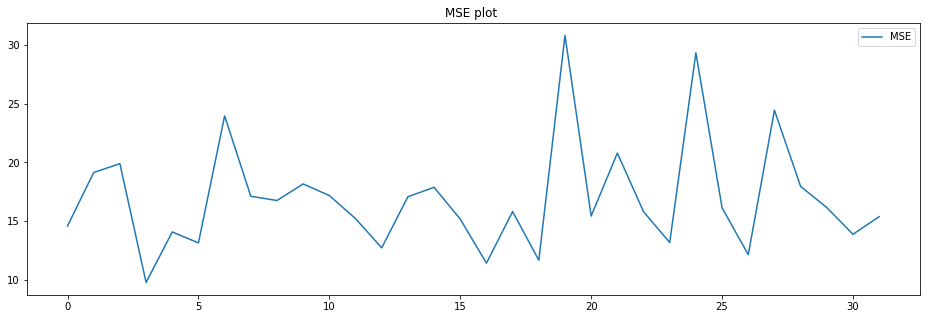


Shapiro_Wilk Test
Statistics=0.882, p=0.0022566132
Sample does not look Gaussian (reject H0)

Anderson_Darling Test
Statistic: 1.241
15.000: 0.523, data does not look normal (reject H0)
10.000: 0.596, data does not look normal (reject H0)
5.000: 0.715, data does not look normal (reject H0)
2.500: 0.834, data does not look normal (reject H0)
1.000: 0.992, data does not look normal (reject H0)

 ********************
Batch: 178
mean=17.544,median=17.025 ,max=31.29,min=7.35,variance=31.877


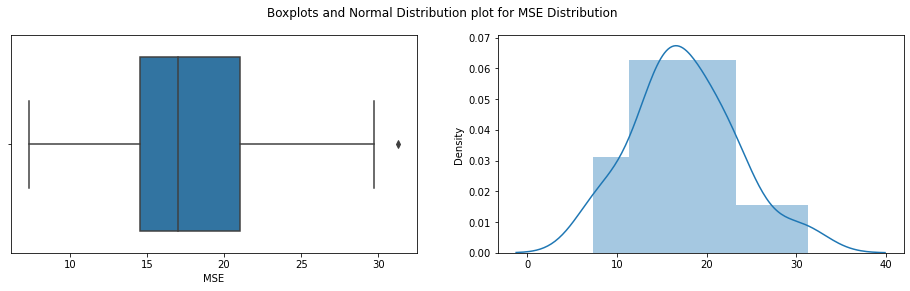

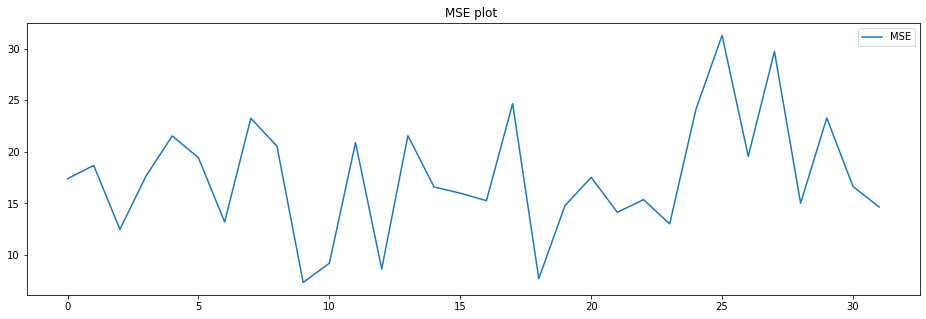


Shapiro_Wilk Test
Statistics=0.974, p=0.6254850626
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.248
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 179
mean=18.001,median=17.905 ,max=31.2,min=6.47,variance=34.31


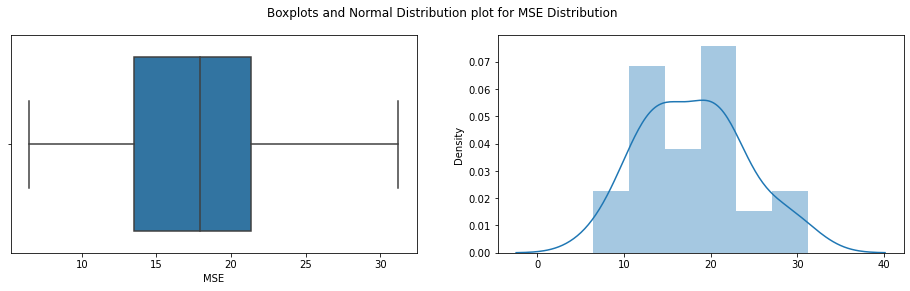

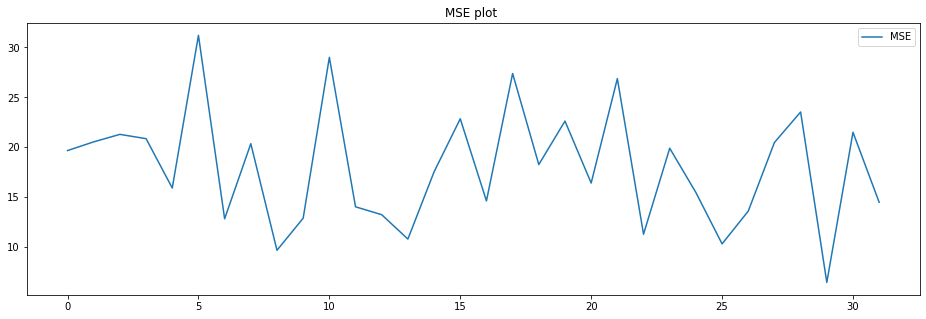


Shapiro_Wilk Test
Statistics=0.979, p=0.7716832161
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.270
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 180
mean=17.898,median=17.81 ,max=29.36,min=9.46,variance=29.62


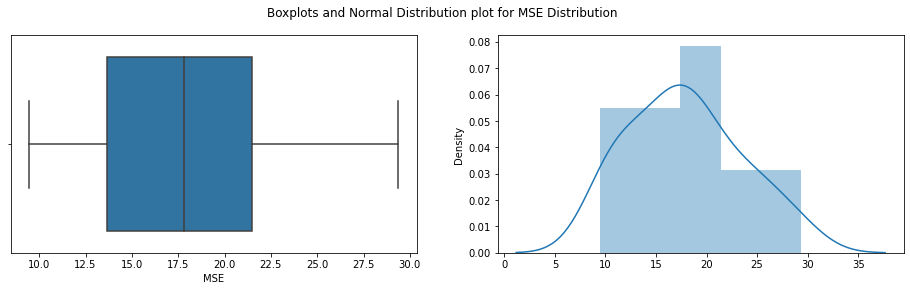

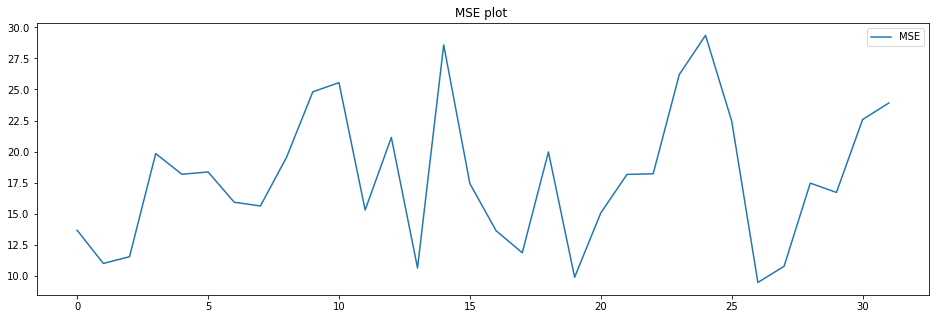


Shapiro_Wilk Test
Statistics=0.963, p=0.3369826376
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.296
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 181
mean=17.137,median=17.685 ,max=25.21,min=6.55,variance=22.643


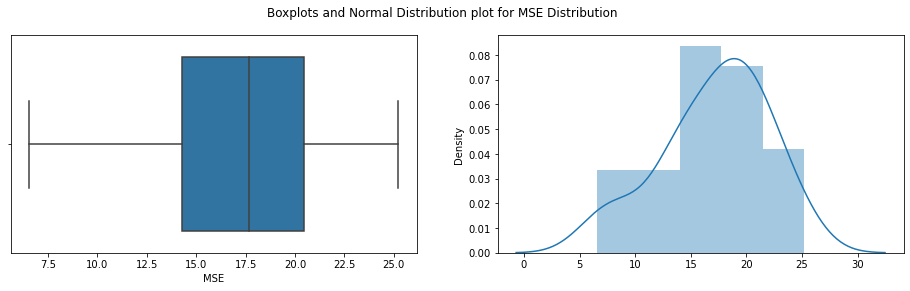

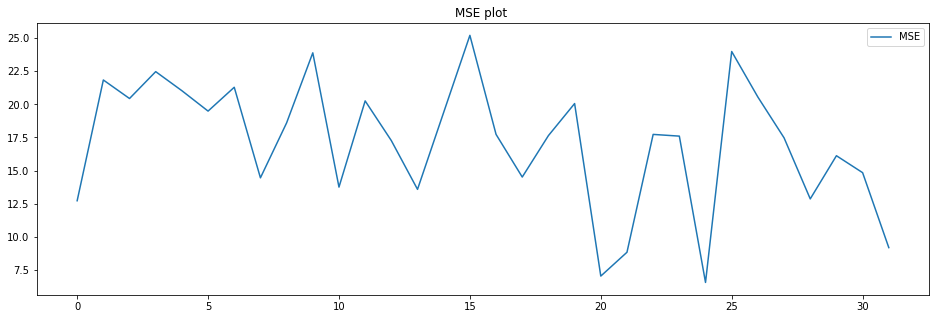


Shapiro_Wilk Test
Statistics=0.957, p=0.2290187776
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.450
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 182
mean=16.854,median=17.585 ,max=24.7,min=9.43,variance=20.307


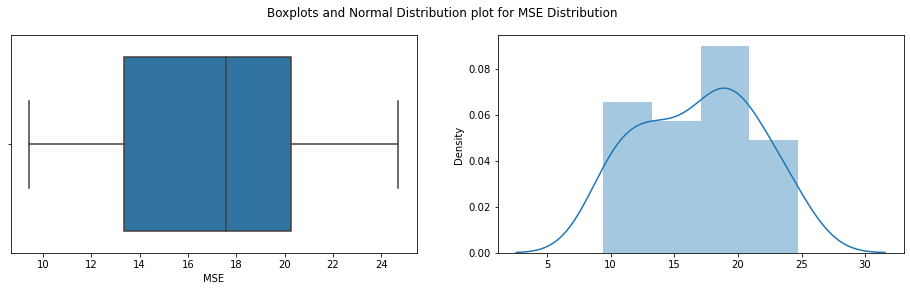

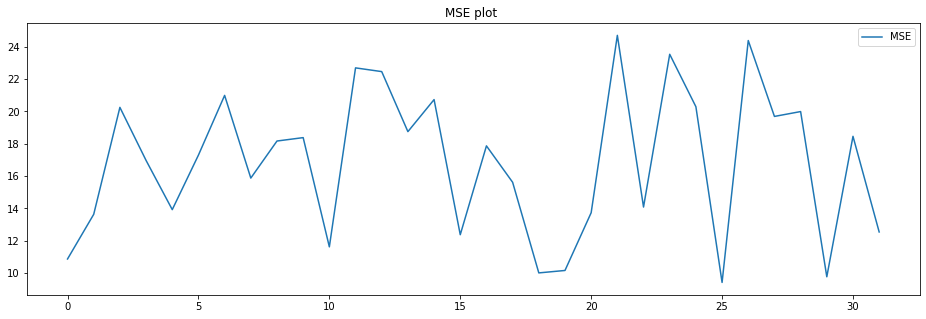


Shapiro_Wilk Test
Statistics=0.956, p=0.2099780440
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.389
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 183
mean=18.498,median=17.635 ,max=32.47,min=8.9,variance=34.091


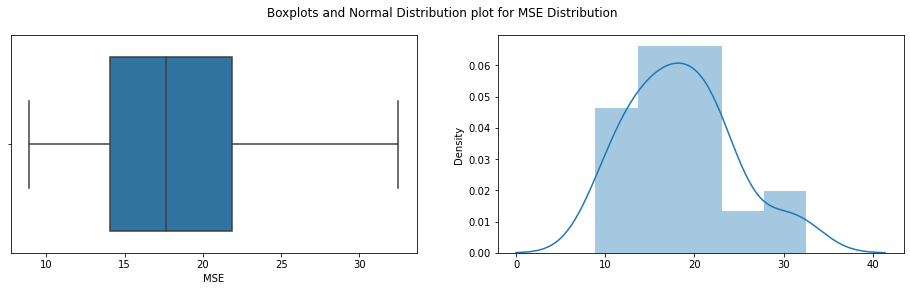

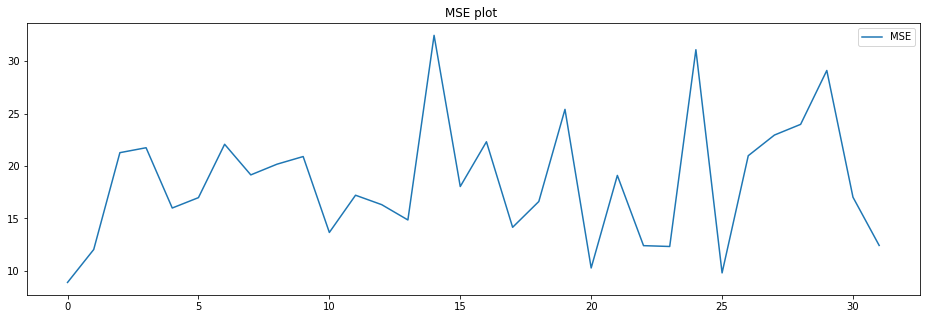


Shapiro_Wilk Test
Statistics=0.964, p=0.3457532823
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.308
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 184
mean=17.62,median=17.31 ,max=26.78,min=12.03,variance=11.708


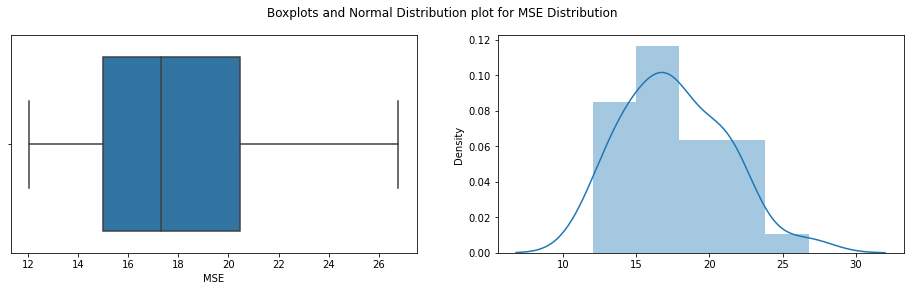

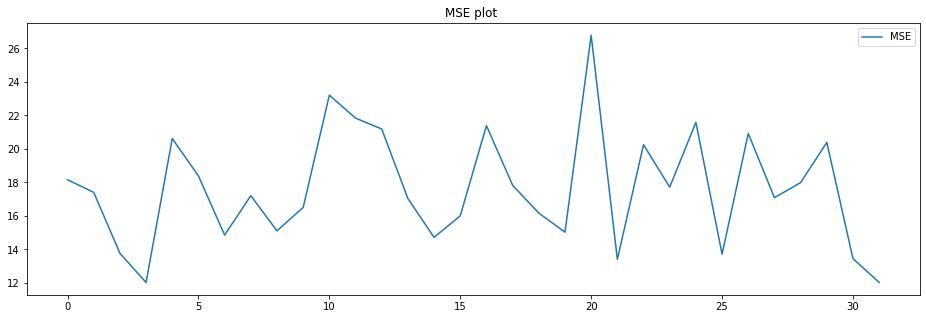


Shapiro_Wilk Test
Statistics=0.967, p=0.4157554209
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.331
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 185
mean=17.168,median=16.14 ,max=30.43,min=7.55,variance=23.764


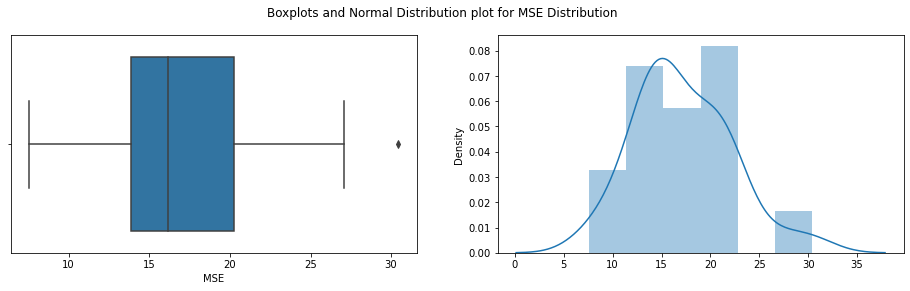

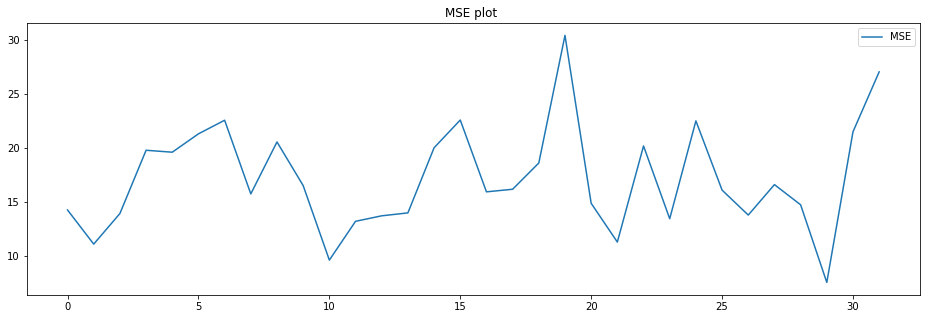


Shapiro_Wilk Test
Statistics=0.967, p=0.4126730859
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.438
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 186
mean=17.736,median=17.265 ,max=28.81,min=7.22,variance=24.152


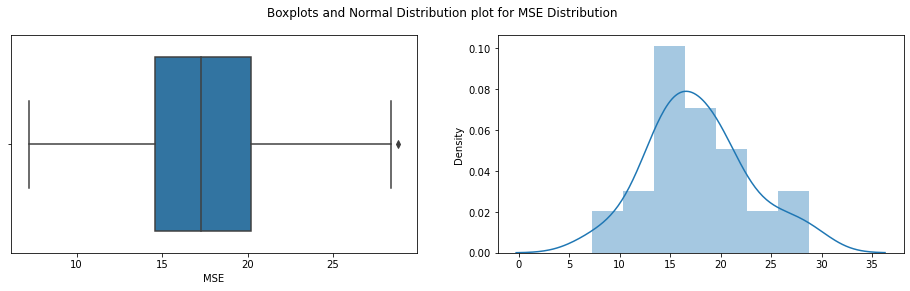

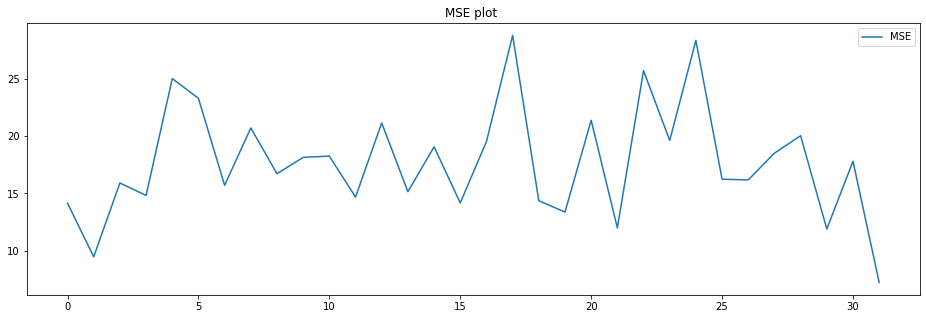


Shapiro_Wilk Test
Statistics=0.976, p=0.6646925807
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.321
15.000: 0.523, data looks normal (fail to reject H0)
10.000: 0.596, data looks normal (fail to reject H0)
5.000: 0.715, data looks normal (fail to reject H0)
2.500: 0.834, data looks normal (fail to reject H0)
1.000: 0.992, data looks normal (fail to reject H0)

 ********************
Batch: 187
mean=18.899,median=18.665 ,max=24.39,min=10.35,variance=19.719


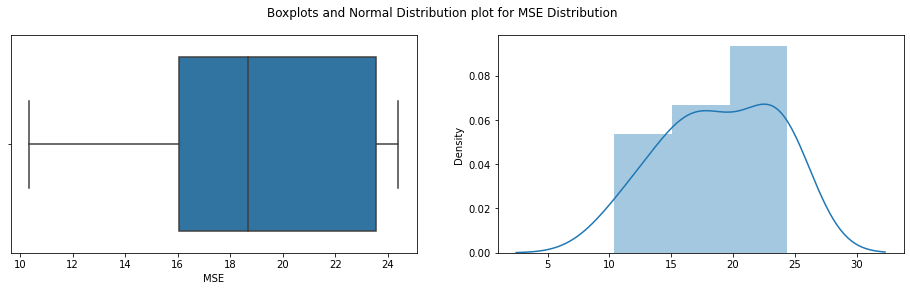

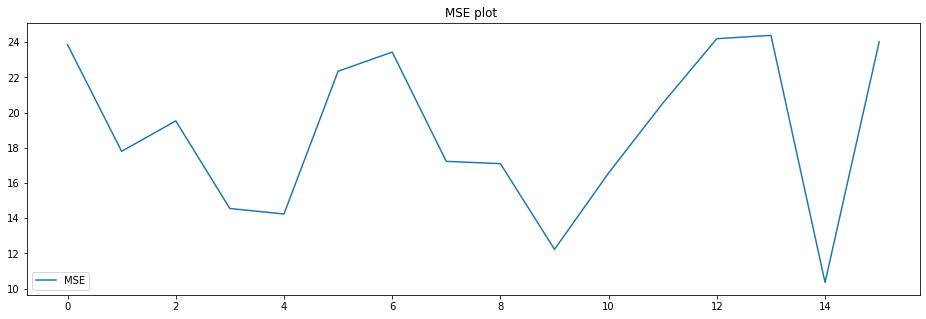


Shapiro_Wilk Test
Statistics=0.922, p=0.1849641651
Sample looks Gaussian (fail to reject H0)

Anderson_Darling Test
Statistic: 0.431
15.000: 0.500, data looks normal (fail to reject H0)
10.000: 0.569, data looks normal (fail to reject H0)
5.000: 0.683, data looks normal (fail to reject H0)
2.500: 0.797, data looks normal (fail to reject H0)
1.000: 0.948, data looks normal (fail to reject H0)


In [47]:
batch_avg_mse_pos,batch_mse_values_pos=check_all_batch_normality(batches_pos,encoder_pos_class,32)

# 10. Computing MSE Thresholds for Positive AE

In [48]:
instance_thresh_pos,zscore_list_pos =compute_instance_threshold_firstN_batches(batch_mse_values_pos,30)

In [49]:
instance_thresh_pos

32.5191

In [50]:
thres_iqr_batch_pos, thres_zscore_batch_pos ,thresh_max_batch_pos=compute_batch_threshold_testdata(batch_avg_mse_pos)

In [51]:
thres_zscore_batch_pos

20.1497

In [52]:
Anderson_Darling(zscore_list_pos)

Statistic: 0.478
15.000: 0.521, data looks normal (fail to reject H0)
10.000: 0.593, data looks normal (fail to reject H0)
5.000: 0.712, data looks normal (fail to reject H0)
2.500: 0.830, data looks normal (fail to reject H0)
1.000: 0.988, data looks normal (fail to reject H0)


In [53]:
# Counts the MSE values exceeding threshold in each batch 
exceed_count_pos,total_pos=threshold_exceed_count(batch_mse_values_pos,instance_thresh_pos)

In [54]:
exceed_list_pos=[]
for key in exceed_count_pos.keys():
    exceed_list_pos.append(exceed_count_pos[key])

mean=0.106,median=0.0 ,max=1,min=0,variance=0.095


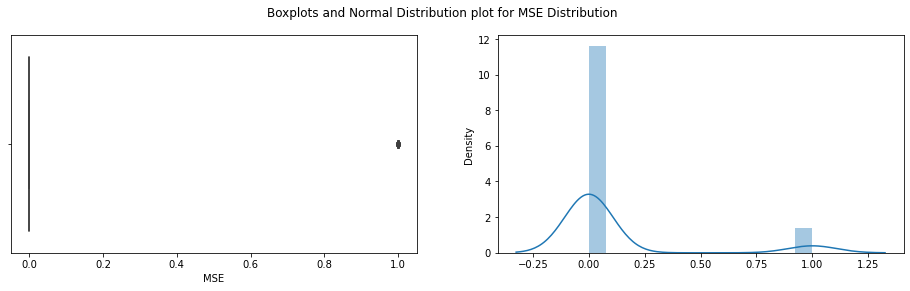

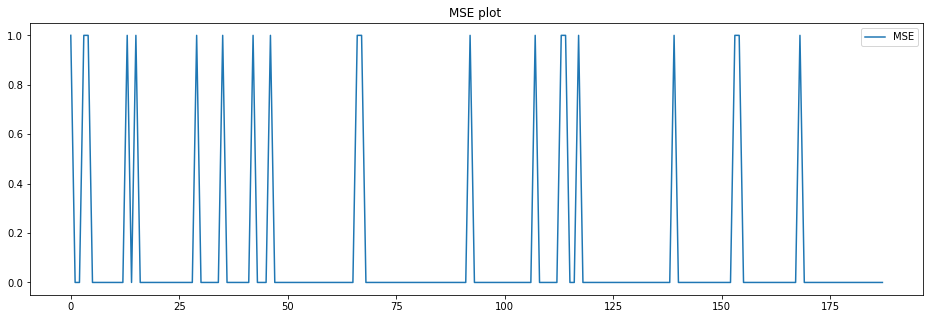

In [55]:
plot_results(exceed_list_pos)

In [56]:
count_thresh_pos=np.max(exceed_list_pos)

In [106]:
count_thresh_pos

1

# Normal Test Data

In [58]:
norm_stream_pos

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
27000,5.722762,1.543777,4.743855,2.175322,6.099661,1.291195,3.131648,8.533854,6.064693,2.800415
27001,3.970281,4.573016,6.991495,4.477593,8.564760,2.797092,5.673388,7.036932,0.096617,4.940149
27002,1.802638,3.755666,2.283493,4.271251,8.408099,6.367386,4.532381,6.787337,3.217042,5.783303
27003,4.241019,-2.340540,8.861254,5.737684,8.787620,2.408030,2.114544,5.208257,4.750726,6.959127
27004,0.642966,2.683600,2.296399,4.187127,4.306138,3.300470,6.022546,3.641172,1.369030,3.418388
...,...,...,...,...,...,...,...,...,...,...
29995,4.919365,3.322232,4.137949,1.320460,6.519938,6.407848,5.227216,6.417398,9.755089,2.217206
29996,5.345147,3.563019,4.121803,2.010489,6.191873,0.307139,0.957778,4.384819,4.889699,1.986153
29997,0.235771,5.762417,0.570729,1.083621,5.483241,7.336639,2.684372,6.543001,4.938474,2.105759
29998,0.298889,1.308412,1.729743,3.323593,7.519552,4.857242,6.382718,4.140849,2.802253,3.656998


In [59]:
norm_stream_neg

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
27000,0.360815,-0.139974,0.115670,0.614490,0.386471,0.184458,-0.294066,0.217033,0.726108,0.488311
27001,0.314596,0.442711,0.230779,0.584915,0.245518,0.596523,0.638701,0.259749,1.017097,0.064841
27002,0.396888,0.616091,0.346125,0.494385,0.228529,-0.249638,0.217830,0.057940,0.646474,1.057236
27003,0.724991,0.213838,-0.338607,0.407983,0.392332,0.229531,-0.113958,0.137307,0.320977,0.319106
27004,0.580748,0.325937,0.545196,0.290012,0.623928,0.012406,-0.263631,0.147927,0.386273,1.029161
...,...,...,...,...,...,...,...,...,...,...
29995,0.554944,0.216006,0.791711,0.611292,0.577069,0.242370,0.235001,0.047469,0.711636,0.509178
29996,0.545315,0.613607,0.703232,0.848024,0.322854,0.328843,-0.097564,0.231939,0.668561,0.881640
29997,0.384641,-0.051360,0.512534,0.630905,0.523059,0.194155,0.435721,0.201439,0.100658,0.267332
29998,0.581861,-0.172083,0.474366,0.776106,0.252150,-0.133894,0.547090,0.151689,0.399171,-0.250732


In [60]:
normal_stream=pd.concat([norm_stream_pos,norm_stream_neg]).reset_index(drop=True)

In [61]:
normal_stream

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,5.722762,1.543777,4.743855,2.175322,6.099661,1.291195,3.131648,8.533854,6.064693,2.800415
1,3.970281,4.573016,6.991495,4.477593,8.564760,2.797092,5.673388,7.036932,0.096617,4.940149
2,1.802638,3.755666,2.283493,4.271251,8.408099,6.367386,4.532381,6.787337,3.217042,5.783303
3,4.241019,-2.340540,8.861254,5.737684,8.787620,2.408030,2.114544,5.208257,4.750726,6.959127
4,0.642966,2.683600,2.296399,4.187127,4.306138,3.300470,6.022546,3.641172,1.369030,3.418388
...,...,...,...,...,...,...,...,...,...,...
5995,0.554944,0.216006,0.791711,0.611292,0.577069,0.242370,0.235001,0.047469,0.711636,0.509178
5996,0.545315,0.613607,0.703232,0.848024,0.322854,0.328843,-0.097564,0.231939,0.668561,0.881640
5997,0.384641,-0.051360,0.512534,0.630905,0.523059,0.194155,0.435721,0.201439,0.100658,0.267332
5998,0.581861,-0.172083,0.474366,0.776106,0.252150,-0.133894,0.547090,0.151689,0.399171,-0.250732


In [62]:
from sklearn.utils import shuffle

In [63]:
normal_stream = shuffle(normal_stream).reset_index(drop=True)

In [64]:
normal_stream

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,-0.692346,2.363488,6.472388,5.244805,4.161714,2.941507,1.567753,8.614354,0.834534,3.144334
1,1.968641,4.617282,2.977018,3.824383,5.785234,4.058744,1.864793,6.668838,4.473252,1.001239
2,0.362355,0.566885,0.874767,0.405126,0.390392,0.267489,0.078110,0.152304,0.447552,0.350720
3,3.887998,0.448849,4.160919,3.848137,5.915736,1.114439,2.424986,6.200186,4.380204,8.901255
4,0.744099,0.479332,0.882356,0.372621,0.576365,0.305175,0.436322,0.222286,0.055480,0.479813
...,...,...,...,...,...,...,...,...,...,...
5995,0.468186,0.368752,0.638086,0.489417,0.334473,0.216268,0.416938,0.157883,0.550217,0.676400
5996,5.913864,5.960293,8.668491,5.686085,4.274079,6.857055,2.653996,9.234060,3.873821,4.681203
5997,1.442710,5.090022,4.039088,10.092854,6.030346,5.818705,1.020706,6.636634,5.280383,6.419820
5998,1.611367,5.322616,1.198150,4.544988,6.759706,-1.263141,2.584818,6.181458,3.485723,1.565122


In [65]:
batches_n, batch_size=make_batches(normal_stream)

In [66]:
def detect_at_batch_level(test_batch,b,batch_thres_pos,batch_thres_neg,count_thresh_pos,count_thres_neg,instance_thresh_pos,instance_thresh_neg, all_excede_list):
    
    # Layer 1 Variables 
    mse_list_layer1=[]     # Holds the MSE values predicted by Layer 1 Autoencoder for a single batch
    exceed_count_layer1=0  # How many instances exceed layer one instance level threshold
    mse_sum=0              # sum of MSE values from layer 1 AE for this batch
    #batch_mse_layer1=[]
    
    
    # Layer 2 Variables 
    mse_list_layer2=[]      # Holds the MSE values predicted by Layer 2 Autoencoder for a single batch
    exceed_count_layer2=-1  # If a batch is not passed to the layer2 AE , then exceed count value will be -1 . This is symbolic.
    mse_sum_layer2=0        # sum of MSE values from layer 2 AE for this batch
    
        
    layer1_excede_list=[] # Hold the batch numbers of bathces exceeding layer thresholds
    #all_excede_list=[]    # Hold the batch number of batches exceeding both Layer-1 and Layer-2 AE Thresholds 
    layer_one_instance_exceed_list=[] # Holds the indices of instances exceeding layer 1 instance threshold
    layer_two_instance_exceed_list=[] # Holds the indices of instances exceeding layer 2 instance thresholds
     
      
    # Determine Layer 1 and Layer AE and their associated thresholds
    layer_one_batch_thres= batch_thres_pos if batch_thres_pos<batch_thres_neg  else batch_thres_neg
    layer_two_batch_thres= batch_thres_pos if batch_thres_pos>batch_thres_neg  else batch_thres_neg
    layer_one_encoder= encoder_pos_class if batch_thres_pos<batch_thres_neg else encoder_neg_class
    layer_two_encoder= encoder_pos_class if batch_thres_pos>batch_thres_neg else encoder_neg_class
    
    layer_one_count_threshold=count_thresh_pos if batch_thres_pos<batch_thres_neg  else count_thres_neg
    layer_two_count_threshold=count_thresh_pos if batch_thres_pos>batch_thres_neg  else count_thres_neg
    
    layer1_ins_thresh=instance_thresh_pos if  batch_thres_pos<batch_thres_neg  else instance_thresh_neg
    layer2_ins_thresh=instance_thresh_pos if  batch_thres_pos>batch_thres_neg  else instance_thresh_neg
    
    # Pass each instance of a batch from Layer 1 AE. Compute Batch MSE and Number of Instances excceding Layer 1 Instance Thresh       
    avg_mse_layer1=0
    for i in range(0,test_batch.shape[0]):
        ROW = np.array([test_batch[i]])
        pred= layer_one_encoder.predict(ROW) 
        mse = np.round(np.mean(np.power(test_batch[i] - pred, 2)),5)
        mse_list_layer1.append(mse)
        if mse>layer1_ins_thresh:
            exceed_count_layer1+=1
            layer_one_instance_exceed_list.append(i)
        mse_sum+=mse    
    avg_mse_layer1=(mse_sum)/len(test_batch)
    avg_mse_layer2=0 
    # Check if This batch exceeds both Layer 1 batch and count thresholds
    if ((avg_mse_layer1>layer_one_batch_thres) and ( exceed_count_layer1 >layer_one_count_threshold) ):
        layer1_excede_list.append(b)# Keep track of batches exceesding layer 1 thresholds
        exceed_count_layer2=0
        # Pass each instance of this batch to Layer 2 AE. Compute Batch MSE and Number of Instances excceding Layer 2 Instance Thresh
        for i in range(0,test_batch.shape[0]):
            ROW = np.array([test_batch[i]])
            pred= layer_two_encoder.predict(ROW) 
            mse = np.round(np.mean(np.power(test_batch[i] - pred, 2)),5)
            mse_list_layer2.append(mse)
            if mse>layer2_ins_thresh:
                exceed_count_layer2+=1
                layer_two_instance_exceed_list.append(i)
            mse_sum_layer2+=mse    
        avg_mse_layer2=(mse_sum_layer2)/len(test_batch)
        
        if  (avg_mse_layer2 > layer_two_batch_thres) and (exceed_count_layer2>layer_two_count_threshold):
            all_excede_list.append(b)# Keep track of batches exceesding layer 2 thresholds
          
    return  all_excede_list,mse_list_layer1 , exceed_count_layer1 ,avg_mse_layer2,exceed_count_layer2,len(layer_two_instance_exceed_list),layer_two_batch_thres,layer_two_count_threshold,layer_one_instance_exceed_list,layer_two_instance_exceed_list,avg_mse_layer1 

In [67]:
# This function makes a list of dictionary values
def return_list_of_dict_values(d):
    values_list=[]
    for key in d.keys():
        values_list.append(d[key])
    return values_list

In [103]:
# This function takes two lists of Batch MSE and Exceed Counts along with Batch and Count Thresholds of Layer 2 AE
# If three consecutive bathces exceed booth thresholds , warning is generated and for 10 consectutive batches drift is confirmed.
def detect_drift(batch_mse,exceed_list, Thresh,count_thresh):
    n=0 # total number of batches where MSE exceeds threshold
    count=0 ## counts the number of consecutive batches exceding threshold
    w_count=0 # Count of elements in Window. Windows contains batch number where batch MSE exceeds
              #threshold 
    w_index_list=[] # Contains indices of batches where batch MSE esceeds threshold 
    for i in range(0,len(batch_mse)):
        #print (batch_mse)
        if((((batch_mse[i])>Thresh)) and (exceed_list[i]>count_thresh)):
            print(' Threshold exceeds at batch : {}'.format(i))
            n=n+1
            #print('Cumulative Batch Count Exceeding Threshold : {}'.format(n))
            if(len(w_index_list)==0 or (i-w_index_list[-1]==1)):
                # Check if w_index_list is empty or its last entry is the previous batch
                    w_index_list.append(i)# then append this batch to w_index_list
            count+=1
            #if (i!= w_index_list[-1]
            #print ("Batch %d MSE exceeds Threshold" %i)
            print(w_index_list)
            if (count>2):# if for more than nine consecutive batches , batch MSE esceeds threshold , then 
                         # confirm drift
                drift_batch=i-2 # at the first batch i this window

                print( " Drift Confirmed at Batch No : % d" %drift_batch)
            if (len(w_index_list)>=1 and len(w_index_list)<=2):
                w_level=i-len(w_index_list)
                print("Warning Level at Batch",i)
        
        if(batch_mse[i])<Thresh:
            count=0 # reset count 
            #if len(w_index_list)>=2:
               # w_level=i-len(w_index_list)
                #print("Warning Level at Batch",w_level)
            if len(w_index_list)<=3:
                w_index_list=[]
        
   

In [69]:
def detect_stream_drift(batches,encoder_pos_class,encoder_neg_class,batch_thres_pos,batch_thres_neg, count_thresh_pos,count_thres_neg):
    exceed_count_layer2_instance_thresh={} # Holds Number of instances exceeding thresholds of Both Layer 1 and layer 2 AE.
    
    mse_dict_L1={}         # Holds batchwise MSE values from Layer 1 AE
    exceed_count_L1={}     # Batchwise number of Instances exceeding layer 1 count threshold
    layer_one_instance_exceed_list={} # batch wise list of instances ( indices ) exceeding Layer 1 count threshold
    avg_mse_l1={}
    
    mse_dict_L2={}        # Holds batchwise MSE values from Layer 2 AE
    exceed_count_L2={}    # Batchwise number of Instances exceeding layer 2 count threshold
    layer_two_instance_exceed_list={} # For each batch maintains the indices where MSE exceeds layer 2 threshold
    avg_mse_l2={}         #
    all_excede_list=[]
    n=0
    for b in batches:
        print("\n\n")
        print("**************")
        print('\nBatch Number : {}'.format(b))
        all_excede_list,mse_dict_L1[b],exceed_count_L1[b],avg_mse_l2[b],exceed_count_L2[b],exceed_count_layer2_instance_thresh[b],layer_two_batch_thres,layer_two_count_threshold,layer_one_instance_exceed_list[b],layer_two_instance_exceed_list[b],avg_mse_l1[b]= detect_at_batch_level(batches[b],b,batch_thres_pos,batch_thres_neg,count_thresh_pos,count_thres_neg,instance_thresh_pos,instance_thresh_neg, all_excede_list)
             
        
        print('\nData Points Exceeding Layer 1 Encoder Instance Threshold : {} '.format(layer_one_instance_exceed_list[b]))
        print('\nData Points Exceeding Layer 2 Encoder Instance Threshold: {}'.format(layer_two_instance_exceed_list[b])) 
        print('\nNumber of Data Points Exceeding Layer 2 Encoder Instance thresholds: {}'.format(exceed_count_layer2_instance_thresh[b]))
        
    mse_list_layer1=return_list_of_dict_values(avg_mse_l1)
    exceed_count_list_layer1=return_list_of_dict_values(exceed_count_L1)
    
    
    ## Detect Drift at Batch Level 
    print ("\n Drift Detection at Batch Level\n")
    exceed_list=return_list_of_dict_values(exceed_count_L2)
    mse_list=return_list_of_dict_values(avg_mse_l2)
    detect_drift(mse_list,exceed_list,layer_two_batch_thres,layer_two_count_threshold )
        
    return all_excede_list,exceed_count_layer2_instance_thresh ,exceed_count_L2,avg_mse_l2 ,mse_list_layer1,exceed_count_list_layer1




In [104]:
all_excede_list_n,exceed_count_L2_instThresh_n ,exceed_count_L2_countThresh_n,avg_mse_l2_list_n,mse_list_layer1_n,exceed_count_list_layer1_n=detect_stream_drift(batches_n,encoder_pos_class,encoder_neg_class,thres_zscore_batch_pos,thres_zscore_batch_neg, count_thresh_pos,count_thresh_neg)




**************

Batch Number : 0

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 1, 3, 7, 10, 12, 14, 15, 17, 20, 23, 25, 28, 30, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 1

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 1, 2, 6, 7, 9, 10, 14, 15, 16, 17, 20, 21, 22, 23, 25, 27, 28, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 2

Data Points Exceeding Layer 1 Encoder Instance Threshold : [2, 3, 4, 6, 8, 12, 15, 19, 20, 21, 24, 27, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 3

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 2, 4, 5, 11, 12, 19, 21, 22, 23

# 11. Drifted Data 

In [73]:
normal=normal_stream[0:639]

In [74]:
drifted_pos = generate_data(4,9,1.5,3,10,3000)
drifted_neg= generate_data(0.3,0.9,0.1,0.5,10,3000)

In [75]:
normal

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,-0.692346,2.363488,6.472388,5.244805,4.161714,2.941507,1.567753,8.614354,0.834534,3.144334
1,1.968641,4.617282,2.977018,3.824383,5.785234,4.058744,1.864793,6.668838,4.473252,1.001239
2,0.362355,0.566885,0.874767,0.405126,0.390392,0.267489,0.078110,0.152304,0.447552,0.350720
3,3.887998,0.448849,4.160919,3.848137,5.915736,1.114439,2.424986,6.200186,4.380204,8.901255
4,0.744099,0.479332,0.882356,0.372621,0.576365,0.305175,0.436322,0.222286,0.055480,0.479813
...,...,...,...,...,...,...,...,...,...,...
634,-0.826493,2.665758,6.674469,6.172952,4.602907,1.402633,6.122460,8.207643,7.095798,7.880459
635,2.926485,4.343457,5.456992,3.517641,2.979766,4.642489,4.217245,7.921467,4.428339,6.081682
636,5.010552,-0.017868,1.850399,3.200170,8.240456,5.349638,2.555740,6.566604,1.701860,4.632023
637,0.321589,0.253273,0.541192,0.329109,0.299302,-0.080145,0.131677,0.198957,0.414868,0.181831


In [76]:
drifted_neg

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,0.482093,0.921906,0.327619,0.563276,0.543055,0.176592,0.520641,0.419103,0.535517,1.099299
1,0.389318,0.567118,0.770250,0.516565,0.557008,0.880946,0.393365,0.612612,0.633593,-0.298204
2,0.438334,0.901356,0.560436,0.704212,1.055144,0.112035,0.573138,0.438701,0.501716,-0.130618
3,0.261752,0.765019,1.215762,0.679354,0.866290,1.010551,0.549006,0.386273,0.669347,0.253789
4,0.327905,0.990505,0.358497,0.333994,0.829824,0.074939,0.910842,0.321136,0.455741,0.753483
...,...,...,...,...,...,...,...,...,...,...
2995,0.135914,0.970790,0.838694,0.474574,1.047485,0.776802,0.640390,0.608542,0.167338,0.089268
2996,0.425222,0.912062,0.655173,0.407202,1.054750,1.300437,0.632414,0.680854,0.462811,0.240999
2997,0.457788,0.793537,0.544082,0.410984,0.871737,0.138108,1.319047,1.200684,0.180459,0.586431
2998,0.401291,1.047760,1.060717,0.526753,0.773115,0.629984,0.769742,0.969944,0.050724,0.182919


In [77]:
drifted_stream=pd.concat([drifted_neg,drifted_pos]).reset_index(drop=True)

In [78]:
drifted_stream

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,0.482093,0.921906,0.327619,0.563276,0.543055,0.176592,0.520641,0.419103,0.535517,1.099299
1,0.389318,0.567118,0.770250,0.516565,0.557008,0.880946,0.393365,0.612612,0.633593,-0.298204
2,0.438334,0.901356,0.560436,0.704212,1.055144,0.112035,0.573138,0.438701,0.501716,-0.130618
3,0.261752,0.765019,1.215762,0.679354,0.866290,1.010551,0.549006,0.386273,0.669347,0.253789
4,0.327905,0.990505,0.358497,0.333994,0.829824,0.074939,0.910842,0.321136,0.455741,0.753483
...,...,...,...,...,...,...,...,...,...,...
5995,6.374287,6.556356,10.794356,10.628495,11.679818,3.964073,6.099954,8.169131,8.488768,8.588100
5996,3.950776,5.730160,10.120056,4.123003,10.192073,2.395059,5.327982,9.330761,7.762923,3.459703
5997,0.920790,5.128317,7.625079,16.617442,5.368327,3.976565,7.893964,4.606730,6.840637,9.265845
5998,7.543926,6.785600,10.388234,7.681125,3.340894,7.681003,6.650108,8.196934,12.342913,5.701036


In [79]:
drifted_stream = shuffle(drifted_stream).reset_index(drop=True)

In [80]:
drifted_stream=pd.concat([normal,drifted_stream]).reset_index(drop=True)

In [81]:
drifted_stream

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,-0.692346,2.363488,6.472388,5.244805,4.161714,2.941507,1.567753,8.614354,0.834534,3.144334
1,1.968641,4.617282,2.977018,3.824383,5.785234,4.058744,1.864793,6.668838,4.473252,1.001239
2,0.362355,0.566885,0.874767,0.405126,0.390392,0.267489,0.078110,0.152304,0.447552,0.350720
3,3.887998,0.448849,4.160919,3.848137,5.915736,1.114439,2.424986,6.200186,4.380204,8.901255
4,0.744099,0.479332,0.882356,0.372621,0.576365,0.305175,0.436322,0.222286,0.055480,0.479813
...,...,...,...,...,...,...,...,...,...,...
6634,6.258024,7.897015,6.035399,6.378503,11.620308,2.022141,7.852718,14.038277,9.486380,4.315940
6635,0.945150,7.147052,8.382226,8.099982,8.077232,-0.568717,8.626976,10.943561,5.624394,8.068323
6636,1.956268,7.925452,8.178502,6.270781,9.947019,3.474406,6.701733,9.359814,6.706096,4.851393
6637,9.690630,4.961265,8.884212,7.315270,7.333965,1.139143,7.930729,8.382295,8.135143,4.684122


In [82]:
batches_d, batch_size=make_batches(drifted_stream)

## Layered Drift Detector 

In [83]:
keys = (0, 1, 2,3,4,5,6,7,8,9,10,11)
test_batches = {k: batches_d[k] for k in keys}

In [105]:
all_excede_list_drifted,exceed_count_L2_instThresh_drifted ,exceed_count_L2_countThresh_drifted,avg_mse_l2_list_drifted,mse_list_layer1_drifted,exceed_count_list_layer1_drifted=detect_stream_drift(batches_d,encoder_pos_class,encoder_neg_class,thres_zscore_batch_pos,thres_zscore_batch_neg, count_thresh_pos,count_thresh_neg)




**************

Batch Number : 0

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 1, 3, 7, 10, 12, 14, 15, 17, 20, 23, 25, 28, 30, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 1

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 1, 2, 6, 7, 9, 10, 14, 15, 16, 17, 20, 21, 22, 23, 25, 27, 28, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 2

Data Points Exceeding Layer 1 Encoder Instance Threshold : [2, 3, 4, 6, 8, 12, 15, 19, 20, 21, 24, 27, 31] 

Data Points Exceeding Layer 2 Encoder Instance Threshold: []

Number of Data Points Exceeding Layer 2 Encoder Instance thresholds: 0



**************

Batch Number : 3

Data Points Exceeding Layer 1 Encoder Instance Threshold : [0, 2, 4, 5, 11, 12, 19, 21, 22, 23

## TWO SAMPLES T TEST  to compare drifted data and normal test data of positive class

In [244]:
def two_sample_tTest(sample1, sample2,alpha) :
    t_value,p_value=stats.ttest_ind(sample1,sample2)
    print('Test statistic is %f'%float("{:.6f}".format(t_value)))
    print('p-value for two tailed test is %f'%p_value)
    if p_value<=alpha:
        print('Conclusion :\n''Since p-value(=%f)'%p_value,'<','alpha(=%.2f)'%alpha,'''We reject the null hypothesis H0 and Accept H1 . So we conclude that\nThere is a drift in the dataset at %.2f level of significance.'''%alpha)
    else:
        print( 'Accept H0: There is no drift in the dataset')
    

In [245]:
two_sample_tTest(mse_list_layer1_drifted,mse_list_layer1_n, alpha=0.05)

Test statistic is 28.559042
p-value for two tailed test is 0.000000
Conclusion :
Since p-value(=0.000000) < alpha(=0.05) We reject the null hypothesis H0 and Accept H1 . So we conclude that
There is a drift in the dataset at 0.05 level of significance.


In [246]:
two_sample_tTest(exceed_count_list_layer1_n,exceed_count_list_layer1_drifted, alpha=0.05)

Test statistic is -32.632171
p-value for two tailed test is 0.000000
Conclusion :
Since p-value(=0.000000) < alpha(=0.05) We reject the null hypothesis H0 and Accept H1 . So we conclude that
There is a drift in the dataset at 0.05 level of significance.


In [247]:
two_sample_tTest(avg_mse_l2_list_drifted_values,avg_mse_l2_list_n_values, alpha=0.05)

Test statistic is 29.186906
p-value for two tailed test is 0.000000
Conclusion :
Since p-value(=0.000000) < alpha(=0.05) We reject the null hypothesis H0 and Accept H1 . So we conclude that
There is a drift in the dataset at 0.05 level of significance.


In [248]:
two_sample_tTest(exceed_count_L2_instThresh_n_values,exceed_count_L2_instThresh_drifted_values, alpha=0.05)

Test statistic is -35.182223
p-value for two tailed test is 0.000000
Conclusion :
Since p-value(=0.000000) < alpha(=0.05) We reject the null hypothesis H0 and Accept H1 . So we conclude that
There is a drift in the dataset at 0.05 level of significance.
